<div style="width: 100%; clear: both;">
<div style="float: left; width: 50%;">
<img src="http://www.uoc.edu/portal/_resources/common/imatges/marca_UOC/UOC_Masterbrand.jpg", align="left">
</div>
<div style="float: right; width: 50%;">
    <p style="margin: 0; padding-top: 22px; text-align:right;"><b>Treball de Final de Màster </b></p>
<p style="margin: 0; text-align:right;"><b>ANÀLISI DEL DIA MUNDIAL DE LES MALALTIES MINORITÀRIES (Font de dades: TWITTER)</b>.</p>
</div>
</div>
<div style="width:100%;">&nbsp;</div>


# PAC 3: Disseny i Implementació del TFM.

# Fase d'Anàlisi: 
## Tècniques d'aprenentatge no supervisat per la detecció de comunitats i temàtiques.
### CLUSTERING - Algorismes jeràrquic de tipus aglomeratiu amb variants d'enllaç complet, mitjana, ward, ponderat amb pessos.
<p style="color:#0000FF">
En aquest Jupyter Notebook, veurem com aplicar els diferents tipus d'enllaços possibles per l'algorisme jeràrquic aglomeratiu.
    S'apliquen sobre la mateixa matriu de vectorització millorada ja considerada amb l'algorisme KMeans, que resumim tot seguit:
    <br>
    Les mesures d'optimització aplicades són:<br>
</p>    
    <ol style="color:#0000FF">
        <li>Agrupar tots els textos d'un mateix autor dels tuits, i reduïr el nombre de files de la matriu de vectorització.</li>
        <li>Filtrar les paraules o vocabulari inclos en la vectorització, aplicant els filtres de nombre mínim i màxim d'aparicions possibles en cada tuit global de cada usuari.</li>
    </ol>
<p style="color:#0000FF">    
    Passem de considerar 98433 tuits a considerar 12408 sense perdre informació de contingut.<br>
    Passem d'un vocabulari de 19603 paraules a 213, amb la possible pèrdua de continguts o temàtiques minoritaris interessants.<br>
    Considerem les temàtiques a clústers definides per els mots més significatius, per tant també a part es podrien concloure temàtiques globals respecte
    el conjunt total de clústers.
</p>

In [1]:
# Descripció de les llibreries Python utilitzades:

import numpy as np
# NumPy és un paquet de processament de matrius de propòsit general. 
# Proporciona un objecte de matriu multidimensional d’alt rendiment i eines per treballar amb aquestes matrius. 
# És el paquet fonamental per a la computació científica amb Python.

import pandas as pd
# Pandas és l’eina per treballar amb dades tabulars: dades emmagatzemades en fulls de càlcul o bases de dades.
# Permet explorar, netejar i processar dades tabulars usant l'objecte DataFrame.
# Operations Seleccionar, filtrar per files o columnes o per una condition i exportar les dades o visualitzar-les.

from sklearn.feature_extraction.text import TfidfVectorizer
# Sklearn és un paquet/llibreria indicat per aplicar Aprenentatge Automàtic.
# Per l'extracció de característiques s'utilitza l'objecte 
# TfidfVectorizer per representar numericament mitjançant vectors dades texte.

from sklearn.cluster import KMeans, DBSCAN
# Per executar les implementacions dels algorismes de KMeans i DBSCAN
# utilitzem el mòdul 'cluster' de la llibreria Sklearn.

from sklearn.neighbors import NearestNeighbors
# Implementació de l'algorisme K-Nearest Neighbors
# per l'òptimització del paràmetre eps en l'execució
# de l'algorisme DBSCAN.

from sklearn.metrics.pairwise import cosine_similarity
# Implentació de la mètrica de similitud de vectors.
# S'ha usat per comparar aquesta mètrica de vectors
# amb la mètrica de distància euclidiana.

from sklearn.cluster import AgglomerativeClustering
# Implementació de l'algorisme jeràrquic de tipus Down Up
# o aglomeratiu. Finalment s'han comparat els resultats amb
# els resultats calculats amb la llibreria SCIPY.

import matplotlib.pyplot as plt
# matplotlib.pyplot permet la visualització gràfica, controlant tots
# els aspectes d'una gràfica des de la plantilla, títols, eixos, 
# representació de les dades, reixeta, etiquetes etc....

from matplotlib.ticker import FormatStrFormatter
import matplotlib.ticker as ticker
# Llibreries usades com a complement de la llibreria matplotlib.pyplot.
# Tractament específic dels eixos en la definició i 
# visualització de l'histograma resultat d'un agrupament.

import time
# Utilitzat per el càlcul de durada dels processos.

import delayedsparse
# Implementació eficient de matrius disperses per a diverses 
# anàlisis de components principals PCA. En concret ho apliquem
# per aplicar PCA a una matriu dispersa resultat de vectoritzar
# amb l'objecte TfidfVectorizer un volum de dades gran.

import scipy.sparse
# Llibreria per la manipulació de matrius disperses 
# SciPy 2-D per a dades numèriques.

import re, collections
# Llibreries 
# 're': usada per la definició, manipulació i tractament de
# text mitjançant 'expressions regulars'.
# 'collections': usada per el conteig de paraules en textos.
# i per la implementació del 'Ba of Words' (BoW)

from textblob import TextBlob, Word
# Llibreria de soport de l'anàlisi de sentiment 
# en paraules i frases, en concret s'ha aplicat al
# càlcul de la polaritat i subjectivitat en textos.

from nltk.tokenize import TweetTokenizer
from nltk.stem import LancasterStemmer, PorterStemmer
from nltk.corpus import stopwords
from nltk.probability import FreqDist
# NLTK: LLibreria formada per un conjunt de mòduls per el 
# tractament i manipulació de textos i tractament del llemguatge
# natural en general. En concret s'han usat en la fase de preprocessat.
# TweetTokenizer: Usat per obtenir els elements representatius o tokens.
#                en concret aquest mòdul és especific per textos de Twitter.
# LancasterStemmer, PorterStemmer: Mòduls valorats per l'operació de 
# steaming on s'obté el mot arrel i s'en descarten els derivats d'ell.
# Stopwords: Eliminació de les paraules freqüents por significatives
# sovint usades en el llenguatge per l'unió de frases o de complement
# a substantius i verbs.
# FreqDist: S'ha usat per el càlcul ràpid del conteig 
# de paraules o 'Bagg of words' (Bow).

from scipy.cluster.hierarchy import dendrogram, linkage, single, complete, ward
import scipy.cluster.hierarchy as hc
import scipy.spatial.distance as metrica
# Conjunt de llibreries per el càlcul dels diferents
# tipus d'enllaç en l'aplicació del algorisme jeràrquic aglomeratiu
# i les representacions mitjançant un dendrograma associades.

import fastcluster
# Alternativa a slearn al càlcul dels algorismes 
# d'agrupament i la seva representació.

from itertools import cycle, islice
# Llibreries optimitzades per la implementació
# d'iteracions eficients.



D:\conda3\lib\site-packages\sklearn\externals\six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)


In [2]:
# Llegir el dataset
time_start = time.time()
tuits = pd.read_excel("c:/users/qdeda/TFM_Code/DMMM_dataset_Final.xlsx")
temps=(time.time()-time_start)/60
print("Càrrega del Dataset: {} observacions. \nDurada: {} minuts {} segons." \
      .format(tuits.shape[0],int(temps) if temps>0 else 0,int((temps-int(temps))*60)))

Càrrega del Dataset: 98433 observacions. 
Durada: 0 minuts 29 segons.


In [3]:
# Transformacions:
t=tuits.drop(tuits[tuits.text_y.str.startswith('RT')].index)
# Juntem tuits d'un mateix autor.
t1 = t[['text_net','text_Norm','user_idstr']].groupby(['user_idstr']).agg(' '.join)
# Mitjana de polaritats i subjectivitats de tots els tuits
pol_subj = t[['user_idstr','polarity','subjectivity']].groupby(['user_idstr']).agg('mean')

# Eliminen paraules repetides
for row in t1.iterrows():
    tmp1=' '.join(set(row[1]['text_net'].split()))
    row[1]['text_net']=tmp1
    tmp2=' ' .join(set(row[1]['text_Norm'].split()))
    row[1]['text_Norm']=tmp2
# Reconstruim el dataset indexat per autor, perdem les identitats dels tuits
# tenim usuaris / paraules al construir el vector tfidf.
tuits = pd.merge(t1, pol_subj, left_on=t1.index, right_on=pol_subj.index, how='inner')
tuits.columns=['autor','text','text_norm','polaritat','subjectivitat']

# observem que les paraules obvies de hashtags queden per eliminar
excloure=['rare','day','today','february','disease','diseases','world']
for p in excloure:
    tuits.text=tuits.text.str.replace(p,"")
tuits.text

tuits=tuits.drop(tuits[tuits.text.str.len()==0].index)
tuits.reset_index(drop=True, inplace=True)
t=[]
t1=[]
t2=[]

In [4]:
tuits.head()


,autor,text,text_norm,polaritat,subjectivitat
0,284633,th visibilising seriously shitty idea behind ...,th ide shitty littl sery behind vis febru unde...,-0.306944,0.622222
1,286543,niente,nient,0.000000,0.000000
2,610873,clinical traditional profits organized reorgan...,foc cur fund ign profits backbon co bas many g...,0.178329,0.623134
3,627213,neurological checked variable oh lolol hey com...,oh disord lolol hey prob common neurolog nobod...,0.250000,0.650000
4,681573,idiocracy count,count diseas idiocr,0.000000,0.000000


In [5]:
tfidf_vect = TfidfVectorizer()
matriu_tfidf = tfidf_vect.fit_transform(tuits.text)
matriu_tfidf.shape

(12390, 19603)

In [6]:
tfidf_vect = TfidfVectorizer(min_df=0.01)
matriu_tfidf = tfidf_vect.fit_transform(tuits.text)
matriu_tfidf.shape

(12390, 221)

In [7]:
sorted(tfidf_vect.vocabulary_.items(), key=lambda x:x[1])

[('access', 0),
 ('across', 1),
 ('advocate', 2),
 ('affect', 3),
 ('affected', 4),
 ('affects', 5),
 ('alone', 6),
 ('also', 7),
 ('always', 8),
 ('amazing', 9),
 ('around', 10),
 ('attention', 11),
 ('awareness', 12),
 ('best', 13),
 ('better', 14),
 ('bring', 15),
 ('called', 16),
 ('campaign', 17),
 ('cancer', 18),
 ('care', 19),
 ('cause', 20),
 ('celebrate', 21),
 ('celebrated', 22),
 ('celebrating', 23),
 ('challenges', 24),
 ('check', 25),
 ('child', 26),
 ('children', 27),
 ('chronic', 28),
 ('clinical', 29),
 ('come', 30),
 ('common', 31),
 ('community', 32),
 ('condition', 33),
 ('conditions', 34),
 ('continue', 35),
 ('could', 36),
 ('cure', 37),
 ('daily', 38),
 ('dedicated', 39),
 ('diagnosed', 40),
 ('diagnosis', 41),
 ('different', 42),
 ('disorder', 43),
 ('disorders', 44),
 ('doctors', 45),
 ('done', 46),
 ('dr', 47),
 ('even', 48),
 ('event', 49),
 ('every', 50),
 ('everyone', 51),
 ('experience', 52),
 ('families', 53),
 ('family', 54),
 ('feb', 55),
 ('fight', 56),

## CAS ANÀLISI DE SENTIMENTS

### CAS DE TUITS AMB OPINIÓ POSITIVA

In [8]:
# filtrem aquells tuits amb subjectivitat >0.5
tuits_subj=tuits[tuits.subjectivitat>0.5]
tuits_subj.shape

(6461, 5)

In [9]:
# tuits subjectius positivament
tuits_pos=tuits_subj[tuits_subj.polaritat>=0.5]
print(tuits_pos.shape)

(962, 5)


### CAS DE TUITS AMB OPINIÓ NEGATIVA

In [10]:
# tuits subjectius negativament
tuits_neg=tuits_subj[tuits_subj.polaritat<-0.5]
tuits_neg.shape

(79, 5)

### VECTORITZACIÓ EN ANÀLISI DE SENTIMENT

In [11]:
tfidf_vect_pos = TfidfVectorizer()
matriu_tfidf_pos = tfidf_vect_pos.fit_transform(tuits_pos.text)

tfidf_vect_neg = TfidfVectorizer()
matriu_tfidf_neg = tfidf_vect_neg.fit_transform(tuits_neg.text)

In [12]:
print(matriu_tfidf_pos.shape)
print(matriu_tfidf_neg.shape)

(962, 2848)
(79, 461)


### Canvi de mètrica: Similaritat del cosinus.

In [13]:
# Similarity
similaritat = 1 - cosine_similarity(matriu_tfidf)
similaritat.shape

(12390, 12390)

In [14]:
def tokens_mes_propers(vector_clusters, vectorizer, mat_vect, topk=10):
    paraules = vectorizer.get_feature_names()
    relevant_labels = set(vector_clusters)
    for this_label in relevant_labels:
        matching_rows = np.where(vector_clusters == this_label)[0]
        coeff_sums = np.sum(mat_vect[matching_rows], axis=0).A1
        sorted_coeff_idxs = np.argsort(coeff_sums)[::-1]
        print('Cluster {}: '.format(this_label), end='')
        for idx in sorted_coeff_idxs[:topk]:
            print('{} '.format(paraules[idx]), end='')
        print()

## Algorismes Jeràrquics

In [7]:
# Reducció de la dimensionalitat amb PCA:
Xz = matriu_tfidf
n_comp=2
print("\nCreant el model i matriu PCA - Nº Components=",n_comp)
pca=delayedsparse.PCA(n_components=n_comp)
X_PCA = pca.fit(Xz).transform(Xz)
print("Dimensions de les dades reduïdes amb PCA:", np.shape(X_PCA))


Creant el model i matriu PCA - Nº Components= 2
Dimensions de les dades reduïdes amb PCA: (12390, 2)


### sklearn only “ward”, “complete”, “average”, “single”
### scipy : single, complete, average, weighted, centroid, median, ward

### ENLLAÇ WARD - Minimització de Variança

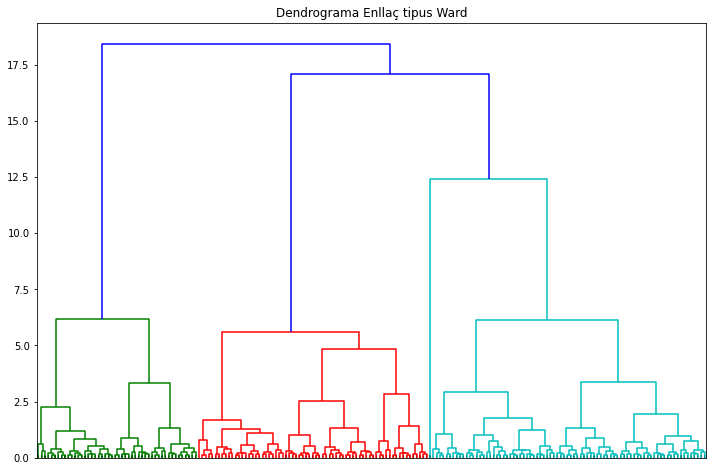

#Visualització dendrograma (PCA): (12390, 2) 
 Durada:  0 minut/s  6 segons.


In [14]:
# Visualització de tota la jerarquía de clústers
# usant un enllaç de tipus ward (Minimització variança):
lnk="Ward"
plt.figure(figsize=(12,8))
time_start = time.time()
Z1=hc.ward(X_PCA)
dn=dendrogram(Z1,
              truncate_mode='lastp', # Mostra només els últims p clústers units.
              p=200, # valor de p
              leaf_rotation=90., # rotació d'etiquetes en l'eix de les abcises.
              leaf_font_size=None, # mida de la font en les etiquetes de l'eix de les abcises.
              no_labels=True,
              show_contracted=True # val True quan s'aplica el 'truncate_mode'.
             )
temps=(time.time()-time_start)/60
plt.title("Dendrograma Enllaç tipus {}".format(lnk))
plt.savefig("dn_ward.jpg",format='jpg',bbox_inches='tight')
plt.show()
print("#Visualització dendrograma (PCA):",np.shape(X_PCA),"\n Durada: ",int(temps) if temps>0 else 0,"minut/s ", \
      int((temps-int(temps))*60),"segons.")


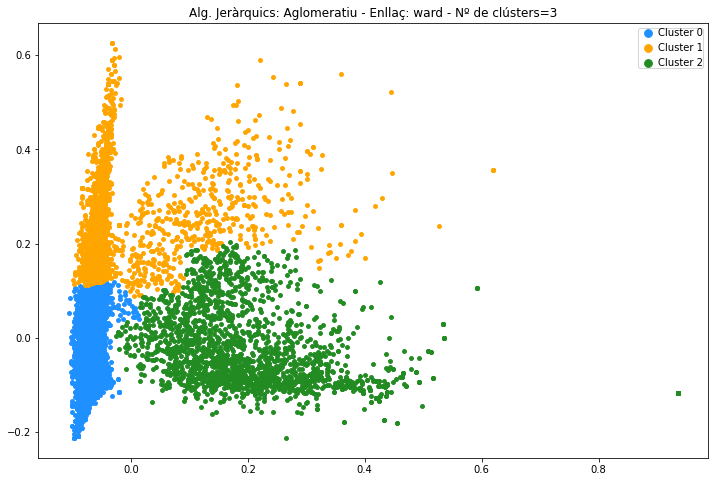

In [143]:
lnk='ward'
num_clusters=3
tall=hc.fcluster(Z1, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-ward_{}.jpg".format(num_clusters),format='jpg',bbox_inches='tight')
plt.show()


In [139]:
num_clusters=3
tall=hc.fcluster(Z1, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: research thank us patients support one know thanks like happy tomorrow many help great th 
Cluster 1: people million awareness living raise wide to one around support affected patients know help many 
Cluster 2: to awareness support one us research know patients every celebrated raise year many learn people 


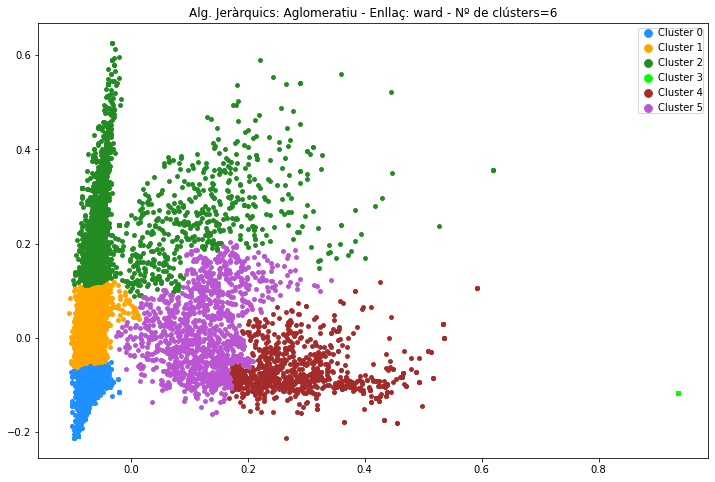

In [144]:
lnk='ward'
num_clusters=6
tall=hc.fcluster(Z1, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-ward_{}.jpg".format(num_clusters),format='jpg',bbox_inches='tight')
plt.show()


In [140]:
num_clusters=6
tall=hc.fcluster(Z1, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: thank thanks happy research latest great like good syndrome us years event also work tomorrow 
Cluster 1: support patients one help know awareness many research us proud families every care treatment learn 
Cluster 2: people million awareness living raise wide to one around support affected patients know help many 
Cluster 3: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 4: to celebrated one support want research us year celebrate international know work th awareness every 
Cluster 5: to awareness raise patients support people us research one know help every thank many share 


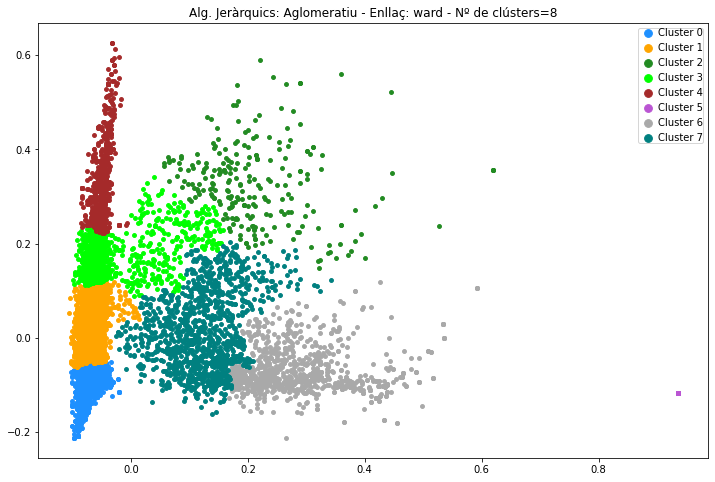

In [145]:
num_clusters=8
tall=hc.fcluster(Z1, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
lnk='ward'
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-ward_{}.jpg".format(num_clusters),format='jpg',bbox_inches='tight')
plt.show()


In [141]:
num_clusters=8
tall=hc.fcluster(Z1, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: thank thanks happy research latest great like good syndrome us years event also work tomorrow 
Cluster 1: support patients one help know awareness many research us proud families every care treatment learn 
Cluster 2: to people million living awareness wide around raise one learn know raising st families affect 
Cluster 3: people awareness raise million living patients support many affected one help know lives live to 
Cluster 4: people million living awareness one wide raise around affected support know help live suffer families 
Cluster 5: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 6: to celebrated one support want research us year celebrate international know work th awareness every 
Cluster 7: to awareness raise patients support people us research one know help every thank many share 


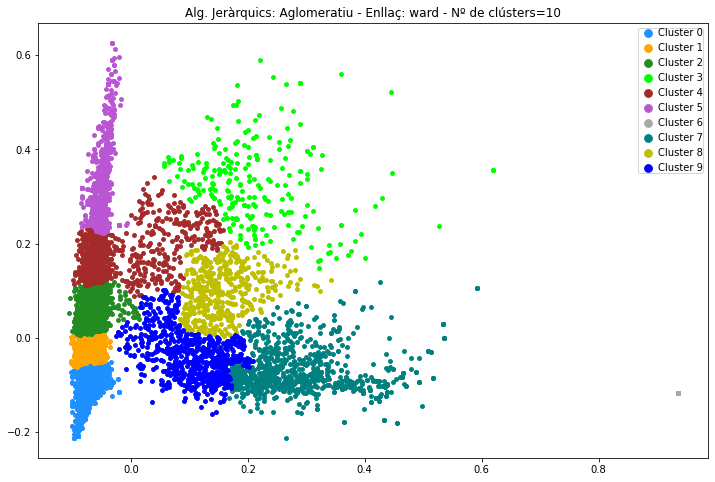

In [146]:
num_clusters=10
tall=hc.fcluster(Z1, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
lnk='ward'
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-ward_{}.jpg".format(num_clusters),format='jpg',bbox_inches='tight')
plt.show()


In [147]:
num_clusters=10
tall=hc.fcluster(Z1, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: thank thanks happy research latest great like good syndrome us years event also work tomorrow 
Cluster 1: know patients many one help us research support proud care treatment every families learn year 
Cluster 2: awareness support one patients help people raise living research families us raising many know every 
Cluster 3: to people million living awareness wide around raise one learn know raising st families affect 
Cluster 4: people awareness raise million living patients support many affected one help know lives live to 
Cluster 5: people million living awareness one wide raise around affected support know help live suffer families 
Cluster 6: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 7: to celebrated one support want research us year celebrate international know work th awareness every 
Cluster 8: to awareness raise people support patients impact know help lives living families learn million one 
Cluster 9: to us thank r

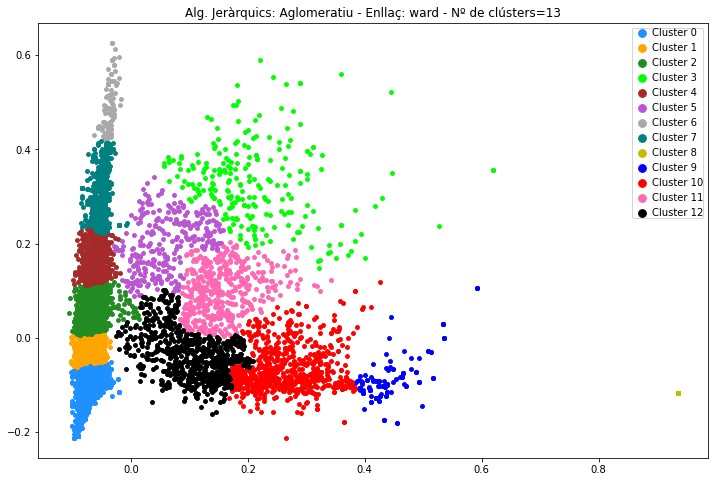

In [148]:
num_clusters=13
tall=hc.fcluster(Z1, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
lnk='ward'
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-ward_{}.jpg".format(num_clusters),format='jpg',bbox_inches='tight')
plt.show()


In [149]:
num_clusters=13
tall=hc.fcluster(Z1, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: thank thanks happy research latest great like good syndrome us years event also work tomorrow 
Cluster 1: know patients many one help us research support proud care treatment every families learn year 
Cluster 2: awareness support one patients help people raise living research families us raising many know every 
Cluster 3: to people million living awareness wide around raise one learn know raising st families affect 
Cluster 4: people awareness raise million living patients many affected support one know help life lives live 
Cluster 5: to awareness people living million raise support patients help many wide affected live us around 
Cluster 6: people million living wide one around awareness support raise know live suffer affected help many 
Cluster 7: people million living awareness raise one affected wide around support help know live patients families 
Cluster 8: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 9: to celebrated c

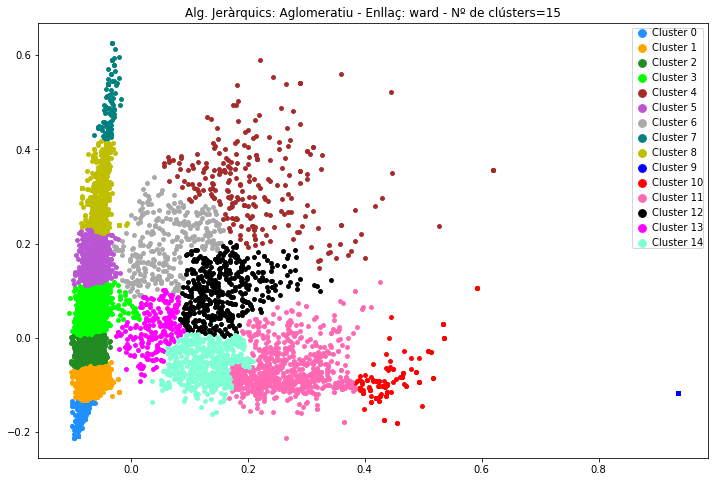

In [150]:
num_clusters=15
tall=hc.fcluster(Z1, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
lnk='ward'
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-ward_{}.jpg".format(num_clusters),format='jpg',bbox_inches='tight')
plt.show()


In [151]:
num_clusters=15
tall=hc.fcluster(Z1, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: thank latest thanks happy daily much news great sharing good last everyone health work event 
Cluster 1: research great like syndrome us good years tomorrow also event work international th love thank 
Cluster 2: know patients many one help us research support proud care treatment every families learn year 
Cluster 3: awareness support one patients help people raise living research families us raising many know every 
Cluster 4: to people million living awareness wide around raise one learn know raising st families affect 
Cluster 5: people awareness raise million living patients many affected support one know help life lives live 
Cluster 6: to awareness people living million raise support patients help many wide affected live us around 
Cluster 7: people million living wide one around awareness support raise know live suffer affected help many 
Cluster 8: people million living awareness raise one affected wide around support help know live patients families 
Cluster 9: to 

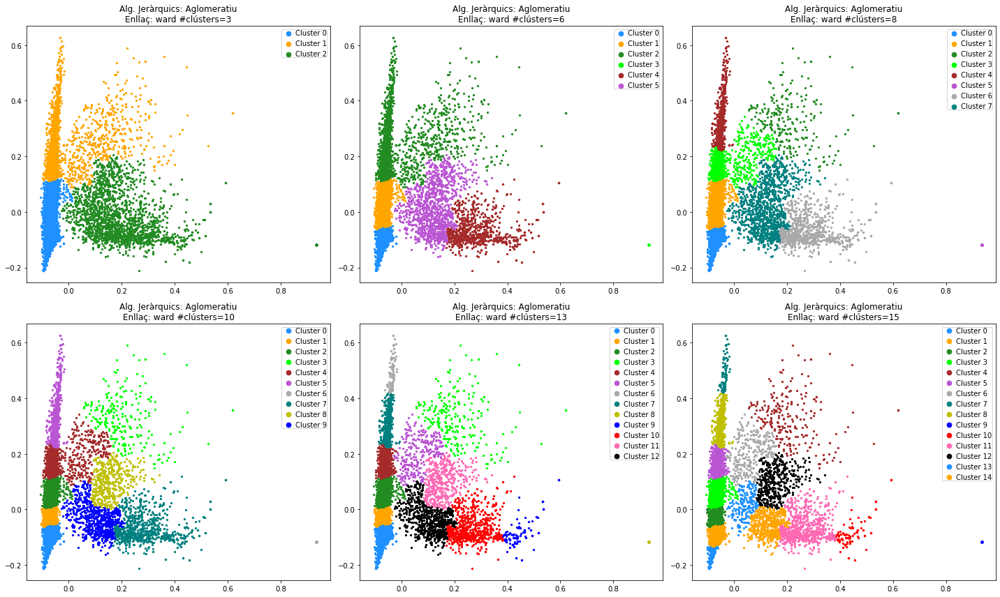

In [148]:
files=2
cols=3
lnk='ward'
alt=20
ample=12
m=0
fig, ax = plt.subplots(files,cols,figsize=(alt,ample))

llista_clusters=[3,6,8,10,13,15]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.fcluster(Z1, num_clusters, criterion='maxclust')-1
        colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                             'lime', 'brown', 'mediumorchid',
                                             'darkgrey', 'teal', 'y',
                                             'blue','red','hotpink','black',
                                             'magenta','aquamarine']),
                                              int(len(set(tall))))))
        cmap = plt.cm.Spectral
        norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
        for idcluster in range(num_clusters):
            ax[i,j].scatter(np.array(X_PCA[:,0][tall==idcluster]), \
                       np.array(X_PCA[:,1][tall==idcluster]), s=5, \
                       c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
            ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        ax[i,j].legend(handletextpad=0,borderpad=0,markerscale=3)
        m=m+1
plt.tight_layout()
plt.savefig("last_ward.jpg",format='jpg',bbox_inches='tight')

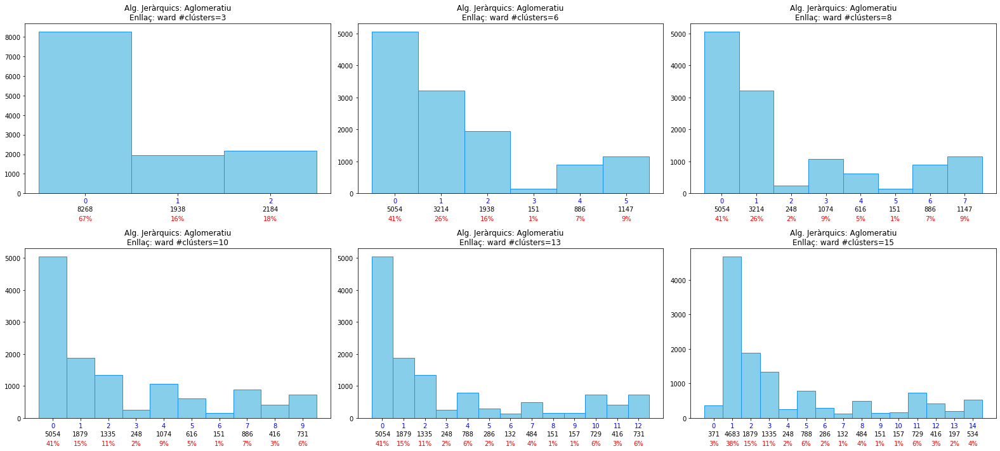

In [149]:
files=2
cols=3
lnk='ward'
alt=10
ample=22
m=0
fig, ax = plt.subplots(files,cols,figsize=(ample,alt))
llista_clusters=[3,6,8,10,13,15]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.fcluster(Z1, num_clusters, criterion='maxclust')-1
        counts, bins, patches = ax[i,j].hist(tall, bins=np.array(range(0,num_clusters+1)), facecolor='skyblue', edgecolor='dodgerblue')
        ax[i,j].xaxis.set_major_formatter(FormatStrFormatter('%0.0d'))
        bin_centers = 0.5 * np.diff(bins) + bins[:-1]
        ax[i,j].set_xticks(bin_centers)
        ax[i,j].set_xticklabels(bins, rotation=0,color='b')
        ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        for count, x in zip(counts.astype(int), bin_centers):
            # Label the raw counts
            ax[i,j].annotate(str(count), xy=(x, 0), xycoords=('data', 'axes fraction'),
                xytext=(0, -20), textcoords='offset points', va='top', ha='center')
            # Label the percentages
            percent = '%0.0f%%' % (100 * float(count) / counts.sum())
            ax[i,j].annotate(percent, xy=(x, 0), xycoords=('data', 'axes fraction'),
                xytext=(0, -35), textcoords='offset points', va='top', ha='center',c='r')
        m=m+1
        plt.tight_layout()
        
plt.savefig("hist_ward.jpg",format='jpg',bbox_inches='tight')

### ENLLAÇ SIMPLE

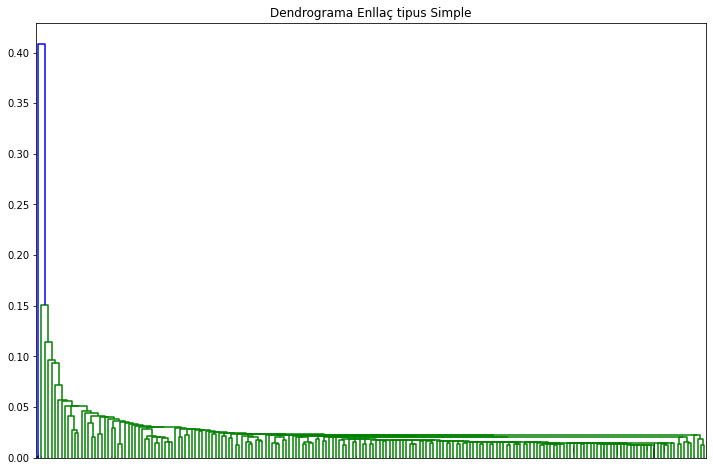

#Visualització dendrograma (PCA): (12390, 2) 
 Durada:  0 minut/s  16 segons.


In [15]:
# Visualització de tota la jerarquía de clústers
# usant un enllaç de tipus single:
lnk="Simple"
plt.figure(figsize=(12,8))
time_start = time.time()
Z2=hc.single(X_PCA)
dn=dendrogram(Z2,
              truncate_mode='lastp', # Mostra només els últims p clústers units.
              p=200, # valor de p
              leaf_rotation=90., # rotació d'etiquetes en l'eix de les abcises.
              leaf_font_size=None, # mida de la font en les etiquetes de l'eix de les abcises.
              no_labels=True,
              show_contracted=True # val True quan s'aplica el 'truncate_mode'.
             )
plt.title("Dendrograma Enllaç tipus {}".format(lnk))
plt.savefig("dn_single.jpg",format='jpg',bbox_inches='tight')
plt.show()
temps=(time.time()-time_start)/60
print("#Visualització dendrograma (PCA):",np.shape(X_PCA),"\n Durada: ",int(temps) if temps>0 else 0,"minut/s ", \
      int((temps-int(temps))*60),"segons.")


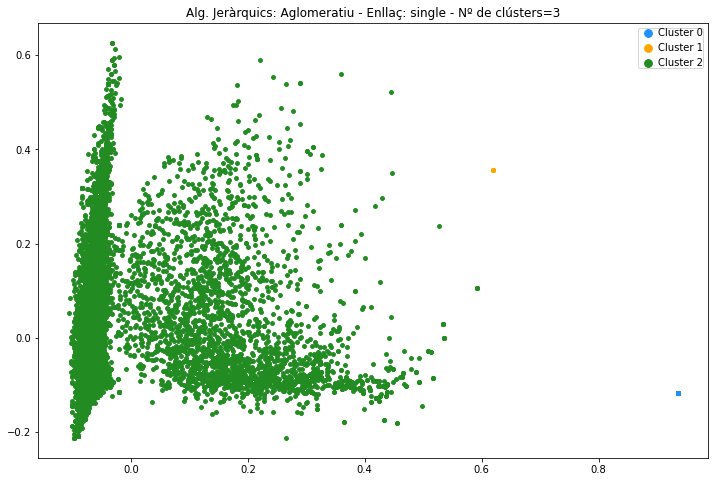

In [25]:
lnk='single'
num_clusters=3
tall=hc.fcluster(Z2, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-single_{}.jpg".format(num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [157]:
num_clusters=3
tall=hc.fcluster(Z2, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 1: people to yester honor help heard hear health hard happy group great good going go 
Cluster 2: to people awareness support one research patients us million know thank many help living raise 


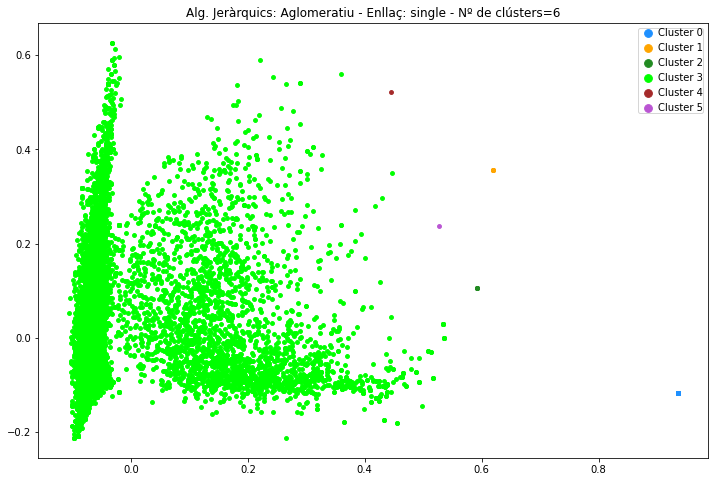

In [26]:
lnk='single'
num_clusters=6
tall=hc.fcluster(Z2, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-single_{}.jpg".format(num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [158]:
num_clusters=6
tall=hc.fcluster(Z2, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 1: people to yester honor help heard hear health hard happy group great good going go 
Cluster 2: awareness to yester going honor helping help heard hear health hard happy group great good 
Cluster 3: to people awareness support one research patients us million know thank many help living raise 
Cluster 4: million people to going helping help heard hear health hard happy group great good yester 
Cluster 5: million to yester go helping help heard hear health hard happy group great good going 


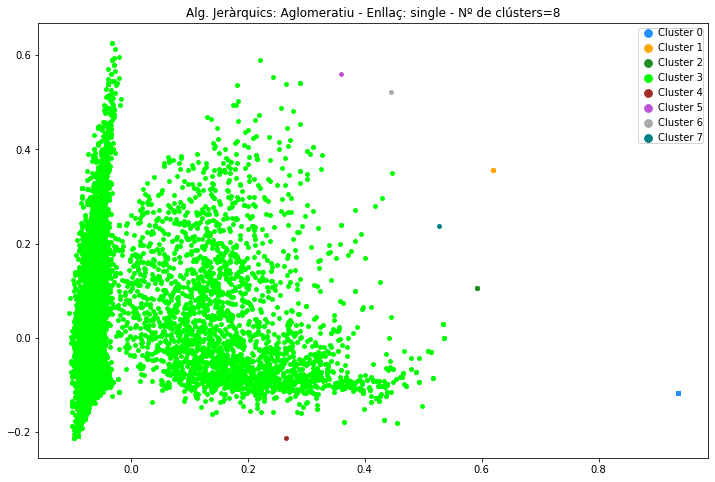

In [27]:
lnk='single'
num_clusters=8
tall=hc.fcluster(Z2, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-single_{}.jpg".format(num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [159]:
num_clusters=8
tall=hc.fcluster(Z2, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 1: people to yester honor help heard hear health hard happy group great good going go 
Cluster 2: awareness to yester going honor helping help heard hear health hard happy group great good 
Cluster 3: to people awareness support one research patients us million know thank many help living raise 
Cluster 4: latest thanks to yester going helping help heard hear health hard happy group great good 
Cluster 5: living million people to go help heard hear health hard happy group great good going 
Cluster 6: million people to going helping help heard hear health hard happy group great good yester 
Cluster 7: million to yester go helping help heard hear health hard happy group great good going 


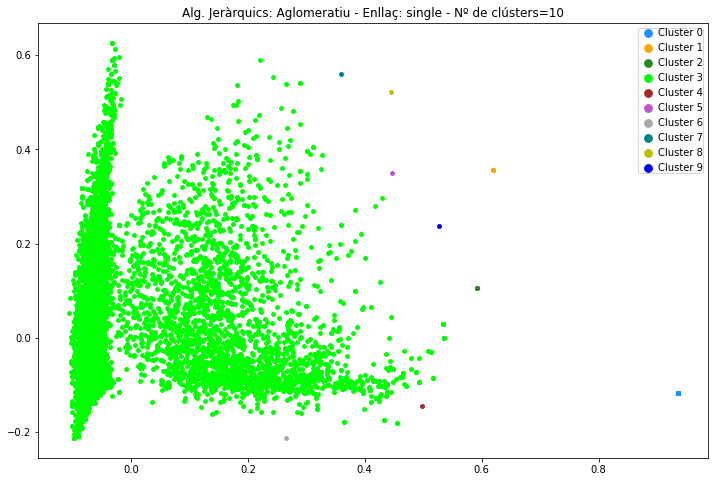

In [28]:
lnk='single'
num_clusters=10
tall=hc.fcluster(Z2, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-single_{}.jpg".format(num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [160]:
num_clusters=10
tall=hc.fcluster(Z2, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 1: people to yester honor help heard hear health hard happy group great good going go 
Cluster 2: awareness to yester going honor helping help heard hear health hard happy group great good 
Cluster 3: to people awareness support one research patients us million know many thank help living raise 
Cluster 4: to want work thank go helping help heard hear health hard happy group great good 
Cluster 5: one people to yester helping help heard hear health hard happy group great good going 
Cluster 6: latest thanks to yester going helping help heard hear health hard happy group great good 
Cluster 7: living million people to go help heard hear health hard happy group great good going 
Cluster 8: million people to going helping help heard hear health hard happy group great good yester 
Cluster 9: million to yester go helping help heard hear health hard happy group great good going 


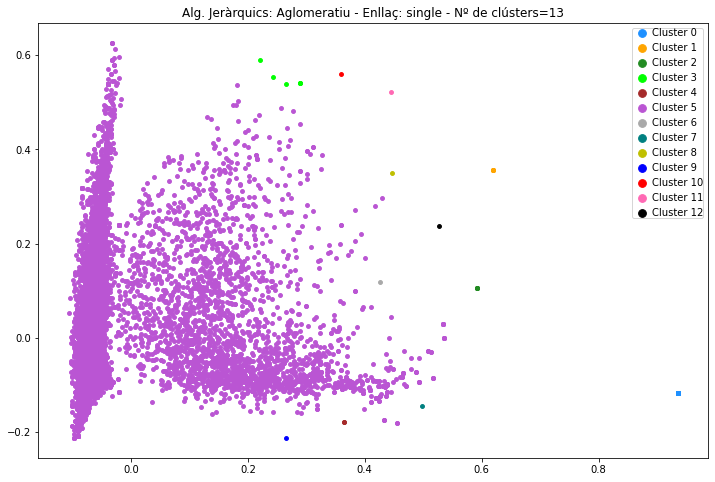

In [29]:
lnk='single'
num_clusters=13
tall=hc.fcluster(Z2, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-single_{}.jpg".format(num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [161]:
num_clusters=13
tall=hc.fcluster(Z2, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 1: people to yester honor help heard hear health hard happy group great good going go 
Cluster 2: awareness to yester going honor helping help heard hear health hard happy group great good 
Cluster 3: living million people to wide around one awareness families learn raise going happy hard health 
Cluster 4: latest to yester go helping help heard hear health hard happy group great good going 
Cluster 5: to people awareness support one research patients us know million many thank help living raise 
Cluster 6: know awareness to yester going helping help heard hear health hard happy group great good 
Cluster 7: to want work thank go helping help heard hear health hard happy group great good 
Cluster 8: one people to yester helping help heard hear health hard happy group great good going 
Cluster 9: latest thanks to yester going helping help heard hear health hard happy group great good 
C

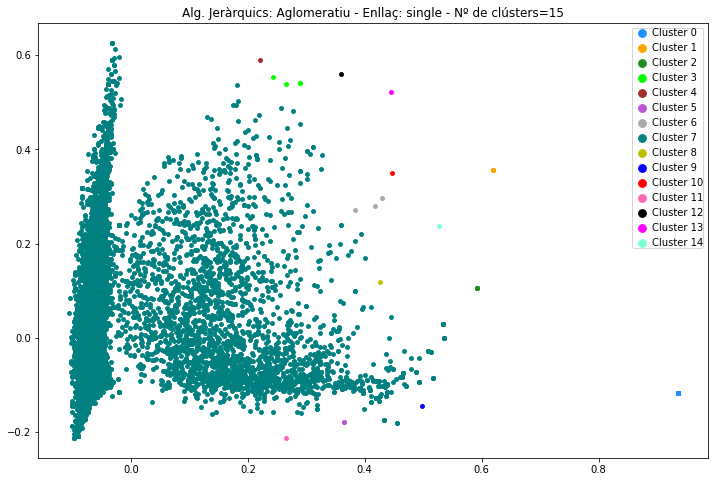

In [30]:
lnk='single'
num_clusters=15
tall=hc.fcluster(Z2, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-single_{}.jpg".format(num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [162]:
num_clusters=15
tall=hc.fcluster(Z2, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 1: people to yester honor help heard hear health hard happy group great good going go 
Cluster 2: awareness to yester going honor helping help heard hear health hard happy group great good 
Cluster 3: living million people wide to around families one awareness affects great honor helping help heard 
Cluster 4: around learn raise living million one awareness people to hear health hard good happy heard 
Cluster 5: latest to yester go helping help heard hear health hard happy group great good going 
Cluster 6: people to live many know go help heard hear health hard happy group great good 
Cluster 7: to people awareness support one research patients us know million thank many help living raise 
Cluster 8: know awareness to yester going helping help heard hear health hard happy group great good 
Cluster 9: to want work thank go helping help heard hear health hard happy group great good 
Cl

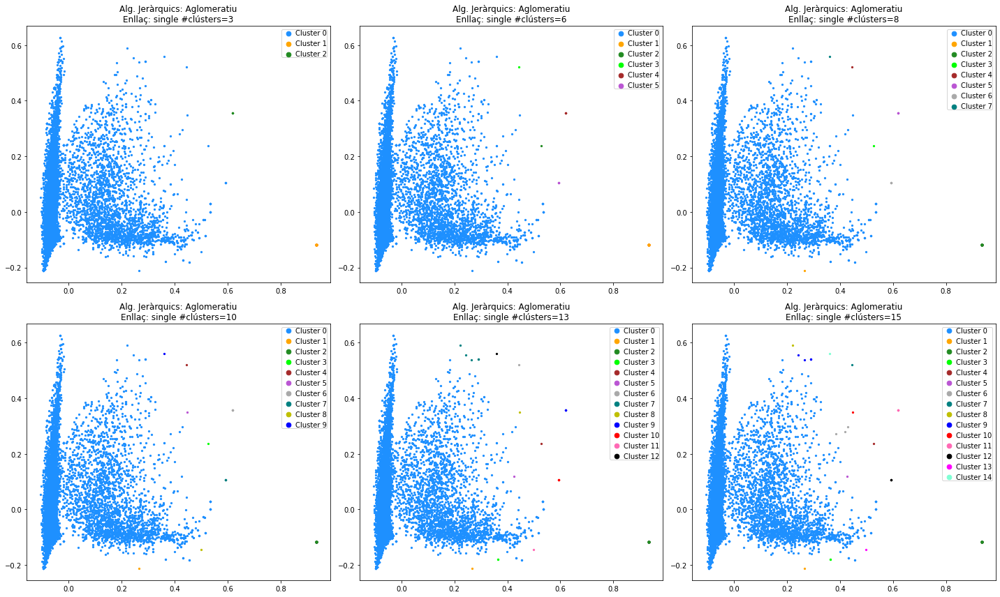

In [40]:
files=2
cols=3
lnk='single'
alt=20
ample=12
m=0
fig, ax = plt.subplots(files,cols,figsize=(alt,ample))

llista_clusters=[3,6,8,10,13,15]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.cut_tree(Z2, n_clusters=[num_clusters]).ravel()
        colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
        cmap = plt.cm.Spectral
        norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
        for idcluster in range(num_clusters):
            ax[i,j].scatter(np.array(X_PCA[:,0][tall==idcluster]), \
                       np.array(X_PCA[:,1][tall==idcluster]), s=5, \
                       c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
            ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        ax[i,j].legend(handletextpad=0,borderpad=0,markerscale=3)
        m=m+1
plt.tight_layout()
plt.savefig("last_single.jpg",format='jpg',bbox_inches='tight')

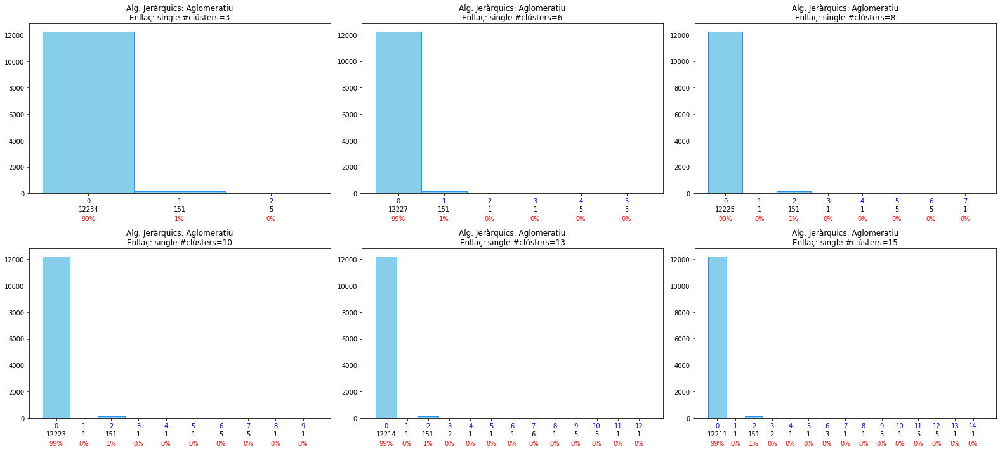

In [42]:
# Histogrames
files=2
cols=3
lnk='single'
alt=10
ample=22
m=0
fig, ax = plt.subplots(files,cols,figsize=(ample,alt))
llista_clusters=[3,6,8,10,13,15]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.cut_tree(Z2, n_clusters=[num_clusters]).ravel()
        counts, bins, patches = ax[i,j].hist(tall, bins=np.array(range(0,num_clusters+1)), facecolor='skyblue', edgecolor='dodgerblue')
        ax[i,j].xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
        bin_centers = 0.5 * np.diff(bins) + bins[:-1]
        ax[i,j].set_xticks(bin_centers)
        ax[i,j].set_xticklabels(bins, rotation=0,color='b')
        ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        for count, x in zip(counts.astype(int), bin_centers):
            # Label the raw counts
            ax[i,j].annotate(str(count), xy=(x, 0), xycoords=('data', 'axes fraction'),
                xytext=(0, -20), textcoords='offset points', va='top', ha='center')
            # Label the percentages
            percent = '%0.0f%%' % (100 * float(count) / counts.sum())
            ax[i,j].annotate(percent, xy=(x, 0), xycoords=('data', 'axes fraction'),
                xytext=(0, -35), textcoords='offset points', va='top', ha='center',c='r')
        m=m+1
        plt.tight_layout()
        
plt.savefig("hist_single.jpg",format='jpg',bbox_inches='tight')

### ENLLAÇ COMPLET

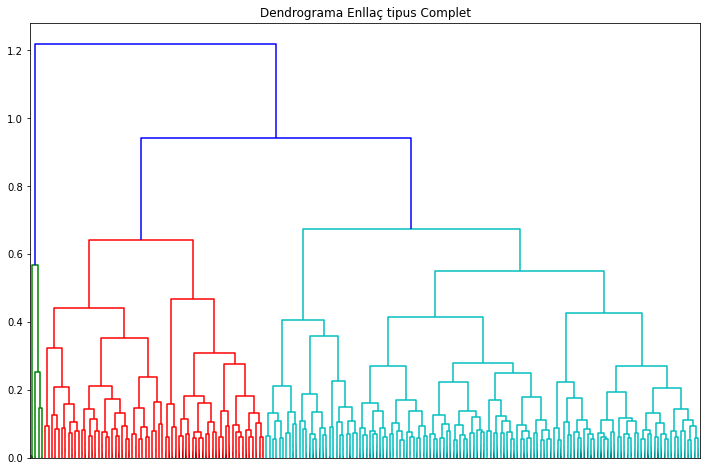

#Visualització dendrograma (PCA): (12390, 2) 
 Durada:  0 minut/s  20 segons.


In [16]:
# Visualització de tota la jerarquía de clústers
# usant un enllaç de tipus complete:
lnk="Complet"
plt.figure(figsize=(12,8))
time_start = time.time()
Z3=hc.complete(X_PCA)
dn=dendrogram(Z3,
              truncate_mode='lastp', # Mostra només els últims p clústers units.
              p=200, # valor de p
              leaf_rotation=90., # rotació d'etiquetes en l'eix de les abcises.
              leaf_font_size=None, # mida de la font en les etiquetes de l'eix de les abcises.
              no_labels=True,
              show_contracted=True # val True quan s'aplica el 'truncate_mode'.
             )
plt.title("Dendrograma Enllaç tipus {}".format(lnk))
plt.savefig("dn_complete.jpg",format='jpg',bbox_inches='tight')
plt.show()
temps=(time.time()-time_start)/60
print("#Visualització dendrograma (PCA):",np.shape(X_PCA),"\n Durada: ",int(temps) if temps>0 else 0,"minut/s ", \
      int((temps-int(temps))*60),"segons.")


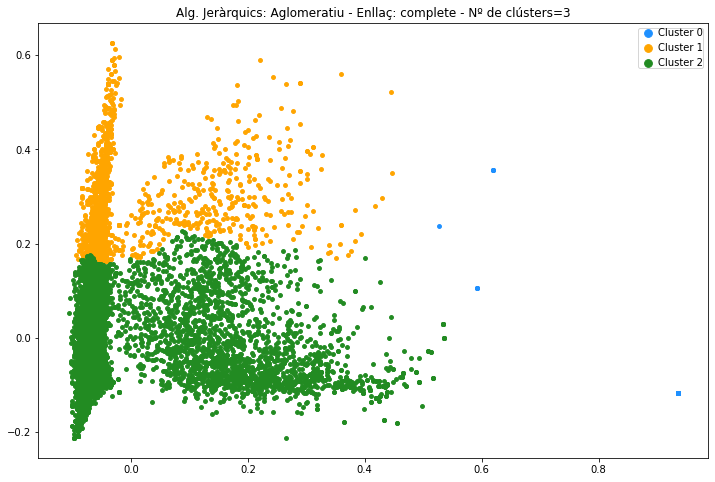

In [42]:
lnk='complete'
num_clusters=3
tall=hc.fcluster(Z3, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [163]:
num_clusters=3
tall=hc.fcluster(Z3, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to awareness people million going helping help heard hear health hard happy group great good 
Cluster 1: people million living awareness raise wide one to around affected support know help live patients 
Cluster 2: to research support us patients awareness one thank know many like help thanks tomorrow every 


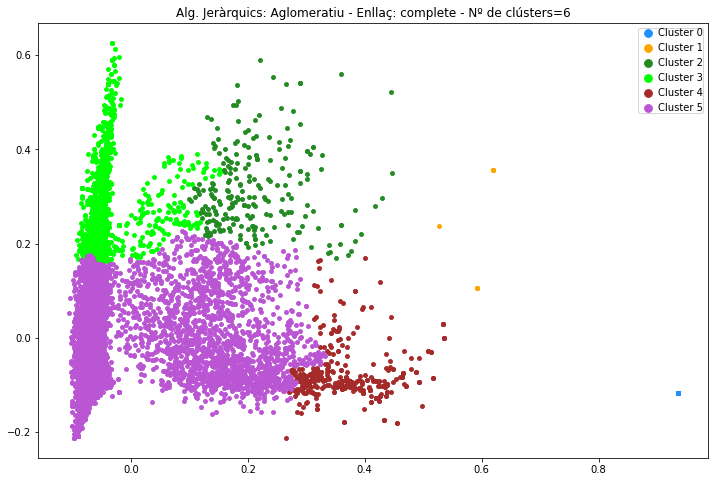

In [43]:
lnk='complete'
num_clusters=6
tall=hc.fcluster(Z3, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [164]:
num_clusters=6
tall=hc.fcluster(Z3, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 1: to awareness people million going helping help heard hear health hard happy group great good 
Cluster 2: people to million living awareness around wide raise one raising st know live learn affected 
Cluster 3: people million living awareness raise wide one affected around support know patients help live many 
Cluster 4: to celebrated one celebrate research us want international support work th year know important awareness 
Cluster 5: to research support patients us awareness thank one know many like help thanks tomorrow people 


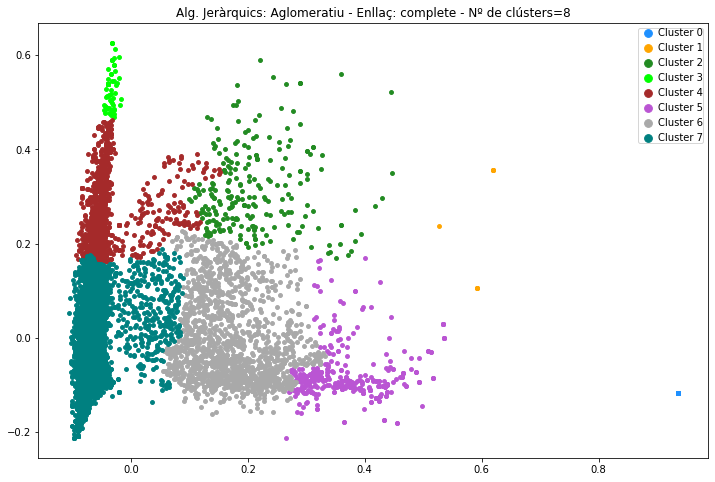

In [44]:
lnk='complete'
num_clusters=8
tall=hc.fcluster(Z3, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [165]:
num_clusters=8
tall=hc.fcluster(Z3, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 1: to awareness people million going helping help heard hear health hard happy group great good 
Cluster 2: people to million living awareness around wide raise one raising st know live learn affected 
Cluster 3: people million living wide around awareness one raise support know live families proud show th 
Cluster 4: people million awareness living raise one wide affected support around patients help know many live 
Cluster 5: to celebrated one celebrate research us want international support work th year know important awareness 
Cluster 6: to awareness support one raise people patients know every us many learn research year help 
Cluster 7: research patients us thank support one awareness know like thanks many help tomorrow life happy 


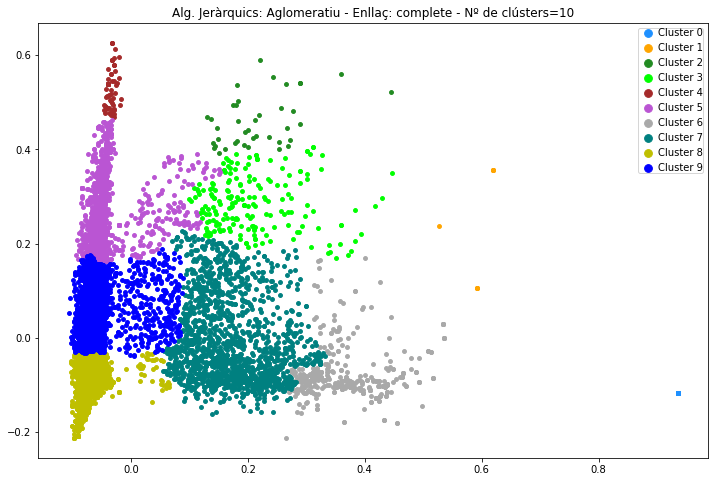

In [45]:
lnk='complete'
num_clusters=10
tall=hc.fcluster(Z3, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [166]:
num_clusters=10
tall=hc.fcluster(Z3, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 1: to awareness people million going helping help heard hear health hard happy group great good 
Cluster 2: million people living to around wide awareness raise suffer one learn live help raising know 
Cluster 3: to people million awareness living raise wide around one st raising know affect affected year 
Cluster 4: people million living wide around awareness one raise support know live families proud show th 
Cluster 5: people million awareness living raise one wide affected support around patients help know many live 
Cluster 6: to celebrated one celebrate research us want international support work th year know important awareness 
Cluster 7: to awareness support one raise people patients know every us many learn research year help 
Cluster 8: thank research thanks happy us great latest like tomorrow syndrome years work life th good 
Cluster 9: support awareness one patients peopl

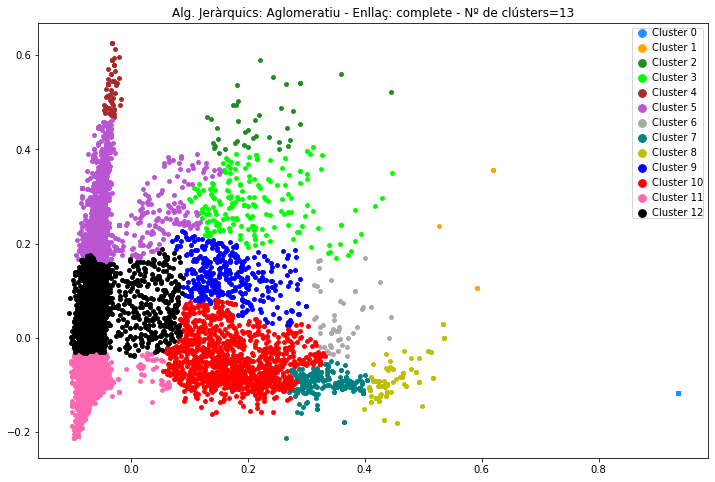

In [46]:
lnk='complete'
num_clusters=13
tall=hc.fcluster(Z3, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [167]:
num_clusters=13
tall=hc.fcluster(Z3, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 1: to awareness people million going helping help heard hear health hard happy group great good 
Cluster 2: million people living to around wide awareness raise suffer one learn live help raising know 
Cluster 3: to people million awareness living raise wide around one st raising know affect affected year 
Cluster 4: people million living wide around awareness one raise support know live families proud show th 
Cluster 5: people million awareness living raise one wide affected support around patients help know many live 
Cluster 6: to one awareness support know living raise affected raising show want international th proud work 
Cluster 7: to celebrated work celebrating research celebrate important us year th stripes years via also little 
Cluster 8: to celebrated celebrate international one want support read tomorrow research us know event see thanks 
Cluster 9: to awareness people r

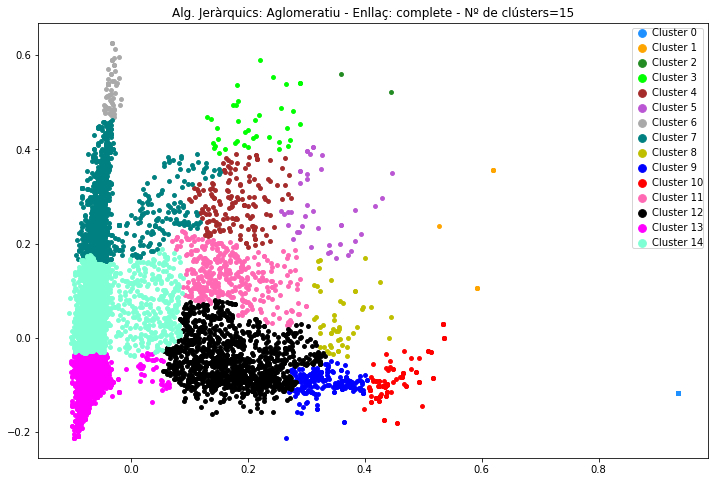

In [47]:
lnk='complete'
num_clusters=15
tall=hc.fcluster(Z3, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [168]:
num_clusters=15
tall=hc.fcluster(Z3, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 1: to awareness people million going helping help heard hear health hard happy group great good 
Cluster 2: million people to living go help heard hear health hard happy group great good going 
Cluster 3: million people living to around wide awareness raise suffer one learn live help raising know 
Cluster 4: people to million awareness living raise wide around st raising affected one year support learn 
Cluster 5: to people million affect know suffer awareness one raise living celebrate suffering live affects around 
Cluster 6: people million living wide around awareness one raise support know live families proud show th 
Cluster 7: people million awareness living raise one wide affected support around patients help know many live 
Cluster 8: to one awareness support know living raise affected raising show want international th proud work 
Cluster 9: to celebrated work celebrating res

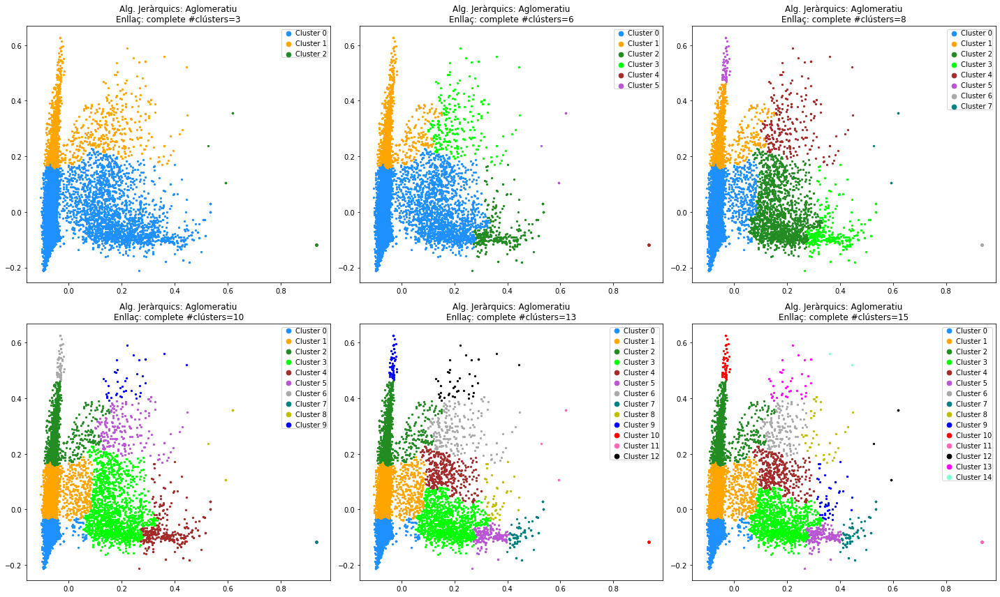

In [48]:
files=2
cols=3
lnk='complete'
alt=20
ample=12
m=0
fig, ax = plt.subplots(files,cols,figsize=(alt,ample))
llista_clusters=[3,6,8,10,13,15]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.cut_tree(Z3, n_clusters=[num_clusters]).ravel()
        colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
        cmap = plt.cm.Spectral
        norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
        for idcluster in range(num_clusters):
            ax[i,j].scatter(np.array(X_PCA[:,0][tall==idcluster]), \
                       np.array(X_PCA[:,1][tall==idcluster]), s=5, \
                       c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
            ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        ax[i,j].legend(handletextpad=0,borderpad=0,markerscale=3)
        m=m+1
plt.tight_layout()
plt.savefig("last_complete.jpg",format='jpg',bbox_inches='tight')

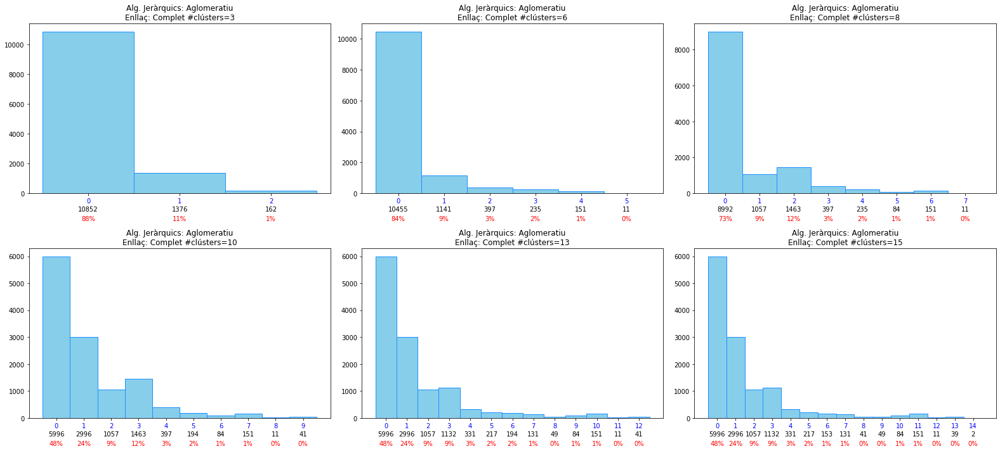

In [46]:
files=2
cols=3
lnk='Complet'
alt=10
ample=22
m=0
fig, ax = plt.subplots(files,cols,figsize=(ample, alt))
llista_clusters=[3,6,8,10,13,15]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.cut_tree(Z3, n_clusters=[num_clusters]).ravel()
        counts, bins, patches = ax[i,j].hist(tall, bins=np.array(range(0,num_clusters+1)), facecolor='skyblue', edgecolor='dodgerblue')
        ax[i,j].xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
        bin_centers = 0.5 * np.diff(bins) + bins[:-1]
        ax[i,j].set_xticks(bin_centers)
        ax[i,j].set_xticklabels(bins, rotation=0,color='b')
        ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        for count, x in zip(counts.astype(int), bin_centers):
            # Label the raw counts
            ax[i,j].annotate(str(count), xy=(x, 0), xycoords=('data', 'axes fraction'),
                xytext=(0, -20), textcoords='offset points', va='top', ha='center')
            # Label the percentages
            percent = '%0.0f%%' % (100 * float(count) / counts.sum())
            ax[i,j].annotate(percent, xy=(x, 0), xycoords=('data', 'axes fraction'),
                xytext=(0, -35), textcoords='offset points', va='top', ha='center',c='r')
        m=m+1
        plt.tight_layout()
        
plt.savefig("hist_complet.jpg",format='jpg',bbox_inches='tight')

### ENLLAÇ AVERAGE

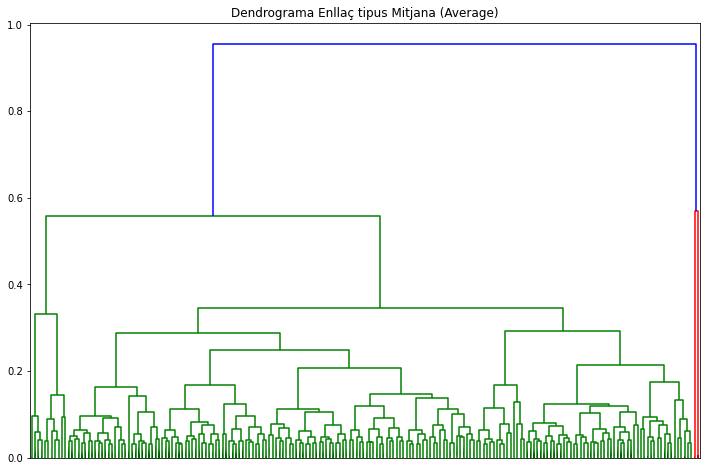

#Visualització dendrograma (PCA): (12390, 2) 
 Durada:  0 minut/s  20 segons.


In [17]:
# Visualització de tota la jerarquía de clústers
# usant un enllaç de tipus complete:
lnk="Mitjana (Average)"
plt.figure(figsize=(12,8))
time_start = time.time()
Z4=hc.average(X_PCA)
dn=dendrogram(Z4,
              truncate_mode='lastp', # Mostra només els últims p clústers units.
              p=200, # valor de p
              leaf_rotation=90., # rotació d'etiquetes en l'eix de les abcises.
              leaf_font_size=None, # mida de la font en les etiquetes de l'eix de les abcises.
              no_labels=True,
              show_contracted=True # val True quan s'aplica el 'truncate_mode'.
             )
plt.title("Dendrograma Enllaç tipus {}".format(lnk))
plt.savefig("dn_average.jpg",format='jpg',bbox_inches='tight')
plt.show()
temps=(time.time()-time_start)/60
print("#Visualització dendrograma (PCA):",np.shape(X_PCA),"\n Durada: ",int(temps) if temps>0 else 0,"minut/s ", \
      int((temps-int(temps))*60),"segons.")


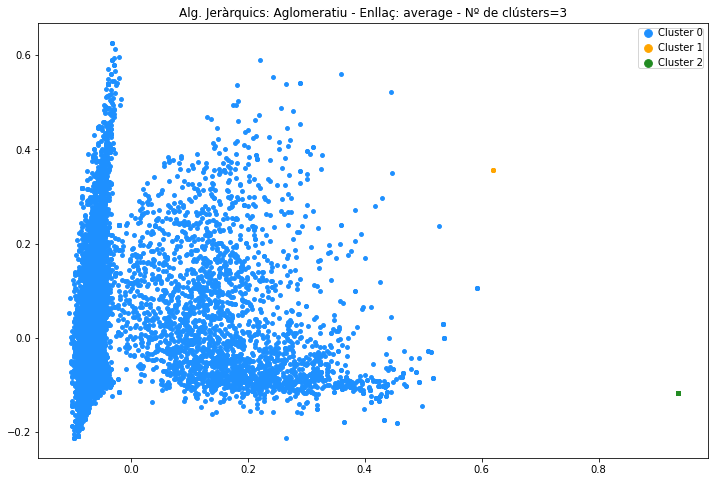

In [50]:
lnk='average'
num_clusters=3
tall=hc.fcluster(Z4, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [169]:
num_clusters=3
tall=hc.fcluster(Z4, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to people awareness support one research patients us million know thank many help living raise 
Cluster 1: people to yester honor help heard hear health hard happy group great good going go 
Cluster 2: to yester hope helping help heard hear health hard happy group great good going go 


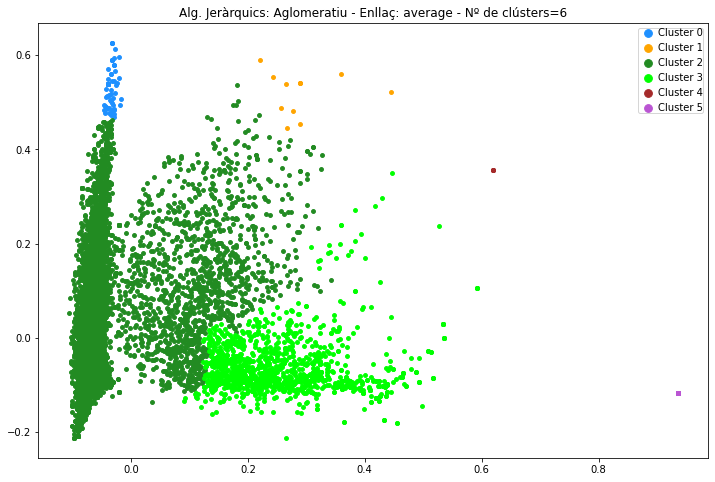

In [51]:
lnk='average'
num_clusters=6
tall=hc.fcluster(Z4, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [170]:
num_clusters=6
tall=hc.fcluster(Z4, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: people million living wide around awareness one raise support know live families proud show th 
Cluster 1: million people living to wide around one live awareness learn raise help families genetic full 
Cluster 2: people awareness support patients research one us million know help to thank many raise living 
Cluster 3: to one celebrated support us research want year know every awareness work many celebrate learn 
Cluster 4: people to yester honor help heard hear health hard happy group great good going go 
Cluster 5: to yester hope helping help heard hear health hard happy group great good going go 


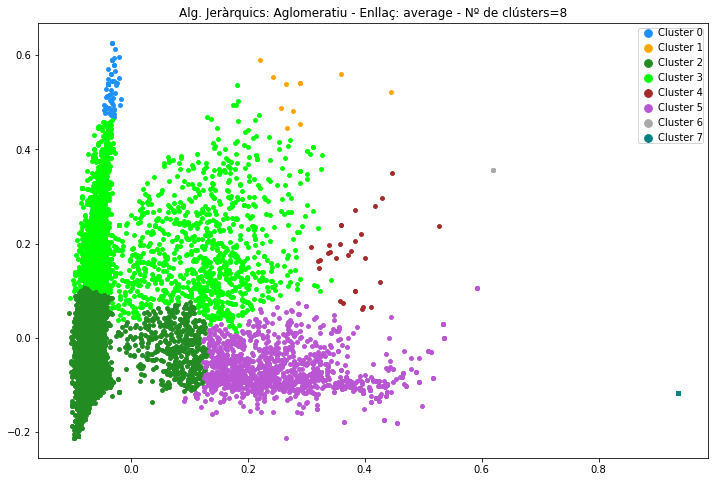

In [52]:
lnk='average'
num_clusters=8
tall=hc.fcluster(Z4, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [171]:
num_clusters=8
tall=hc.fcluster(Z4, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: people million living wide around awareness one raise support know live families proud show th 
Cluster 1: million people living to wide around one live awareness learn raise help families genetic full 
Cluster 2: research thank us patients support one know thanks like help tomorrow happy many life great 
Cluster 3: people million awareness raise to living one support patients affected wide help know around many 
Cluster 4: to people awareness know million one affect raising th living raise fighting without common special 
Cluster 5: to celebrated one support us want year research every know work learn many celebrate make 
Cluster 6: people to yester honor help heard hear health hard happy group great good going go 
Cluster 7: to yester hope helping help heard hear health hard happy group great good going go 


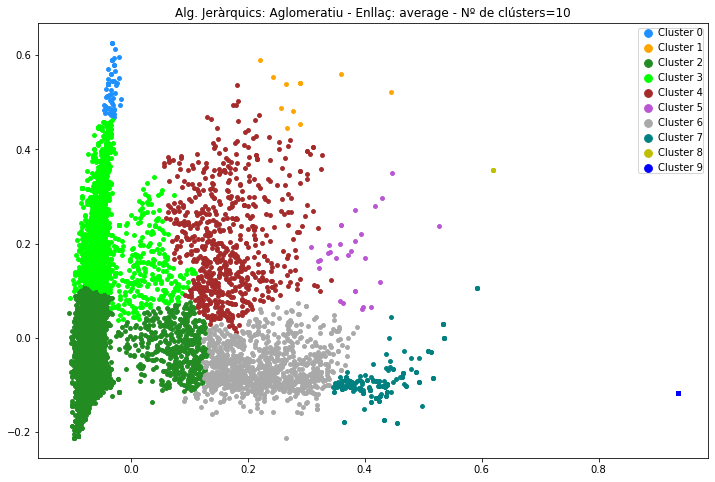

In [53]:
lnk='average'
num_clusters=10
tall=hc.fcluster(Z4, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [172]:
num_clusters=10
tall=hc.fcluster(Z4, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: people million living wide around awareness one raise support know live families proud show th 
Cluster 1: million people living to wide around one live awareness learn raise help families genetic full 
Cluster 2: research thank us patients support one know thanks like help tomorrow happy many life great 
Cluster 3: people million awareness raise living one support affected patients help many wide know around live 
Cluster 4: to people awareness million raise living support wide around patients know impact learn help one 
Cluster 5: to people awareness know million one affect raising th living raise fighting without common special 
Cluster 6: to one support celebrated us every year research work want many learn make know also 
Cluster 7: to celebrated celebrate international one want support stripes celebrating read tomorrow awareness via little research 
Cluster 8: people to yester honor help heard hear health hard happy group great good going go 
Cluster 9: to yester hope 

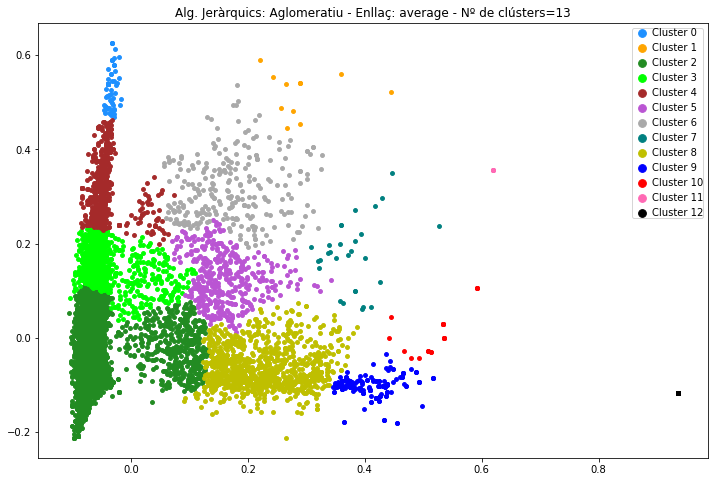

In [54]:
lnk='average'
num_clusters=13
tall=hc.fcluster(Z4, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [173]:
num_clusters=13
tall=hc.fcluster(Z4, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: people million living wide around awareness one raise support know live families proud show th 
Cluster 1: million people living to wide around one live awareness learn raise help families genetic full 
Cluster 2: research thank us patients support one know thanks like help tomorrow happy many life great 
Cluster 3: people awareness raise million patients living support many one affected know help us tomorrow families 
Cluster 4: people million living awareness raise one wide affected around support help know live patients suffer 
Cluster 5: to awareness people raise support patients impact lives living million help know learn many raising 
Cluster 6: people to million living awareness wide around raise one learn know raising affected support live 
Cluster 7: to people awareness know million one affect raising th living raise fighting without common special 
Cluster 8: to one support celebrated us every year research work want many learn make know also 
Cluster 9: to celebra

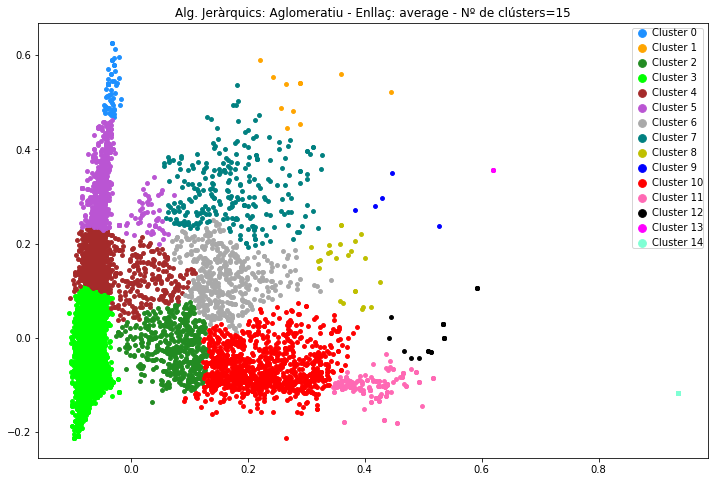

In [55]:
lnk='average'
num_clusters=15
tall=hc.fcluster(Z4, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [174]:
num_clusters=15
tall=hc.fcluster(Z4, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: people million living wide around awareness one raise support know live families proud show th 
Cluster 1: million people living to wide around one live awareness learn raise help families genetic full 
Cluster 2: to us research thank awareness support patients life help story one like share also time 
Cluster 3: research thank us patients support one know thanks like happy tomorrow many help great life 
Cluster 4: people awareness raise million patients living support many one affected know help us tomorrow families 
Cluster 5: people million living awareness raise one wide affected around support help know live patients suffer 
Cluster 6: to awareness people raise support patients impact lives living million help know learn many raising 
Cluster 7: people to million living awareness wide around raise one learn know raising affected support live 
Cluster 8: to people awareness affect know one million raising th living raise fighting without common special 
Cluster 9: to peo

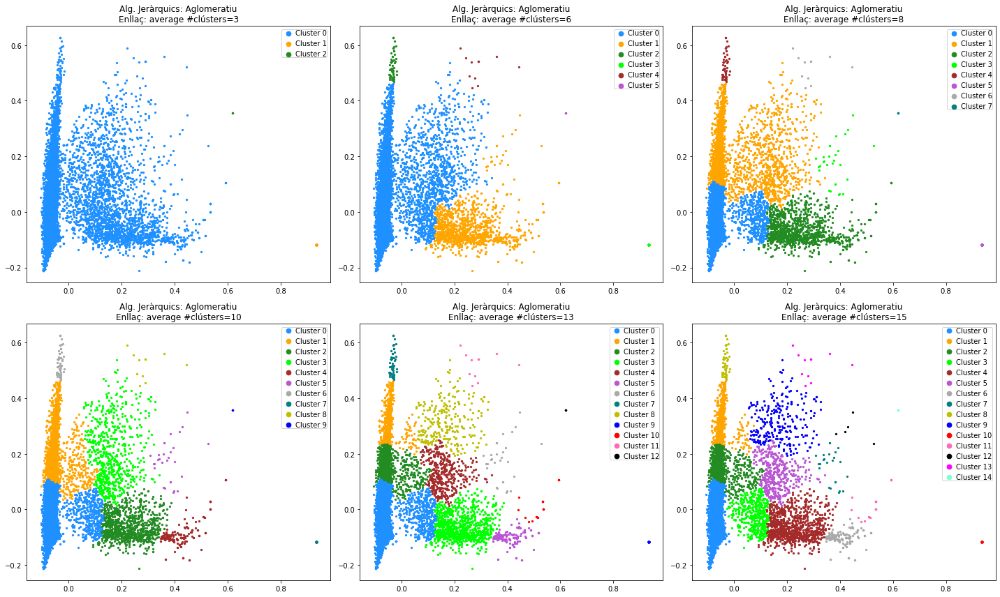

In [56]:
files=2
cols=3
lnk='average'
alt=20
ample=12
m=0
fig, ax = plt.subplots(files,cols,figsize=(alt,ample))

llista_clusters=[3,6,8,10,13,15]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.cut_tree(Z4, n_clusters=[num_clusters]).ravel()
        colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
        cmap = plt.cm.Spectral
        norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
        for idcluster in range(num_clusters):
            ax[i,j].scatter(np.array(X_PCA[:,0][tall==idcluster]), \
                       np.array(X_PCA[:,1][tall==idcluster]), s=5, \
                       c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
            ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        ax[i,j].legend(handletextpad=0,borderpad=0,markerscale=3)
        m=m+1
plt.tight_layout()
plt.savefig("last_average.jpg",format='jpg',bbox_inches='tight')

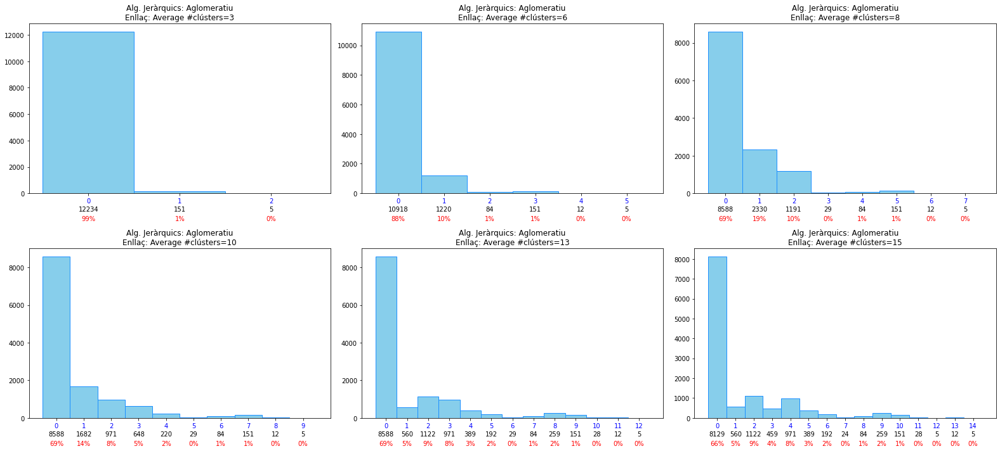

In [49]:
files=2
cols=3
lnk='Average'
alt=10
ample=22
m=0
fig, ax = plt.subplots(files,cols,figsize=(ample, alt))
llista_clusters=[3,6,8,10,13,15]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.cut_tree(Z4, n_clusters=[num_clusters]).ravel()
        counts, bins, patches = ax[i,j].hist(tall, bins=np.array(range(0,num_clusters+1)), facecolor='skyblue', edgecolor='dodgerblue')
        ax[i,j].xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
        bin_centers = 0.5 * np.diff(bins) + bins[:-1]
        ax[i,j].set_xticks(bin_centers)
        ax[i,j].set_xticklabels(bins, rotation=0,color='b')
        ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        for count, x in zip(counts.astype(int), bin_centers):
            # Label the raw counts
            ax[i,j].annotate(str(count), xy=(x, 0), xycoords=('data', 'axes fraction'),
                xytext=(0, -20), textcoords='offset points', va='top', ha='center')
            # Label the percentages
            percent = '%0.0f%%' % (100 * float(count) / counts.sum())
            ax[i,j].annotate(percent, xy=(x, 0), xycoords=('data', 'axes fraction'),
                xytext=(0, -35), textcoords='offset points', va='top', ha='center',c='r')
        m=m+1
        plt.tight_layout()
        
plt.savefig("hist_average.jpg",format='jpg',bbox_inches='tight')

### ENLLAÇ Weighted

#Visualització dendrograma (PCA): (12390, 2) 
 Durada:  0 minut/s  15 segons.


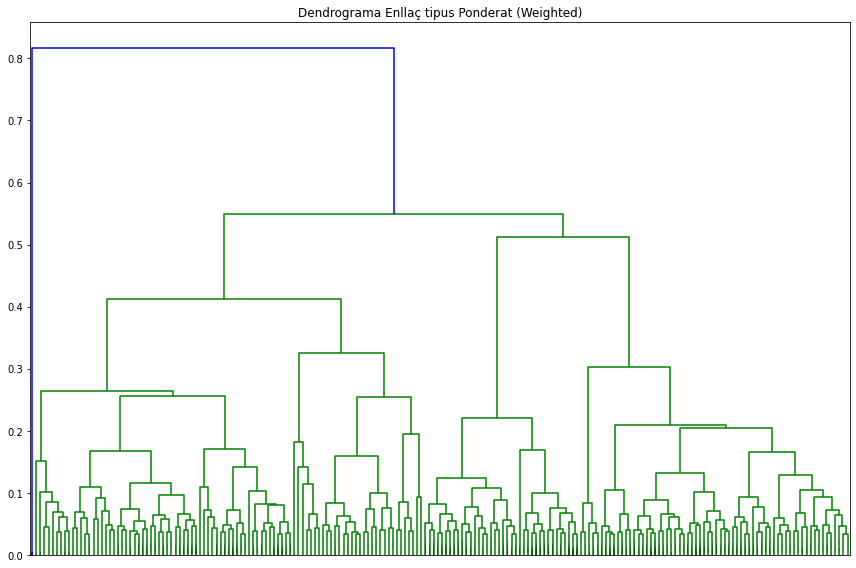

In [57]:
# Visualització de tota la jerarquía de clústers
# usant un enllaç de tipus complete:
lnk="Ponderat (Weighted)"
plt.figure(figsize=(12,8))
time_start = time.time()
Z5=hc.weighted(X_PCA)
dn=dendrogram(Z5,
              truncate_mode='lastp', # Mostra només els últims p clústers units.
              p=200, # valor de p
              leaf_rotation=90., # rotació d'etiquetes en l'eix de les abcises.
              leaf_font_size=None, # mida de la font en les etiquetes de l'eix de les abcises.
              no_labels=True,
              show_contracted=True # val True quan s'aplica el 'truncate_mode'.
             )
plt.title("Dendrograma Enllaç tipus {}".format(lnk))
plt.tight_layout()
plt.savefig("dn_weighted.jpg",format='jpg',bbox_inches='tight')
temps=(time.time()-time_start)/60
print("#Visualització dendrograma (PCA):",np.shape(X_PCA),"\n Durada: ",int(temps) if temps>0 else 0,"minut/s ", \
      int((temps-int(temps))*60),"segons.")


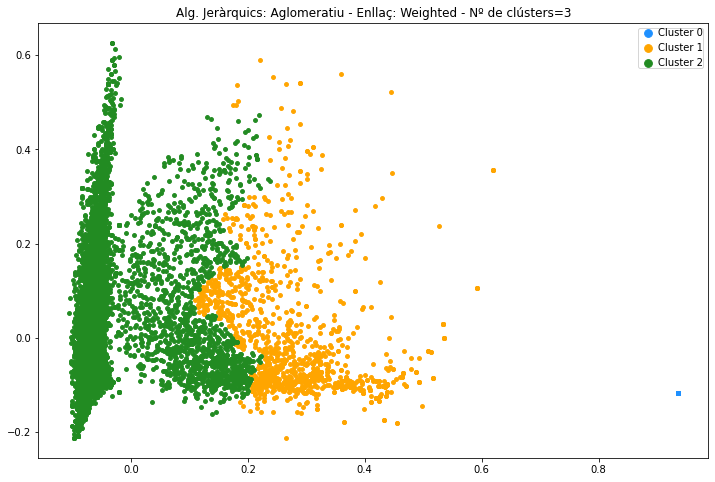

In [58]:
lnk='Weighted'
num_clusters=3
tall=hc.fcluster(Z5, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [175]:
num_clusters=3
tall=hc.fcluster(Z5, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 1: to awareness people support one celebrated raise million know us living year research every celebrate 
Cluster 2: people awareness support patients research one us million know to thank help many living tomorrow 


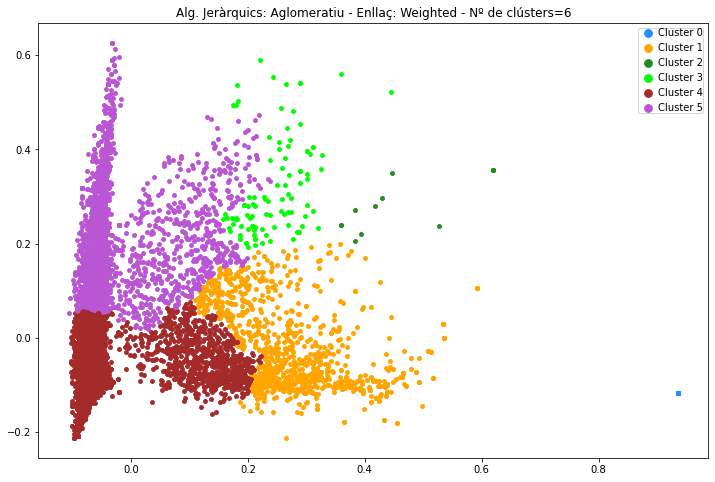

In [59]:
lnk='Weighted'
num_clusters=6
tall=hc.fcluster(Z5, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [176]:
num_clusters=6
tall=hc.fcluster(Z5, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 1: to awareness support one celebrated raise know us research people year celebrate every want patients 
Cluster 2: to people affect million know read live many one full great help heard hear health 
Cluster 3: to people million living awareness around suffer wide one raising raise learn affects year live 
Cluster 4: research thank us patients support thanks to know like happy tomorrow many one great work 
Cluster 5: people million awareness living raise one support wide patients affected help know around many to 


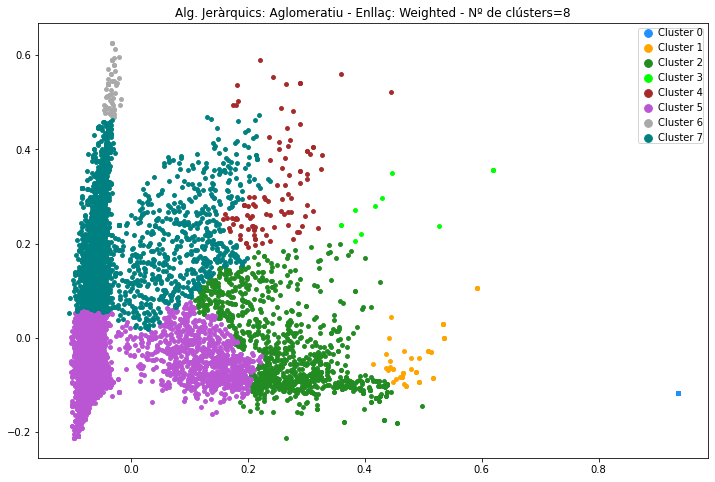

In [60]:
lnk='Weighted'
num_clusters=8
tall=hc.fcluster(Z5, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [177]:
num_clusters=8
tall=hc.fcluster(Z5, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 1: to one support tomorrow awareness research us know th year join like patients find show 
Cluster 2: to awareness support celebrated one raise know people celebrate us want research every year make 
Cluster 3: to people affect million know read live many one full great help heard hear health 
Cluster 4: to people million living awareness around suffer wide one raising raise learn affects year live 
Cluster 5: research thank us patients support thanks to know like happy tomorrow many one great work 
Cluster 6: people million living wide around awareness one raise support know live families proud show th 
Cluster 7: people awareness million raise living one support patients affected wide help know many to around 


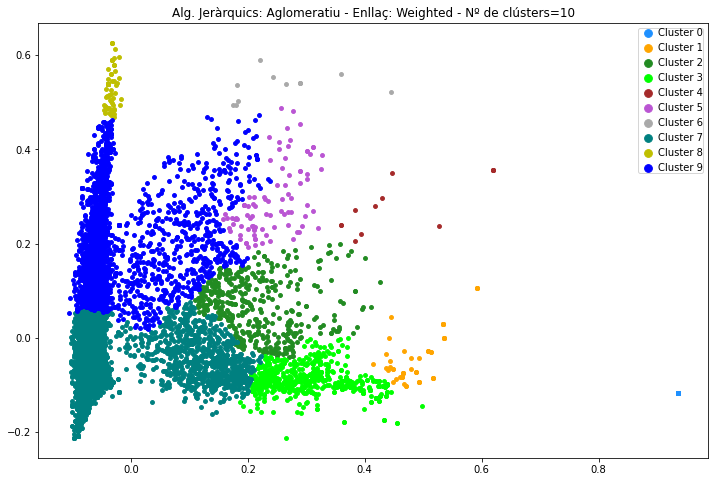

In [61]:
lnk='Weighted'
num_clusters=10
tall=hc.fcluster(Z5, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [178]:
num_clusters=10
tall=hc.fcluster(Z5, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 1: to one support tomorrow awareness research us know th year join like patients find show 
Cluster 2: to awareness raise support one people patients know families help living raising many every impact 
Cluster 3: to celebrated celebrate want work international us also years important see year research th make 
Cluster 4: to people affect million know read live many one full great help heard hear health 
Cluster 5: to people million awareness living suffer one around raising wide raise affects learn affect know 
Cluster 6: million living people to around wide awareness families raise raising one learn helping st together 
Cluster 7: research thank us patients support thanks to know like happy tomorrow many one great work 
Cluster 8: people million living wide around awareness one raise support know live families proud show th 
Cluster 9: people awareness million raise living one suppo

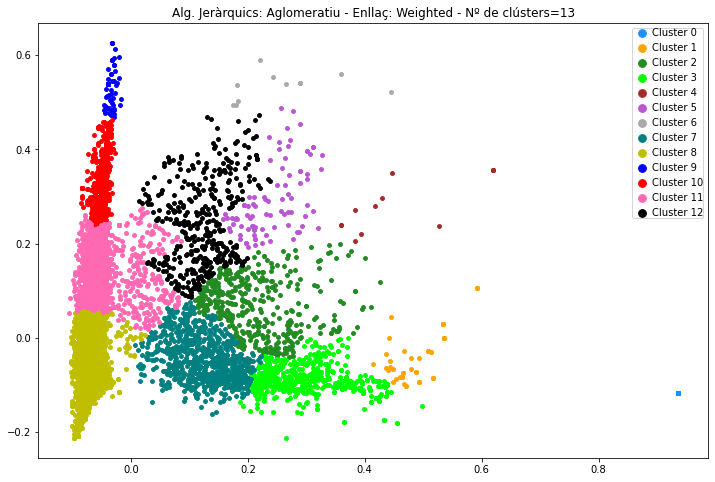

In [62]:
lnk='Weighted'
num_clusters=13
tall=hc.fcluster(Z5, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [179]:
num_clusters=13
tall=hc.fcluster(Z5, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 1: to one support tomorrow awareness research us know th year join like patients find show 
Cluster 2: to awareness raise support one people patients know families help living raising many every impact 
Cluster 3: to celebrated celebrate want work international us also years important see year research th make 
Cluster 4: to people affect million know read live many one full great help heard hear health 
Cluster 5: to people million awareness living suffer one around raising wide raise affects learn affect know 
Cluster 6: million living people to around wide awareness families raise raising one learn helping st together 
Cluster 7: to us thank research like patients every also support one syndrome awareness share life year 
Cluster 8: research thank us patients support thanks know happy like tomorrow great many one work life 
Cluster 9: people million living wide around awareness one

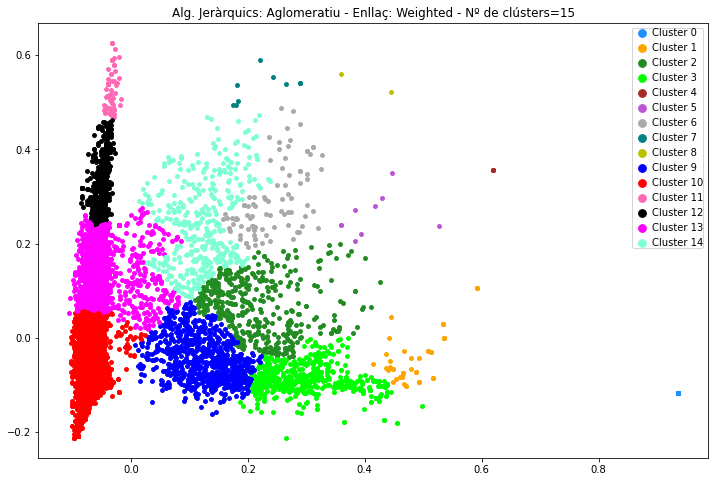

In [63]:
lnk='Weighted'
num_clusters=15
tall=hc.fcluster(Z5, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [180]:
num_clusters=15
tall=hc.fcluster(Z5, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 1: to one support tomorrow awareness research us know th year join like patients find show 
Cluster 2: to awareness raise support one people patients know families help living raising many every impact 
Cluster 3: to celebrated celebrate want work international us also years important see year research th make 
Cluster 4: people to yester honor help heard hear health hard happy group great good going go 
Cluster 5: to people affect million know read live many one full great help heard hear health 
Cluster 6: to people million awareness living suffer one around raising wide raise affects learn affect know 
Cluster 7: living million people to around wide awareness families raise raising one learn helping st together 
Cluster 8: million people to living go help heard hear health hard happy group great good going 
Cluster 9: to us thank research like patients every also support one syndro

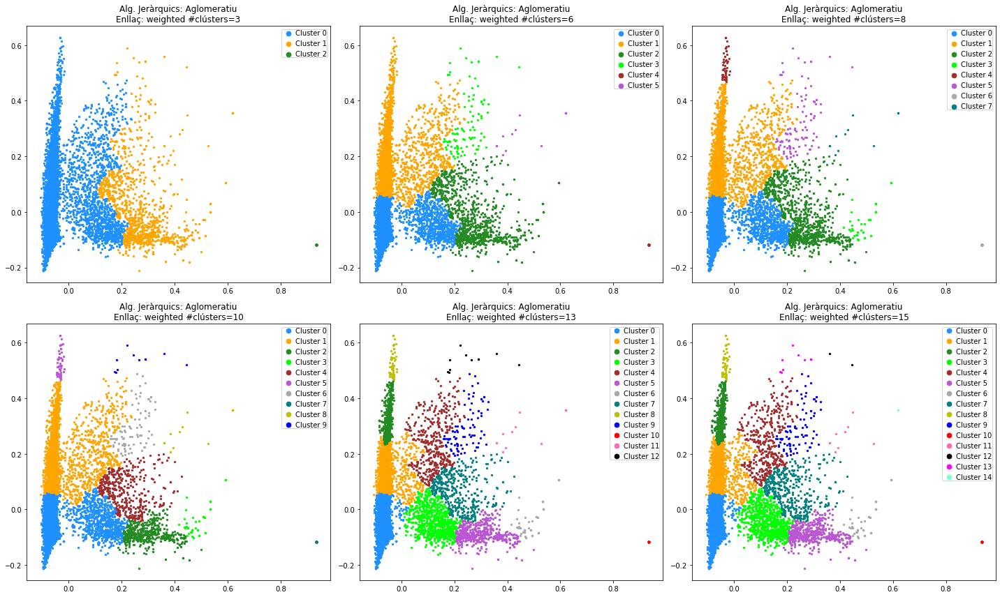

In [64]:
files=2
cols=3
lnk='weighted'
alt=20
ample=12
m=0
fig, ax = plt.subplots(files,cols,figsize=(alt,ample))

llista_clusters=[3,6,8,10,13,15]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.cut_tree(Z5, n_clusters=[num_clusters]).ravel()
        colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
        cmap = plt.cm.Spectral
        norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
        for idcluster in range(num_clusters):
            ax[i,j].scatter(np.array(X_PCA[:,0][tall==idcluster]), \
                       np.array(X_PCA[:,1][tall==idcluster]), s=5, \
                       c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
            ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        ax[i,j].legend(handletextpad=0,borderpad=0,markerscale=3)
        m=m+1
plt.tight_layout()
plt.savefig("last_weighted.jpg",format='jpg',bbox_inches='tight')

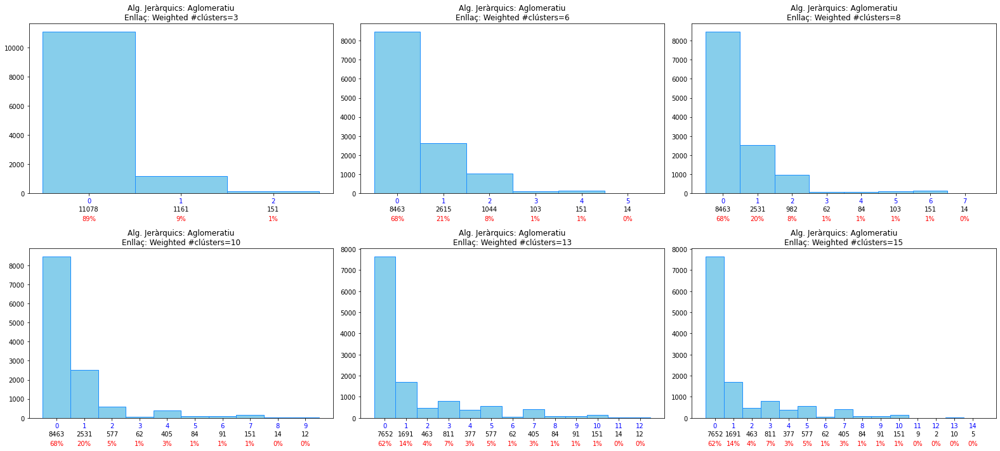

In [95]:
files=2
cols=3
lnk='Weighted'
alt=10
ample=22
m=0
fig, ax = plt.subplots(files,cols,figsize=(ample, alt))
llista_clusters=[3,6,8,10,13,15]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.cut_tree(Z5, n_clusters=[num_clusters]).ravel()
        counts, bins, patches = ax[i,j].hist(tall, bins=np.array(range(0,num_clusters+1)), facecolor='skyblue', edgecolor='dodgerblue')
        ax[i,j].xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
        bin_centers = 0.5 * np.diff(bins) + bins[:-1]
        ax[i,j].set_xticks(bin_centers)
        ax[i,j].set_xticklabels(bins, rotation=0,color='b')
        ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        for count, x in zip(counts.astype(int), bin_centers):
            # Label the raw counts
            ax[i,j].annotate(str(count), xy=(x, 0), xycoords=('data', 'axes fraction'),
                xytext=(0, -20), textcoords='offset points', va='top', ha='center')
            # Label the percentages
            percent = '%0.0f%%' % (100 * float(count) / counts.sum())
            ax[i,j].annotate(percent, xy=(x, 0), xycoords=('data', 'axes fraction'),
                xytext=(0, -35), textcoords='offset points', va='top', ha='center',c='r')
        m=m+1
        plt.tight_layout()
        
plt.savefig("hist_weighted.jpg",format='jpg',bbox_inches='tight')

### ENLLAÇ CENTROIDE

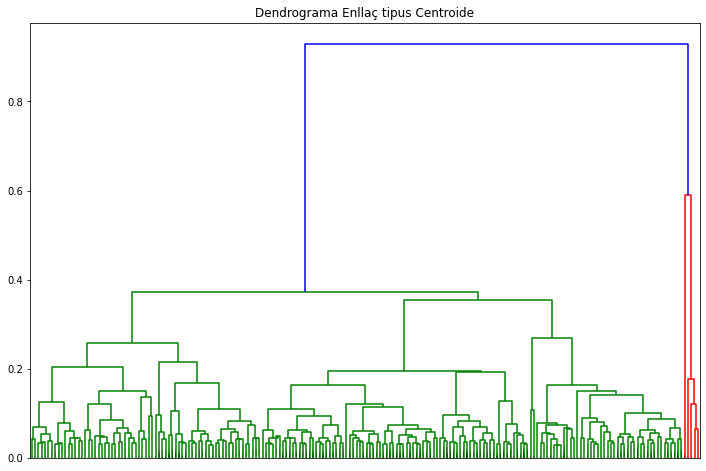

#Visualització dendrograma (PCA): (12390, 2) 
 Durada:  0 minut/s  22 segons.


In [18]:
# Visualització de tota la jerarquía de clústers
# usant un enllaç de tipus complete:
lnk="Centroide"
plt.figure(figsize=(12,8))
time_start = time.time()
Z6=hc.centroid(X_PCA)
dn=dendrogram(Z6,
              truncate_mode='lastp', # Mostra només els últims p clústers units.
              p=200, # valor de p
              leaf_rotation=90., # rotació d'etiquetes en l'eix de les abcises.
              leaf_font_size=None, # mida de la font en les etiquetes de l'eix de les abcises.
              no_labels=True,
              show_contracted=True # val True quan s'aplica el 'truncate_mode'.
             )
plt.title("Dendrograma Enllaç tipus {}".format(lnk))
plt.savefig("dn_centroid.jpg",format='jpg',bbox_inches='tight')
plt.show()
temps=(time.time()-time_start)/60
print("#Visualització dendrograma (PCA):",np.shape(X_PCA),"\n Durada: ",int(temps) if temps>0 else 0,"minut/s ", \
      int((temps-int(temps))*60),"segons.")

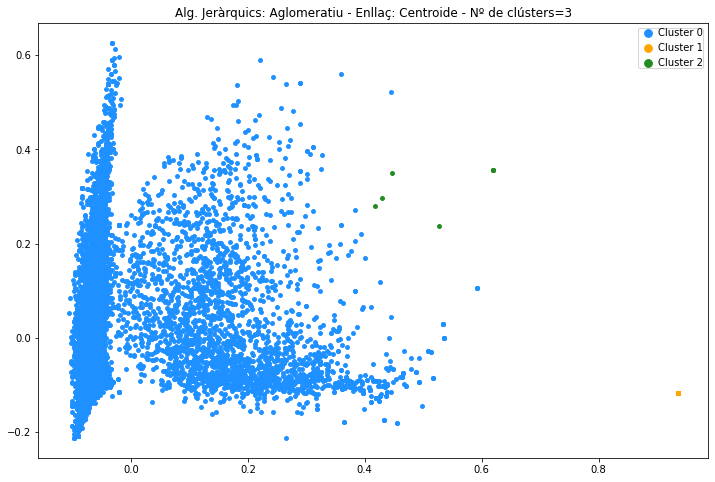

In [66]:
lnk='Centroide'
num_clusters=3
tall=hc.fcluster(Z6, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [181]:
num_clusters=3
tall=hc.fcluster(Z6, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to people awareness support one research patients us million know thank many help living raise 
Cluster 1: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 2: to people million many know one forward great helping help heard hear fighting health find 


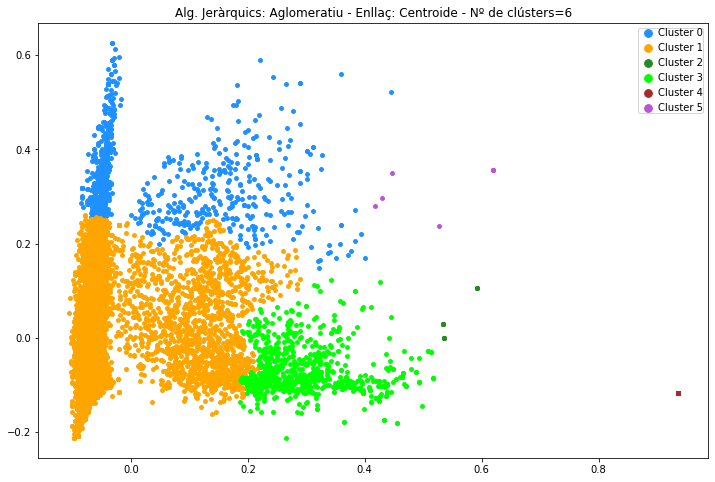

In [67]:
lnk='Centroide'
num_clusters=6
tall=hc.fcluster(Z6, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [182]:
num_clusters=6
tall=hc.fcluster(Z6, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: people million living to wide awareness around one raise affected support know help live patients 
Cluster 1: awareness research patients people support us to one thank know many help like tomorrow life 
Cluster 2: to one support awareness yester good helping help heard hear health hard happy group great 
Cluster 3: to celebrated one support want us research know year celebrate work international th every awareness 
Cluster 4: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 5: to people million many know one forward great helping help heard hear fighting health find 


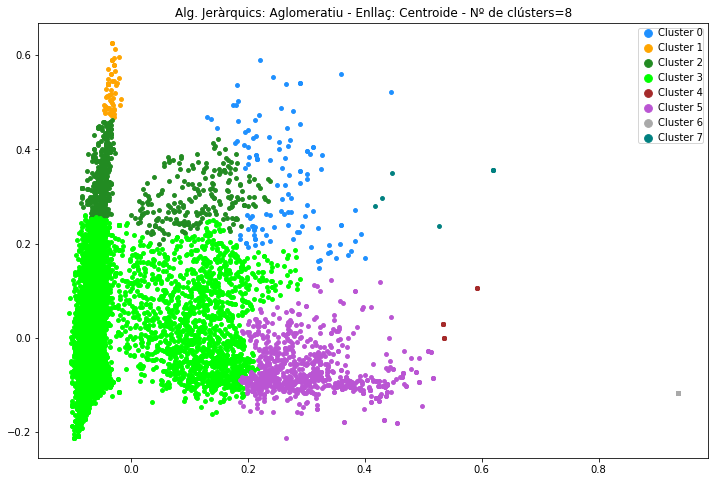

In [68]:
lnk='Centroide'
num_clusters=8
tall=hc.fcluster(Z6, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [183]:
num_clusters=8
tall=hc.fcluster(Z6, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to people million living awareness around wide one raise suffer affect know families help raising 
Cluster 1: people million living wide around awareness one raise support know live families proud show th 
Cluster 2: people million living awareness wide one raise around affected to support help know live patients 
Cluster 3: awareness research patients people support us to one thank know many help like tomorrow life 
Cluster 4: to one support awareness yester good helping help heard hear health hard happy group great 
Cluster 5: to celebrated one support want us research know year celebrate work international th every awareness 
Cluster 6: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 7: to people million many know one forward great helping help heard hear fighting health find 


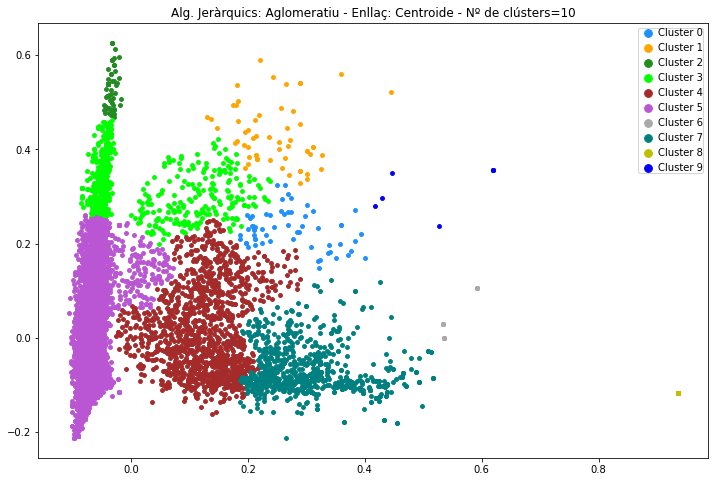

In [69]:
lnk='Centroide'
num_clusters=10
tall=hc.fcluster(Z6, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [184]:
num_clusters=10
tall=hc.fcluster(Z6, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to people million awareness affect living know one suffer wide raise help every patients around 
Cluster 1: million people to living around awareness wide raise one suffer families st learn suffering year 
Cluster 2: people million living wide around awareness one raise support know live families proud show th 
Cluster 3: people million living awareness wide one raise around affected to support help know live patients 
Cluster 4: to awareness people raise patients support us research help one know thank many every learn 
Cluster 5: research patients support people awareness us one thank know many help tomorrow like thanks life 
Cluster 6: to one support awareness yester good helping help heard hear health hard happy group great 
Cluster 7: to celebrated one support want us research know year celebrate work international th every awareness 
Cluster 8: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 9: to people million many know one

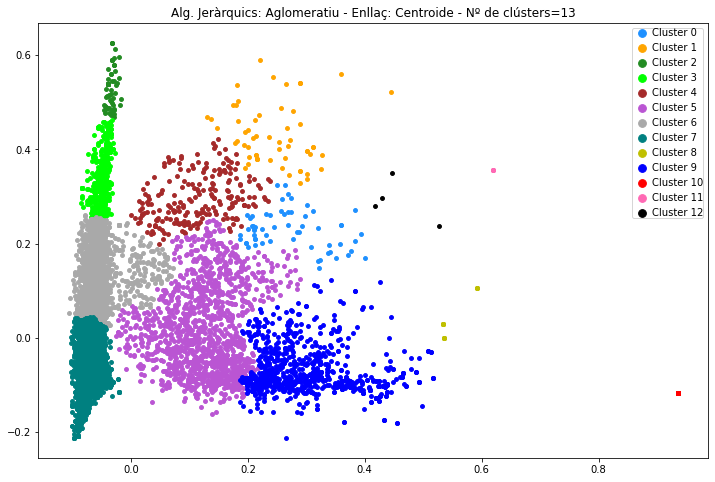

In [70]:
lnk='Centroide'
num_clusters=13
tall=hc.fcluster(Z6, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [185]:
num_clusters=13
tall=hc.fcluster(Z6, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to people million awareness affect living know one suffer wide raise help every patients around 
Cluster 1: million people to living around awareness wide raise one suffer families st learn suffering year 
Cluster 2: people million living wide around awareness one raise support know live families proud show th 
Cluster 3: people million living one wide awareness affected around raise support help know suffer live patients 
Cluster 4: people million to living awareness wide raise around support affected learn live help raising patients 
Cluster 5: to awareness people raise patients support us research help one know thank many every learn 
Cluster 6: people awareness support raise one living patients million help many know affected raising us families 
Cluster 7: research thank us patients thanks happy know like tomorrow great many life work support th 
Cluster 8: to one support awareness yester good helping help heard hear health hard happy group great 
Cluster 9: to celebrat

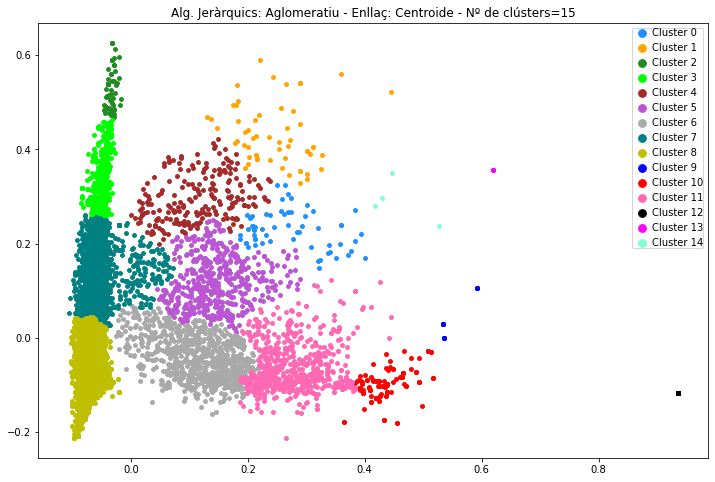

In [71]:
lnk='Centroide'
num_clusters=15
tall=hc.fcluster(Z6, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [186]:
num_clusters=15
tall=hc.fcluster(Z6, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to people million awareness affect living know one suffer wide raise help every patients around 
Cluster 1: million people to living around awareness wide raise one suffer families st learn suffering year 
Cluster 2: people million living wide around awareness one raise support know live families proud show th 
Cluster 3: people million living one wide awareness affected around raise support help know suffer live patients 
Cluster 4: people million to living awareness wide raise around support affected learn live help raising patients 
Cluster 5: to awareness people raise patients support impact living lives help million know raising families learn 
Cluster 6: to us thank research like patients one syndrome every share support awareness story also year 
Cluster 7: people awareness support raise one living patients million help many know affected raising us families 
Cluster 8: research thank us patients thanks happy know like tomorrow great many life work support th 
Cluster

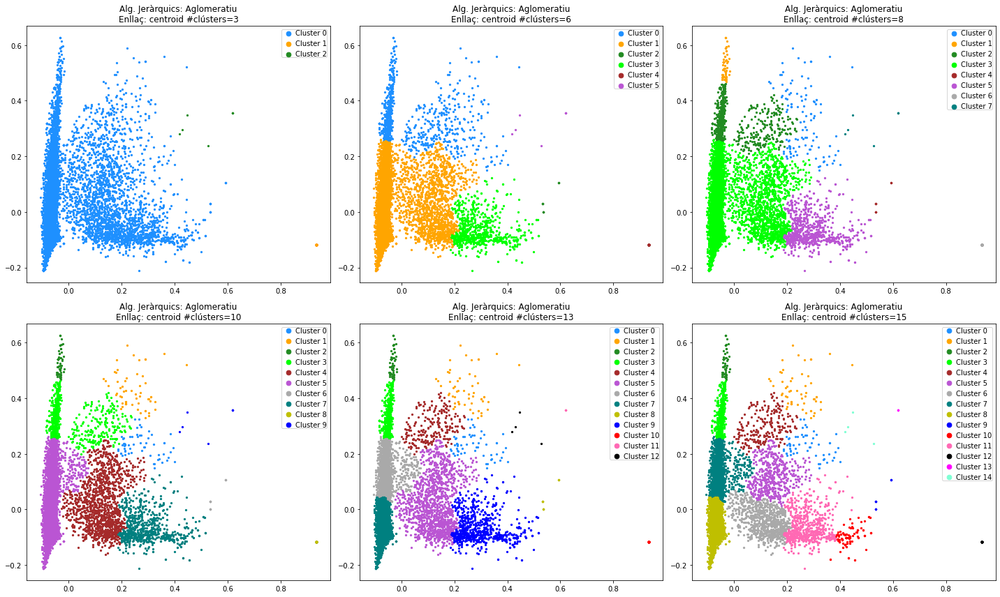

In [9]:
files=2
cols=3
lnk='centroid'
alt=20
ample=12
m=0
fig, ax = plt.subplots(files,cols,figsize=(alt,ample))

llista_clusters=[3,6,8,10,13,15]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.fcluster(Z6, num_clusters, criterion='maxclust')-1
        colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
        # Algorisme jeràrquic bottom-up
        #ahc = AgglomerativeClustering(n_clusters=num_clusters,linkage=lnk).fit(X_PCA)
        cmap = plt.cm.Spectral
        norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
        for idcluster in range(num_clusters):
            ax[i,j].scatter(np.array(X_PCA[:,0][tall==idcluster]), \
                       np.array(X_PCA[:,1][tall==idcluster]), s=5, \
                       c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
            ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        ax[i,j].legend(handletextpad=0,borderpad=0,markerscale=3)
        m=m+1
plt.tight_layout()
plt.savefig("last_centroid.jpg",format='jpg',bbox_inches='tight')

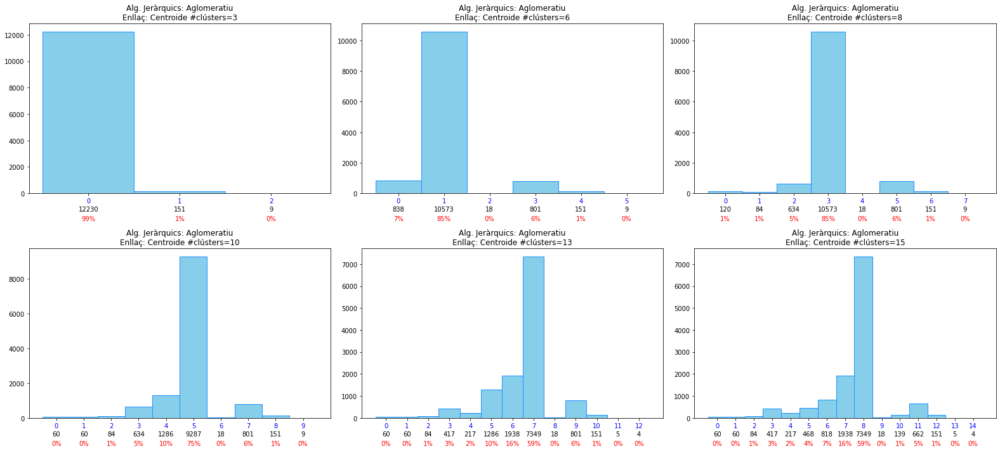

In [10]:
files=2
cols=3
lnk='Centroide'
alt=10
ample=22
m=0
fig, ax = plt.subplots(files,cols,figsize=(ample, alt))
llista_clusters=[3,6,8,10,13,15]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.fcluster(Z6, num_clusters, criterion='maxclust')-1
        counts, bins, patches = ax[i,j].hist(tall, bins=np.array(range(0,num_clusters+1)), facecolor='skyblue', edgecolor='dodgerblue')
        ax[i,j].xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
        bin_centers = 0.5 * np.diff(bins) + bins[:-1]
        ax[i,j].set_xticks(bin_centers)
        ax[i,j].set_xticklabels(bins, rotation=0,color='b')
        ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        for count, x in zip(counts.astype(int), bin_centers):
            # Label the raw counts
            ax[i,j].annotate(str(count), xy=(x, 0), xycoords=('data', 'axes fraction'),
                xytext=(0, -20), textcoords='offset points', va='top', ha='center')
            # Label the percentages
            percent = '%0.0f%%' % (100 * float(count) / counts.sum())
            ax[i,j].annotate(percent, xy=(x, 0), xycoords=('data', 'axes fraction'),
                xytext=(0, -35), textcoords='offset points', va='top', ha='center',c='r')
        m=m+1
        plt.tight_layout()
        
plt.savefig("hist_centroide.jpg",format='jpg',bbox_inches='tight')

### ENLLAÇ MEDIANA

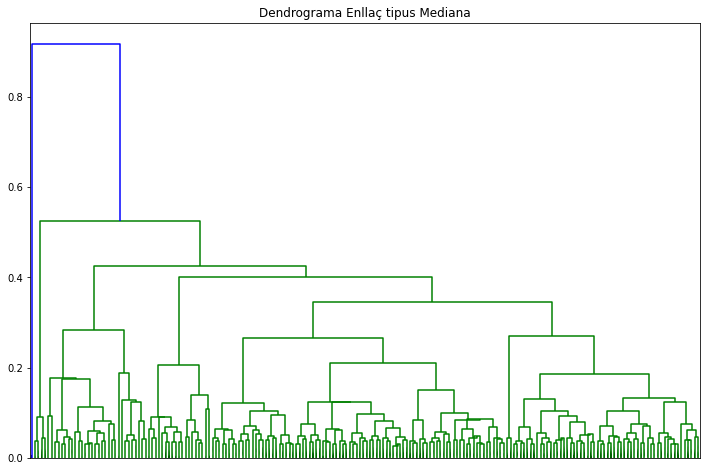

#Visualització dendrograma (PCA): (12390, 2) 
 Durada:  0 minut/s  23 segons.


In [19]:
# Visualització de tota la jerarquía de clústers
# amb només les darreres 200 últimes agrupacions,
# usant un enllaç de tipus mediana:
lnk="Mediana"
plt.figure(figsize=(12,8))
time_start = time.time()
Z7=hc.median(X_PCA)
dn=dendrogram(Z7,
              truncate_mode='lastp', # Mostra només els últims p clústers units.
              p=200, # valor de p
              leaf_rotation=90., # rotació d'etiquetes en l'eix de les abcises.
              leaf_font_size=None, # mida de la font en les etiquetes de l'eix de les abcises.
              no_labels=True,
              show_contracted=True # val True quan s'aplica el 'truncate_mode'.
             )
plt.title("Dendrograma Enllaç tipus {}".format(lnk))
plt.savefig("dn_centroid.jpg",format='jpg',bbox_inches='tight')
plt.show()
temps=(time.time()-time_start)/60
print("#Visualització dendrograma (PCA):",np.shape(X_PCA),"\n Durada: ",int(temps) if temps>0 else 0,"minut/s ", \
      int((temps-int(temps))*60),"segons.")

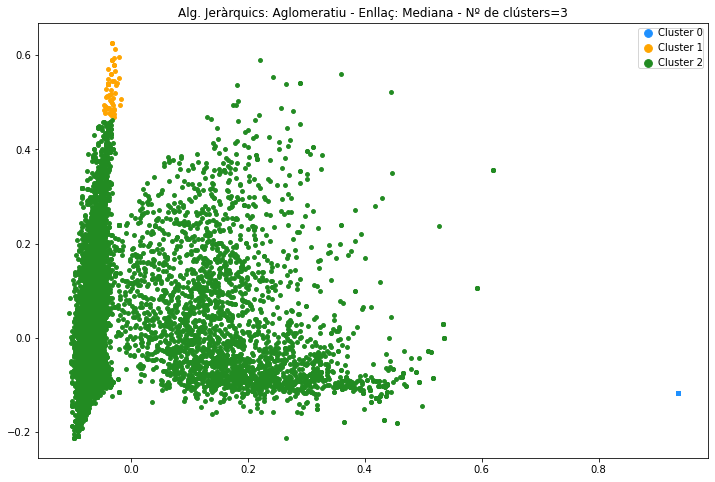

In [74]:
lnk='Mediana'
num_clusters=3
tall=hc.fcluster(Z7, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [187]:
num_clusters=3
tall=hc.fcluster(Z7, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 1: people million living wide around awareness one raise support know live families proud show th 
Cluster 2: to people awareness support one research patients us know million thank many help raise tomorrow 


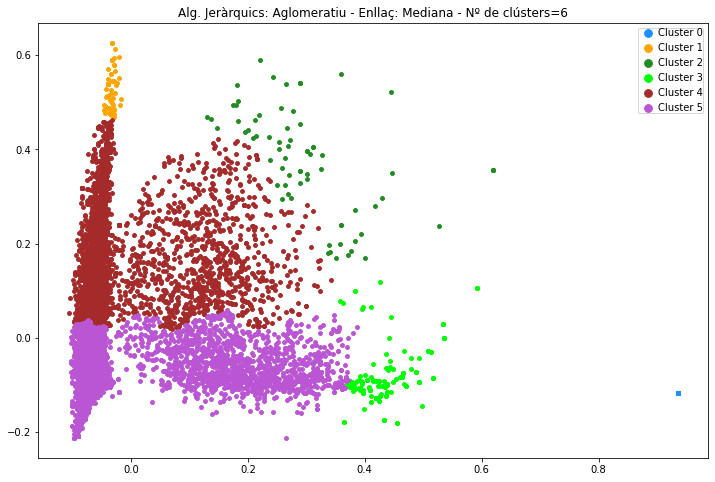

In [75]:
lnk='Mediana'
num_clusters=6
tall=hc.fcluster(Z7, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [188]:
num_clusters=6
tall=hc.fcluster(Z7, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 1: people million living wide around awareness one raise support know live families proud show th 
Cluster 2: people to million living around awareness wide one suffer affect raise learn live know help 
Cluster 3: to celebrated celebrate one awareness international want support celebrating read tomorrow know research th little 
Cluster 4: people awareness million raise support living one to patients help affected know many wide families 
Cluster 5: to research thank us patients thanks know like happy work tomorrow many support great syndrome 


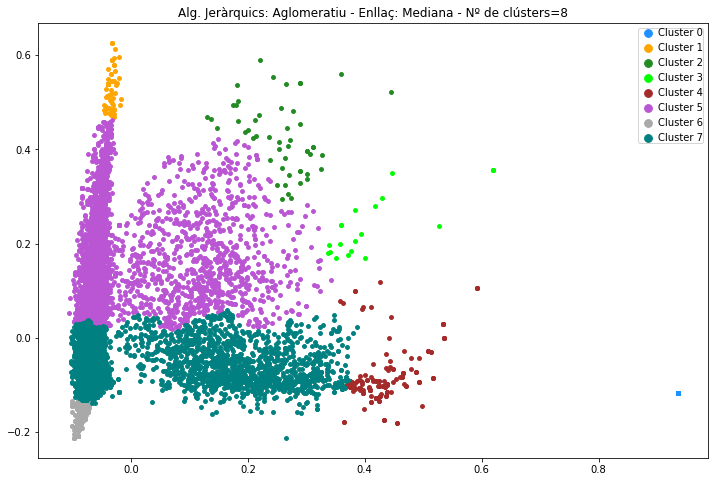

In [76]:
lnk='Mediana'
num_clusters=8
tall=hc.fcluster(Z7, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [189]:
num_clusters=8
tall=hc.fcluster(Z7, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 1: people million living wide around awareness one raise support know live families proud show th 
Cluster 2: million people to living around wide awareness suffer one raise learn suffering help live families 
Cluster 3: to people affect million know one common special celebrate team read great live many living 
Cluster 4: to celebrated celebrate one awareness international want support celebrating read tomorrow know research th little 
Cluster 5: people awareness million raise support living one to patients help affected know many wide families 
Cluster 6: thank latest thanks happy daily much news great sharing good last everyone health work event 
Cluster 7: to research us patients know like tomorrow work many support th syndrome life one year 


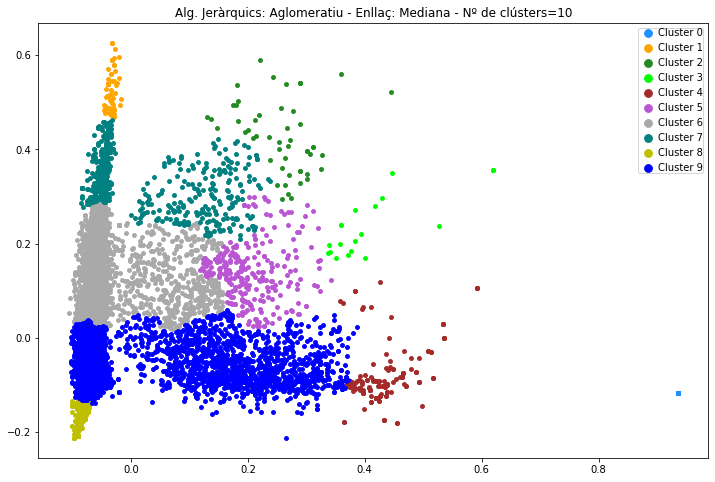

In [77]:
lnk='Mediana'
num_clusters=10
tall=hc.fcluster(Z7, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [190]:
num_clusters=10
tall=hc.fcluster(Z7, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 1: people million living wide around awareness one raise support know live families proud show th 
Cluster 2: million people to living around wide awareness suffer one raise learn suffering help live families 
Cluster 3: to people affect million know one common special celebrate team read great live many living 
Cluster 4: to celebrated celebrate one awareness international want support celebrating read tomorrow know research th little 
Cluster 5: to awareness people raise patients support raising living impact million families help lives one know 
Cluster 6: people awareness support raise one living patients million many help know affected families us raising 
Cluster 7: people million living wide awareness to raise around one affected help support know live patients 
Cluster 8: thank latest thanks happy daily much news great sharing good last everyone health work event 
Cluster 9: t

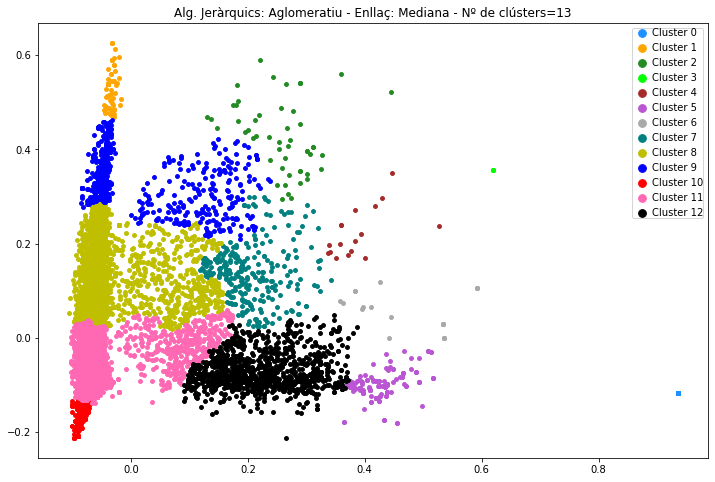

In [78]:
lnk='Mediana'
num_clusters=13
tall=hc.fcluster(Z7, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [191]:
num_clusters=13
tall=hc.fcluster(Z7, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 1: people million living wide around awareness one raise support know live families proud show th 
Cluster 2: million people to living around wide awareness suffer one raise learn suffering help live families 
Cluster 3: people to yester honor help heard hear health hard happy group great good going go 
Cluster 4: to people affect million know one common special celebrate team read great live many living 
Cluster 5: to celebrated celebrate international want celebrating read tomorrow little research us know remember event see 
Cluster 6: to one awareness support affected raising th know wide research living yester great group happy 
Cluster 7: to awareness people raise patients support raising living impact million families help lives one know 
Cluster 8: people awareness support raise one living patients million many help know affected families us raising 
Cluster 9: people million l

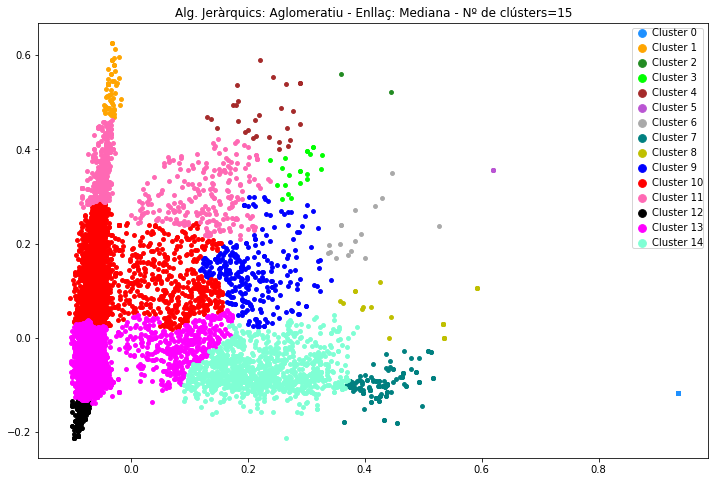

In [79]:
lnk='Mediana'
num_clusters=15
tall=hc.fcluster(Z7, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA[:,0][tall==idcluster]), \
               np.array(X_PCA[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(handletextpad=0,borderpad=0,markerscale=2)
plt.savefig("je-{}_{}.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [192]:
num_clusters=15
tall=hc.fcluster(Z7, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

Cluster 0: to yester hope helping help heard hear health hard happy group great good going go 
Cluster 1: people million living wide around awareness one raise support know live families proud show th 
Cluster 2: million people to living go help heard hear health hard happy group great good going 
Cluster 3: million people to suffering awareness affect suffer affects celebrate every raise living one illness celebrating 
Cluster 4: million people living to around wide awareness suffer learn one raise families help live raising 
Cluster 5: people to yester honor help heard hear health hard happy group great good going go 
Cluster 6: to people affect million know one common special celebrate team read great live many living 
Cluster 7: to celebrated celebrate international want celebrating read tomorrow little research us know remember event see 
Cluster 8: to one awareness support affected raising th know wide research living yester great group happy 
Cluster 9: to awareness people raise

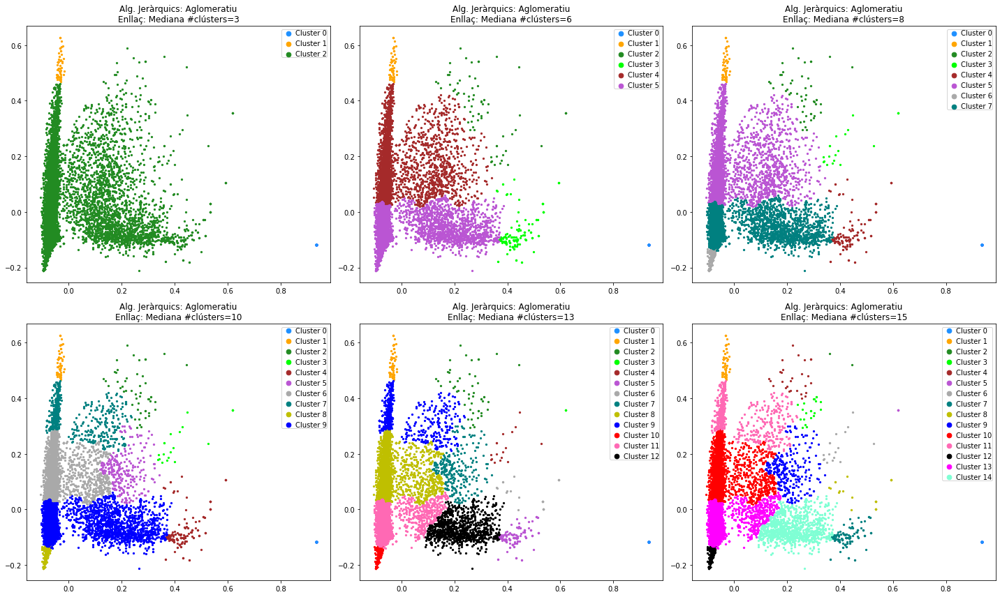

In [12]:
files=2
cols=3
lnk='Mediana'
alt=20
ample=12
m=0
fig, ax = plt.subplots(files,cols,figsize=(alt,ample))

llista_clusters=[3,6,8,10,13,15]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.fcluster(Z7, num_clusters, criterion='maxclust')-1
        colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
        # Algorisme jeràrquic bottom-up
        #ahc = AgglomerativeClustering(n_clusters=num_clusters,linkage=lnk).fit(X_PCA)
        cmap = plt.cm.Spectral
        norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
        for idcluster in range(num_clusters):
            ax[i,j].scatter(np.array(X_PCA[:,0][tall==idcluster]), \
                       np.array(X_PCA[:,1][tall==idcluster]), s=5, \
                       c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
            ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        ax[i,j].legend(handletextpad=0,borderpad=0,markerscale=3)
        m=m+1
plt.tight_layout()
plt.savefig("last_mediana.jpg",format='jpg',bbox_inches='tight')

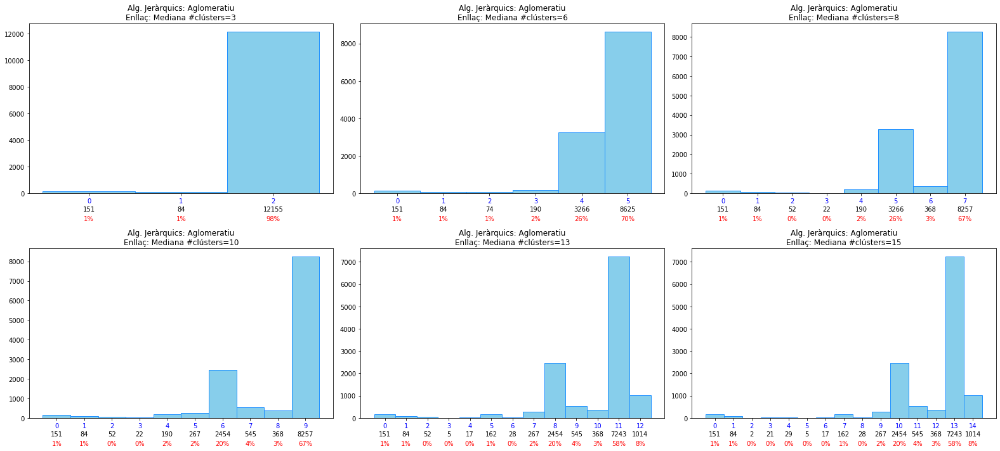

In [13]:
files=2
cols=3
lnk='Mediana'
alt=10
ample=22
m=0
fig, ax = plt.subplots(files,cols,figsize=(ample, alt))
llista_clusters=[3,6,8,10,13,15]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.fcluster(Z7, num_clusters, criterion='maxclust')-1
        counts, bins, patches = ax[i,j].hist(tall, bins=np.array(range(0,num_clusters+1)), facecolor='skyblue', edgecolor='dodgerblue')
        ax[i,j].xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
        bin_centers = 0.5 * np.diff(bins) + bins[:-1]
        ax[i,j].set_xticks(bin_centers)
        ax[i,j].set_xticklabels(bins, rotation=0,color='b')
        ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        for count, x in zip(counts.astype(int), bin_centers):
            # Label the raw counts
            ax[i,j].annotate(str(count), xy=(x, 0), xycoords=('data', 'axes fraction'),
                xytext=(0, -20), textcoords='offset points', va='top', ha='center')
            # Label the percentages
            percent = '%0.0f%%' % (100 * float(count) / counts.sum())
            ax[i,j].annotate(percent, xy=(x, 0), xycoords=('data', 'axes fraction'),
                xytext=(0, -35), textcoords='offset points', va='top', ha='center',c='r')
        m=m+1
        plt.tight_layout()
        
plt.savefig("hist_mediana.jpg",format='jpg',bbox_inches='tight')

### Utilitzant altres mètriques de distància

In [16]:
# Similaritat del cosinus.
similaritat = 1 - cosine_similarity(matriu_tfidf)
similaritat.shape
# Reducció de la dimensionalitat amb PCA:
#pca = PCA(n_components=2)
Xz = similaritat
n_comp=2
print("\nCreant el model i matriu PCA - Nº Components=",n_comp)
pca=delayedsparse.PCA(n_components=n_comp)
X_PCA_cosine = pca.fit(Xz).transform(Xz)
print("Dimensions de les dades reduïdes amb PCA:", np.shape(X_PCA_cosine))


Creant el model i matriu PCA - Nº Components= 2
Dimensions de les dades reduïdes amb PCA: (12390, 2)


In [17]:
X_PCA_cosine

matrix([[-1.94866292,  1.03207706],
        [-2.95355144,  2.00155507],
        [ 1.85010457, -4.3376534 ],
        ...,
        [-2.95355144,  2.00155507],
        [-2.54717852,  1.62320277],
        [-0.90331276, -0.78528953]])

## WARD

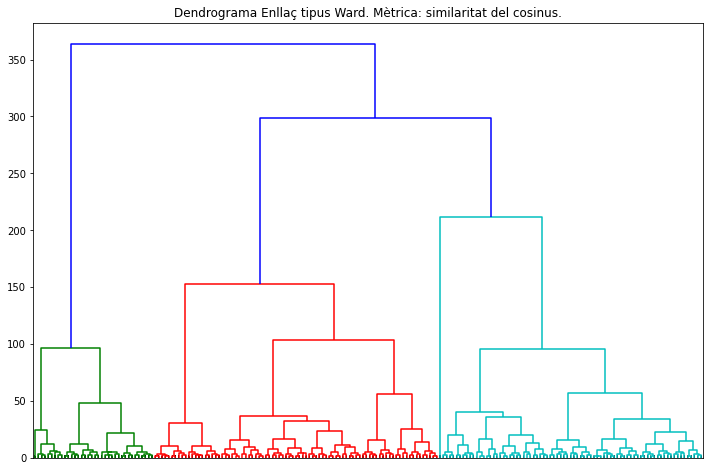

#Visualització dendrograma (PCA): (12390, 2) 
 Durada:  0 minut/s  7 segons.


In [19]:
# Visualització de tota la jerarquía de clústers
# usant un enllaç de tipus ward (Minimització variança):
lnk="Ward"
plt.figure(figsize=(12,8))
time_start = time.time()
Z1_c=hc.ward(X_PCA_cosine)
dn=dendrogram(Z1_c,
              truncate_mode='lastp', # Mostra només els últims p clústers units.
              p=200, # valor de p
              leaf_rotation=90., # rotació d'etiquetes en l'eix de les abcises.
              leaf_font_size=None, # mida de la font en les etiquetes de l'eix de les abcises.
              no_labels=True,
              show_contracted=True # val True quan s'aplica el 'truncate_mode'.
             )
temps=(time.time()-time_start)/60
plt.title("Dendrograma Enllaç tipus {}. Mètrica: similaritat del cosinus.".format(lnk))
plt.savefig("dn_ward_cosine.jpg",format='jpg',bbox_inches='tight')
plt.show()
print("#Visualització dendrograma (PCA):",np.shape(X_PCA_cosine),"\n Durada: ",int(temps) if temps>0 else 0,"minut/s ", \
      int((temps-int(temps))*60),"segons.")


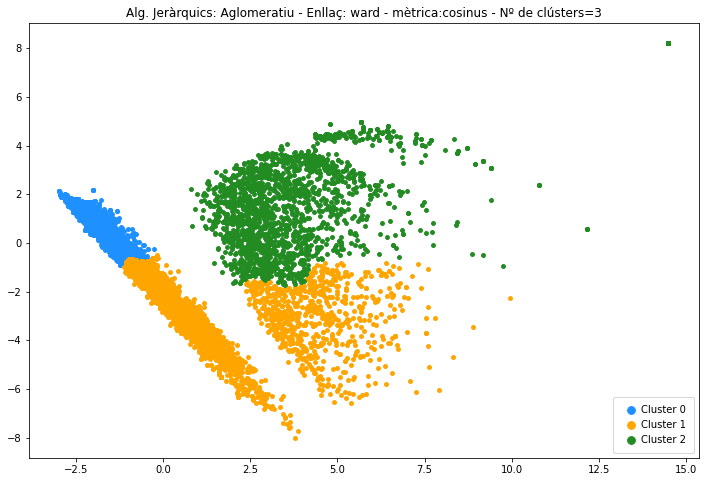

In [99]:
lnk='ward'
num_clusters=3
tall=hc.fcluster(Z1_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-ward_{}_cosine.jpg".format(num_clusters),format='jpg',bbox_inches='tight')
plt.show()

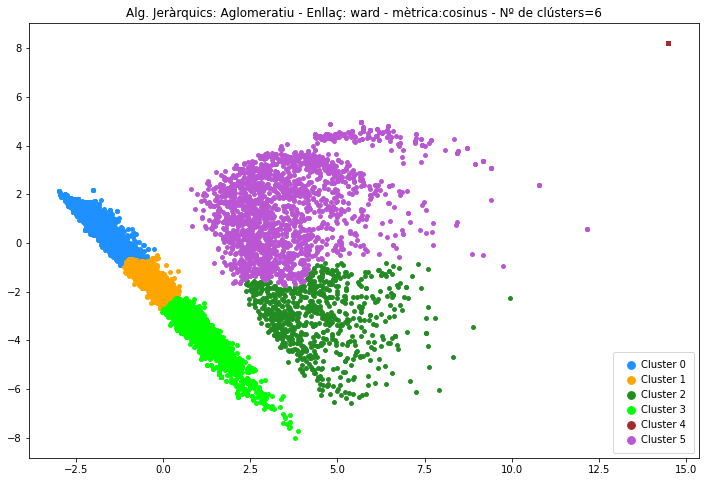

In [100]:
lnk='ward'
num_clusters=6
tall=hc.fcluster(Z1_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-ward_{}_cosine.jpg".format(num_clusters),format='jpg',bbox_inches='tight')
plt.show()

In [ ]:
num_clusters=
tall=hc.fcluster(Z7, num_clusters, criterion='maxclust')-1
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf, 15)

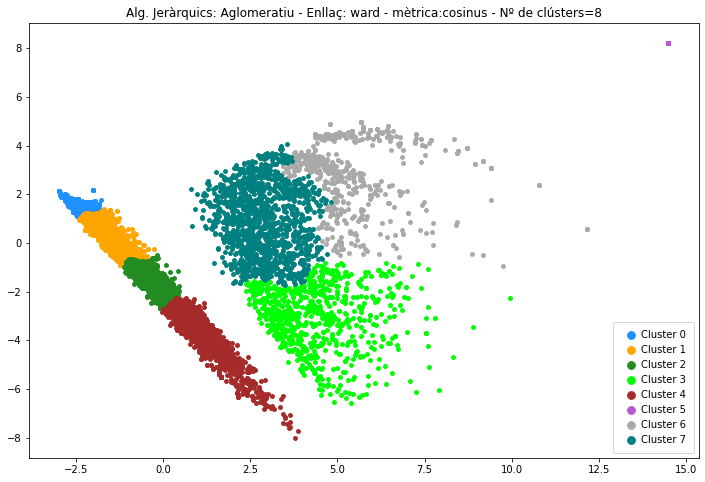

In [101]:
lnk='ward'
num_clusters=8
tall=hc.fcluster(Z1_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-ward_{}_cosine.jpg".format(num_clusters),format='jpg',bbox_inches='tight')
plt.show()

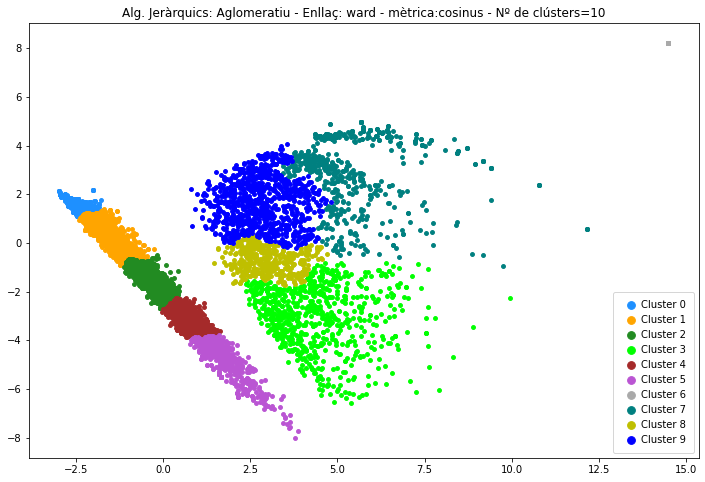

In [102]:
lnk='ward'
num_clusters=10
tall=hc.fcluster(Z1_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-ward_{}_cosine.jpg".format(num_clusters),format='jpg',bbox_inches='tight')
plt.show()

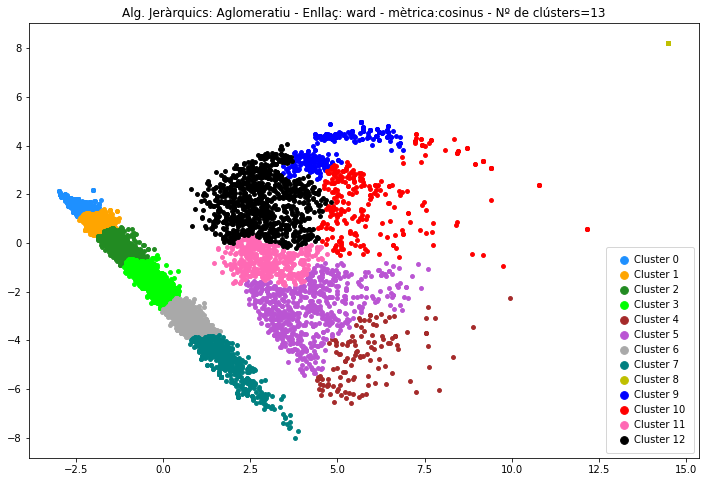

In [103]:
lnk='ward'
num_clusters=13
tall=hc.fcluster(Z1_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-ward_{}_cosine.jpg".format(num_clusters),format='jpg',bbox_inches='tight')
plt.show()

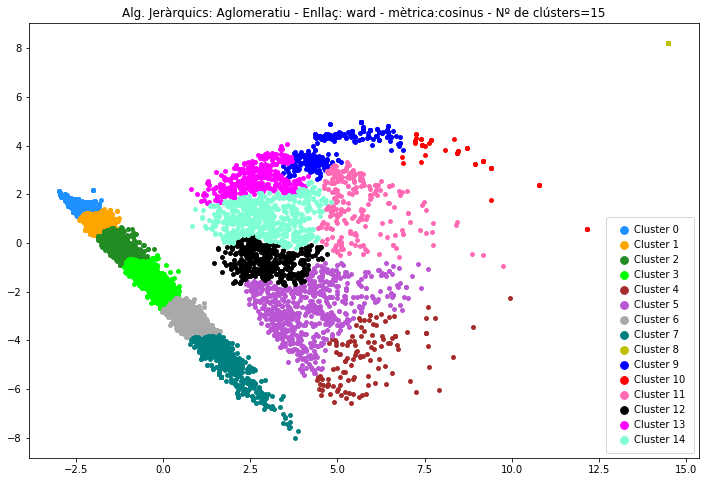

In [104]:
lnk='ward'
num_clusters=15
tall=hc.fcluster(Z1_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-ward_{}_cosine.jpg".format(num_clusters),format='jpg',bbox_inches='tight')
plt.show()

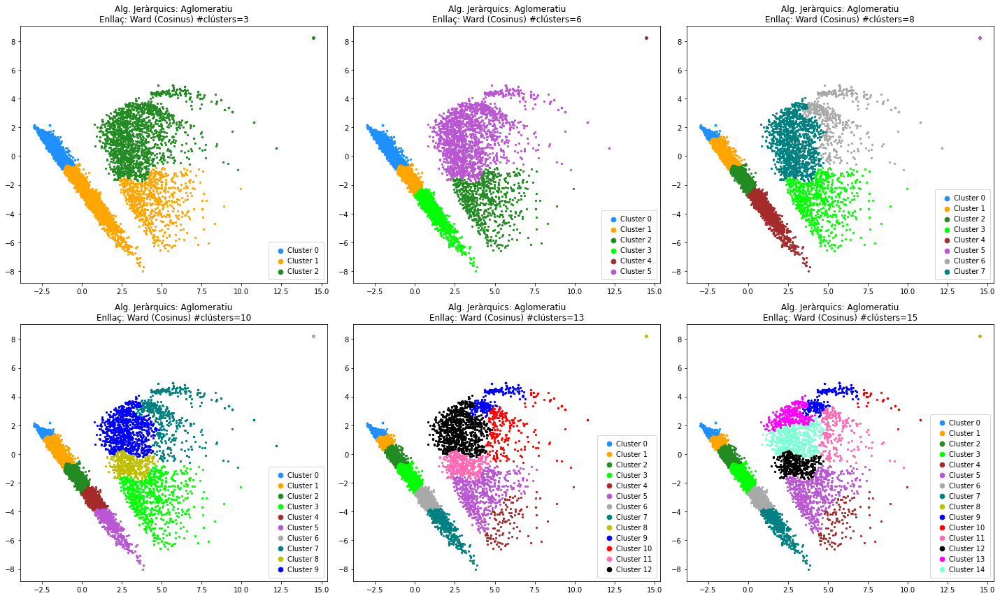

In [107]:
files=2
cols=3
lnk='Ward (Cosinus)'
alt=20
ample=12
m=0
fig, ax = plt.subplots(files,cols,figsize=(alt,ample))

llista_clusters=[3,6,8,10,13,15]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.fcluster(Z1_c, num_clusters, criterion='maxclust')-1
        colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
        cmap = plt.cm.Spectral
        norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
        for idcluster in range(num_clusters):
            ax[i,j].scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
                       np.array(X_PCA_cosine[:,1][tall==idcluster]), s=5, \
                       c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
            ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        ax[i,j].legend(loc='lower right', handletextpad=0, borderpad=0.7, markerscale=3)
        m=m+1
plt.tight_layout()
plt.savefig("last_Ward_cosine.jpg",format='jpg',bbox_inches='tight')

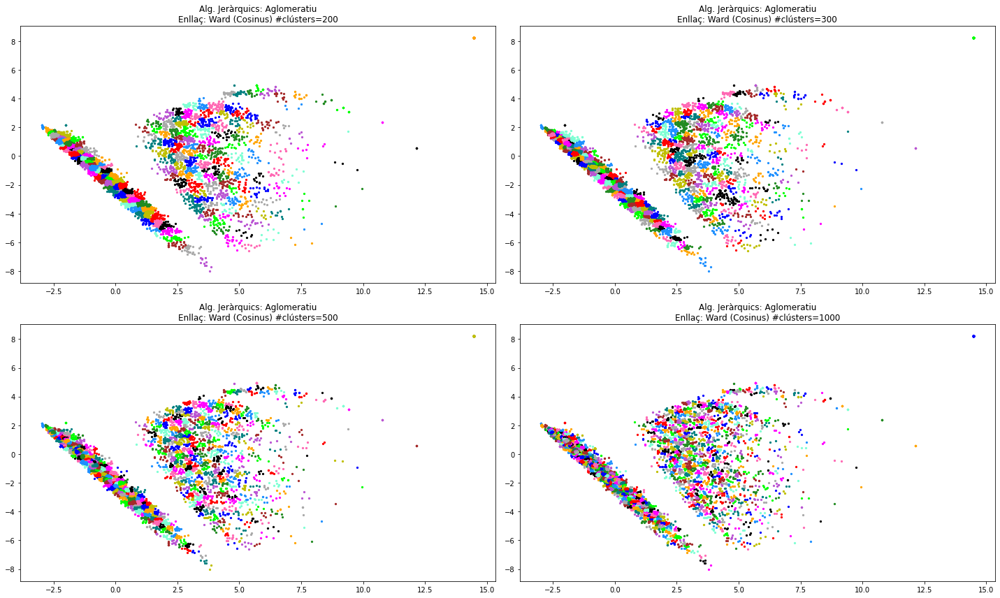

In [108]:
files=2
cols=2
lnk='Ward (Cosinus)'
alt=20
ample=12
m=0
fig, ax = plt.subplots(files,cols,figsize=(alt,ample))

llista_clusters=[200,300,500,1000]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.fcluster(Z1_c, num_clusters, criterion='maxclust')-1
        colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
        cmap = plt.cm.Spectral
        norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
        for idcluster in range(num_clusters):
            ax[i,j].scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
                       np.array(X_PCA_cosine[:,1][tall==idcluster]), s=5, \
                       c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
            ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        #ax[i,j].legend(handletextpad=0,borderpad=0,markerscale=3)
        m=m+1
plt.tight_layout()
plt.savefig("last_Ward_cosine_200_300_500_1000.jpg",format='jpg',bbox_inches='tight')

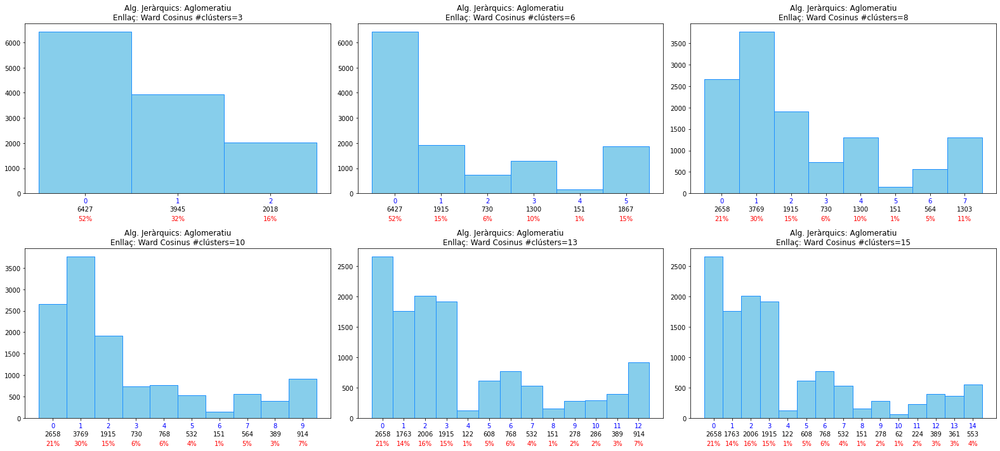

In [112]:
files=2
cols=3
lnk='Ward Cosinus'
alt=10
ample=22
m=0
fig, ax = plt.subplots(files,cols,figsize=(ample, alt))
llista_clusters=[3,6,8,10,13,15]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.fcluster(Z1_c, num_clusters, criterion='maxclust')-1
        counts, bins, patches = ax[i,j].hist(tall, bins=np.array(range(0,num_clusters+1)), facecolor='skyblue', edgecolor='dodgerblue')
        ax[i,j].xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
        bin_centers = 0.5 * np.diff(bins) + bins[:-1]
        ax[i,j].set_xticks(bin_centers)
        ax[i,j].set_xticklabels(bins, rotation=0,color='b')
        ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        for count, x in zip(counts.astype(int), bin_centers):
            # Label the raw counts
            ax[i,j].annotate(str(count), xy=(x, 0), xycoords=('data', 'axes fraction'),
                xytext=(0, -20), textcoords='offset points', va='top', ha='center')
            # Label the percentages
            percent = '%0.0f%%' % (100 * float(count) / counts.sum())
            ax[i,j].annotate(percent, xy=(x, 0), xycoords=('data', 'axes fraction'),
                xytext=(0, -35), textcoords='offset points', va='top', ha='center',c='r')
        m=m+1
        plt.tight_layout()
        
plt.savefig("hist_ward_cosine.jpg",format='jpg',bbox_inches='tight')

## SINGLE

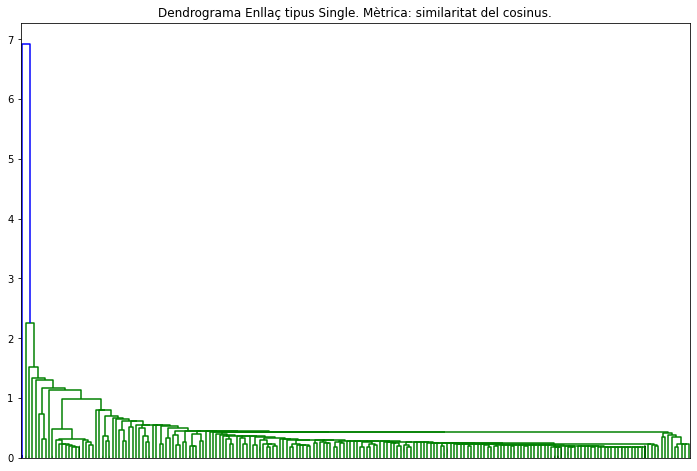

#Visualització dendrograma (PCA): (12390, 2) 
 Durada:  0 minut/s  4 segons.


In [20]:
# Visualització de tota la jerarquía de clústers
# usant un enllaç de tipus ward (Minimització variança):
lnk="Single"
plt.figure(figsize=(12,8))
time_start = time.time()
Z2_c=hc.single(X_PCA_cosine)
dn=dendrogram(Z2_c,
              truncate_mode='lastp', # Mostra només els últims p clústers units.
              p=200, # valor de p
              leaf_rotation=90., # rotació d'etiquetes en l'eix de les abcises.
              leaf_font_size=None, # mida de la font en les etiquetes de l'eix de les abcises.
              no_labels=True,
              show_contracted=True # val True quan s'aplica el 'truncate_mode'.
             )
temps=(time.time()-time_start)/60
plt.title("Dendrograma Enllaç tipus {}. Mètrica: similaritat del cosinus.".format(lnk))
plt.savefig("dn_single_cosine.jpg",format='jpg',bbox_inches='tight')
plt.show()
print("#Visualització dendrograma (PCA):",np.shape(X_PCA_cosine),"\n Durada: ",int(temps) if temps>0 else 0,"minut/s ", \
      int((temps-int(temps))*60),"segons.")


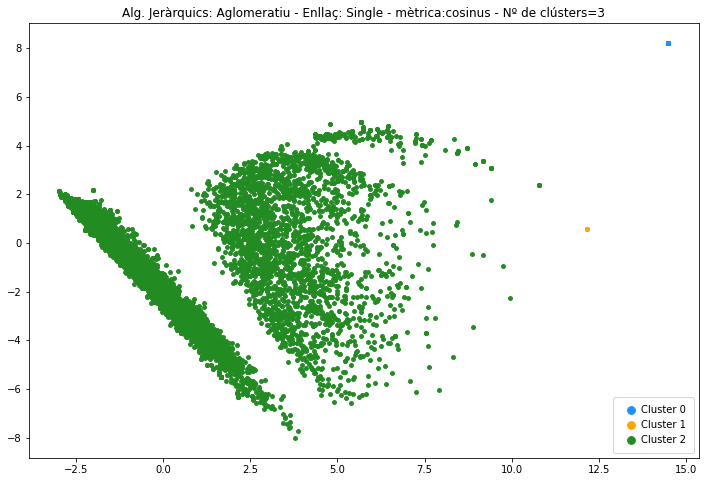

In [110]:
lnk='Single'
num_clusters=3
tall=hc.fcluster(Z2_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-{}_{}_cosine.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

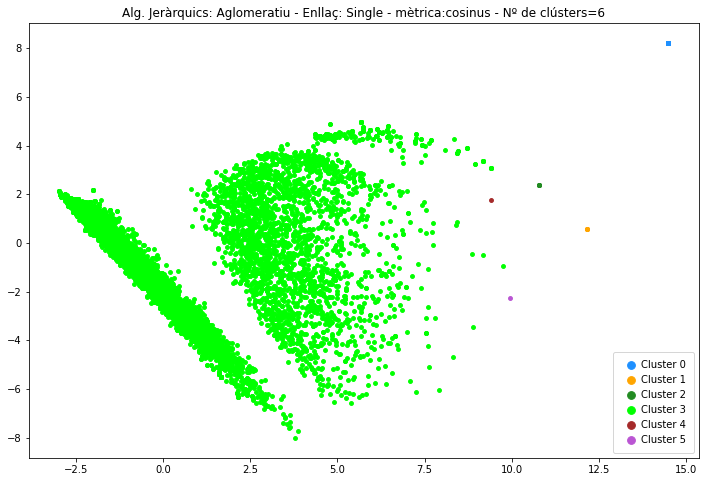

In [111]:
lnk='Single'
num_clusters=6
tall=hc.fcluster(Z2_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-{}_{}_cosine.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

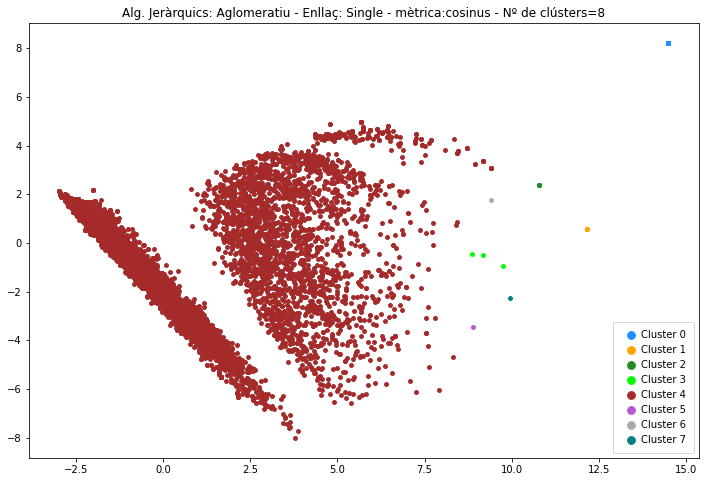

In [112]:
lnk='Single'
num_clusters=8
tall=hc.fcluster(Z2_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-{}_{}_cosine.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

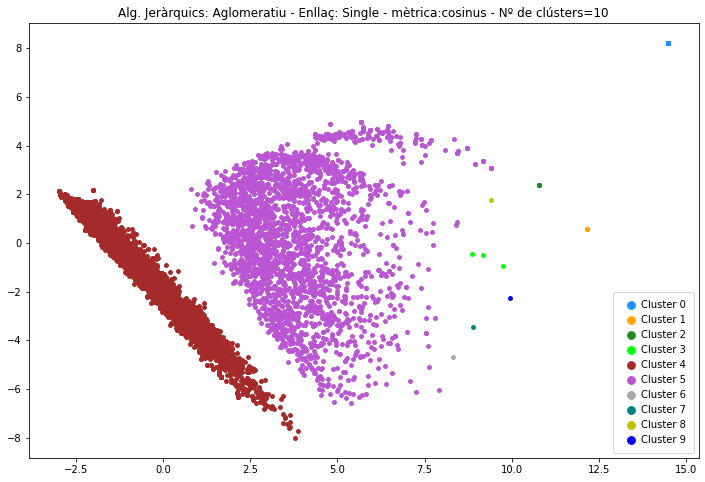

In [113]:
lnk='Single'
num_clusters=10
tall=hc.fcluster(Z2_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-{}_{}_cosine.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

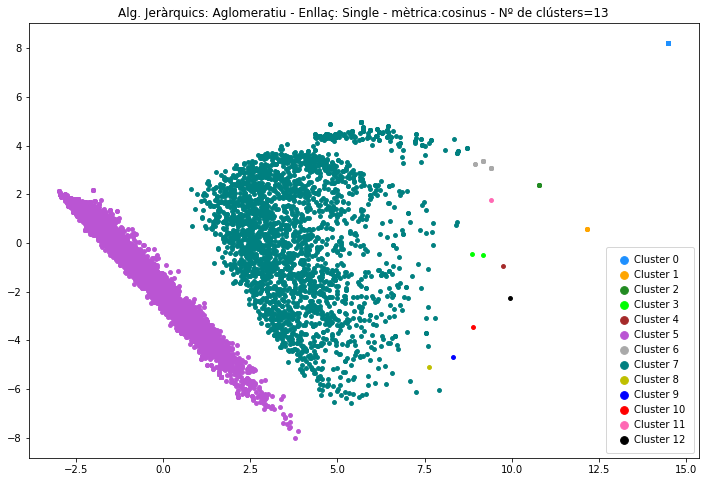

In [114]:
lnk='Single'
num_clusters=13
tall=hc.fcluster(Z2_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-{}_{}_cosine.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

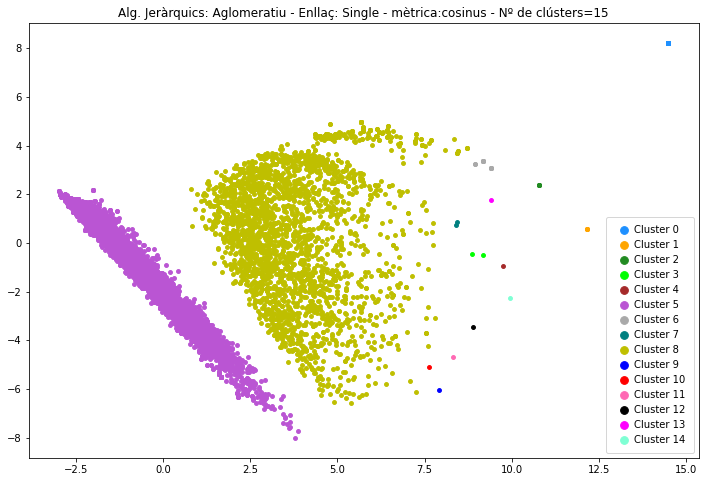

In [115]:
lnk='Single'
num_clusters=15
tall=hc.fcluster(Z2_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-{}_{}_cosine.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

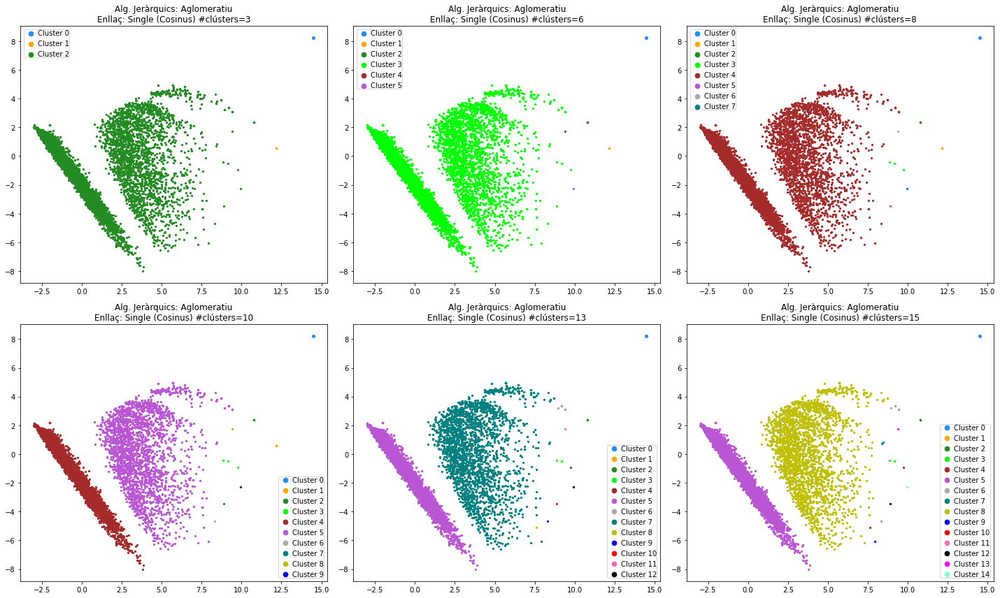

In [116]:
files=2
cols=3
lnk='Single (Cosinus)'
alt=20
ample=12
m=0
fig, ax = plt.subplots(files,cols,figsize=(alt,ample))

llista_clusters=[3,6,8,10,13,15]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.fcluster(Z2_c, num_clusters, criterion='maxclust')-1
        colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
        # Algorisme jeràrquic bottom-up
        #ahc = AgglomerativeClustering(n_clusters=num_clusters,linkage=lnk).fit(X_PCA)
        cmap = plt.cm.Spectral
        norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
        for idcluster in range(num_clusters):
            ax[i,j].scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
                       np.array(X_PCA_cosine[:,1][tall==idcluster]), s=5, \
                       c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
            ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        ax[i,j].legend(handletextpad=0,borderpad=0,markerscale=3)
        m=m+1
plt.tight_layout()
plt.savefig("last_Single_cosine.jpg",format='jpg',bbox_inches='tight')

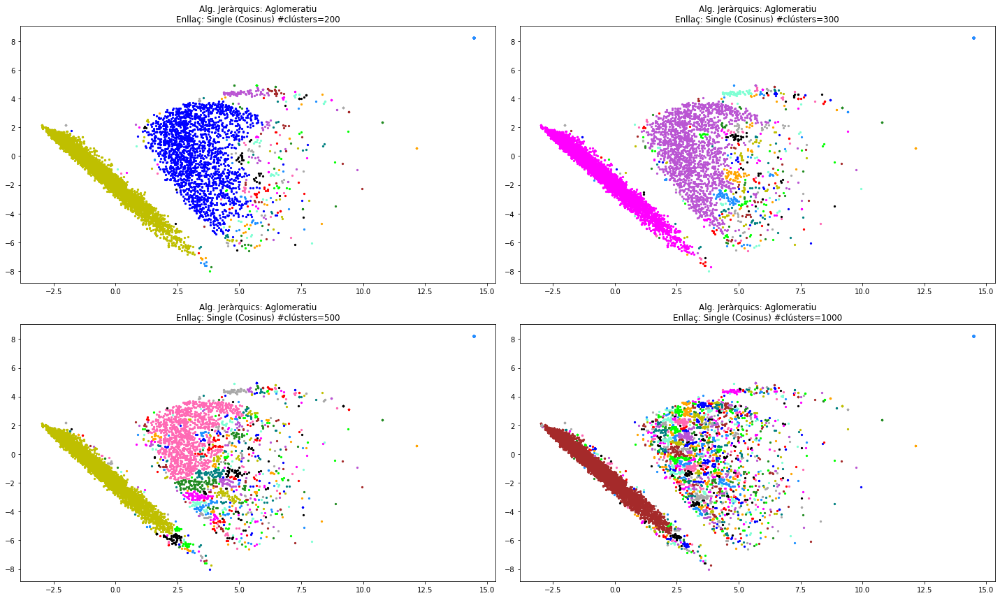

In [117]:
files=2
cols=2
lnk='Single (Cosinus)'
alt=20
ample=12
m=0
fig, ax = plt.subplots(files,cols,figsize=(alt,ample))

llista_clusters=[200,300,500,1000]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.fcluster(Z2_c, num_clusters, criterion='maxclust')-1
        colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
        cmap = plt.cm.Spectral
        norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
        for idcluster in range(num_clusters):
            ax[i,j].scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
                       np.array(X_PCA_cosine[:,1][tall==idcluster]), s=5, \
                       c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
            ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        #ax[i,j].legend(handletextpad=0,borderpad=0,markerscale=3)
        m=m+1
plt.tight_layout()
plt.savefig("last_Single_cosine_200_300_500_1000.jpg",format='jpg',bbox_inches='tight')

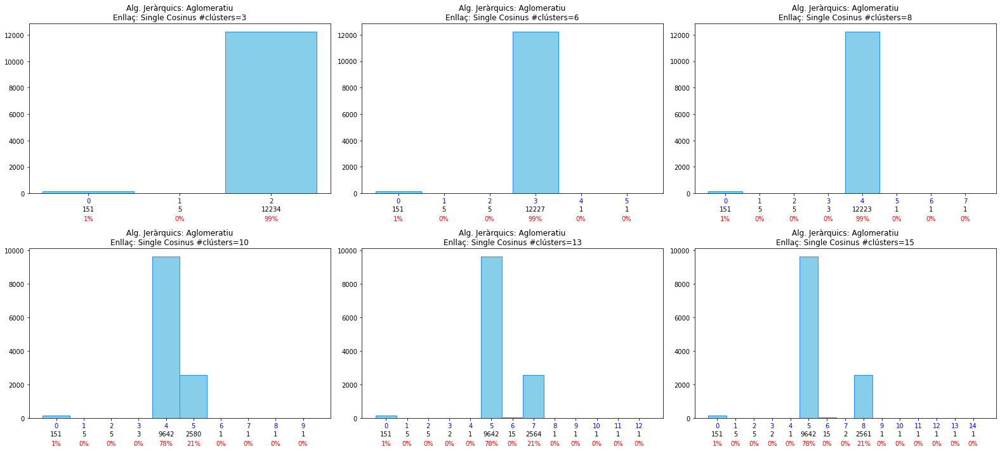

In [116]:
files=2
cols=3
lnk='Single Cosinus'
alt=10
ample=22
m=0
fig, ax = plt.subplots(files,cols,figsize=(ample, alt))
llista_clusters=[3,6,8,10,13,15]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.fcluster(Z2_c, num_clusters, criterion='maxclust')-1
        counts, bins, patches = ax[i,j].hist(tall, bins=np.array(range(0,num_clusters+1)), facecolor='skyblue', edgecolor='dodgerblue')
        ax[i,j].xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
        bin_centers = 0.5 * np.diff(bins) + bins[:-1]
        ax[i,j].set_xticks(bin_centers)
        ax[i,j].set_xticklabels(bins, rotation=0,color='b')
        ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        for count, x in zip(counts.astype(int), bin_centers):
            # Label the raw counts
            ax[i,j].annotate(str(count), xy=(x, 0), xycoords=('data', 'axes fraction'),
                xytext=(0, -20), textcoords='offset points', va='top', ha='center')
            # Label the percentages
            percent = '%0.0f%%' % (100 * float(count) / counts.sum())
            ax[i,j].annotate(percent, xy=(x, 0), xycoords=('data', 'axes fraction'),
                xytext=(0, -35), textcoords='offset points', va='top', ha='center',c='r')
        m=m+1
        plt.tight_layout()
        
plt.savefig("hist_single_cosine.jpg",format='jpg',bbox_inches='tight')

## Complet COSINUS

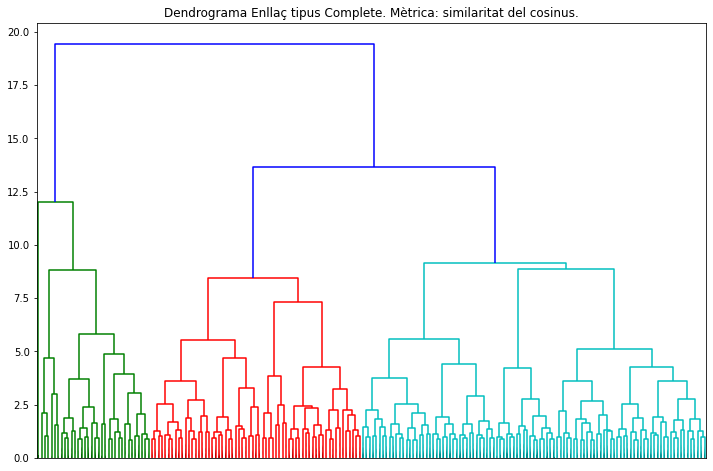

#Visualització dendrograma (PCA): (12390, 2) 
 Durada:  0 minut/s  8 segons.


In [21]:
# Visualització de tota la jerarquía de clústers
# usant un enllaç de tipus ward (Minimització variança):
lnk="Complete"
plt.figure(figsize=(12,8))
time_start = time.time()
Z3_c=hc.complete(X_PCA_cosine)
dn=dendrogram(Z3_c,
              truncate_mode='lastp', # Mostra només els últims p clústers units.
              p=200, # valor de p
              leaf_rotation=90., # rotació d'etiquetes en l'eix de les abcises.
              leaf_font_size=None, # mida de la font en les etiquetes de l'eix de les abcises.
              no_labels=True,
              show_contracted=True # val True quan s'aplica el 'truncate_mode'.
             )
temps=(time.time()-time_start)/60
plt.title("Dendrograma Enllaç tipus {}. Mètrica: similaritat del cosinus.".format(lnk))
plt.savefig("dn_complete_cosine.jpg",format='jpg',bbox_inches='tight')
plt.show()
print("#Visualització dendrograma (PCA):",np.shape(X_PCA_cosine),"\n Durada: ",int(temps) if temps>0 else 0,"minut/s ", \
      int((temps-int(temps))*60),"segons.")


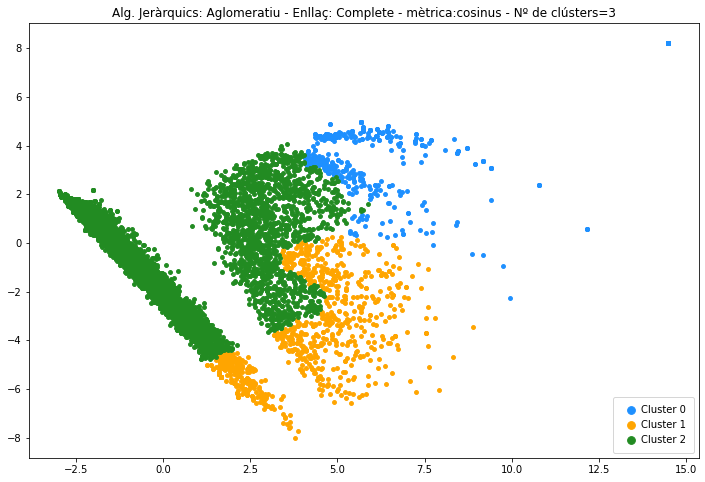

In [119]:
lnk='Complete'
num_clusters=3
tall=hc.fcluster(Z3_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-{}_{}_cosine.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

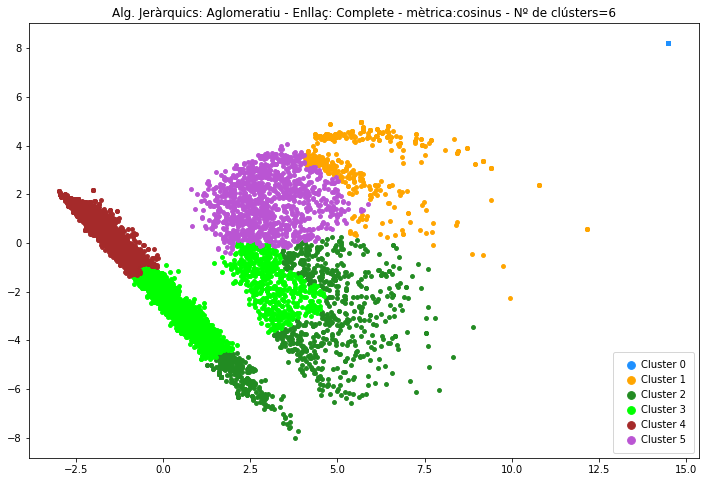

In [120]:
lnk='Complete'
num_clusters=6
tall=hc.fcluster(Z3_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-{}_{}_cosine.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

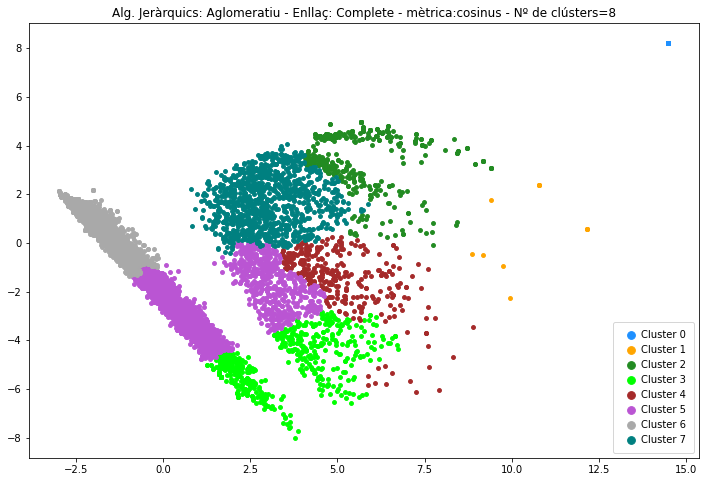

In [121]:
lnk='Complete'
num_clusters=8
tall=hc.fcluster(Z3_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-{}_{}_cosine.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

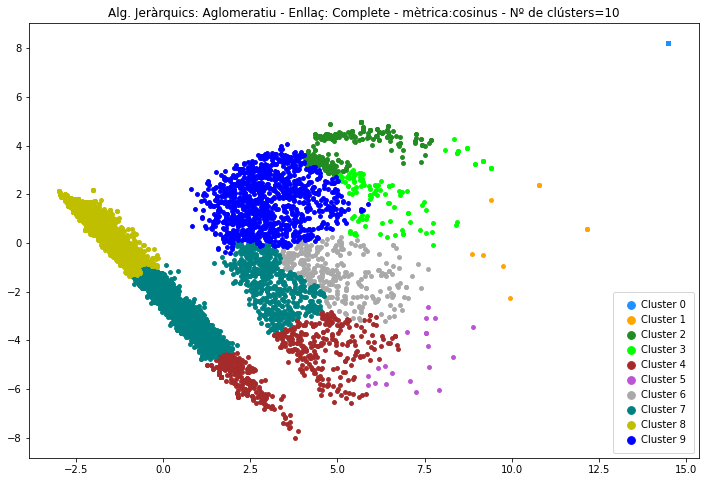

In [122]:
lnk='Complete'
num_clusters=10
tall=hc.fcluster(Z3_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-{}_{}_cosine.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

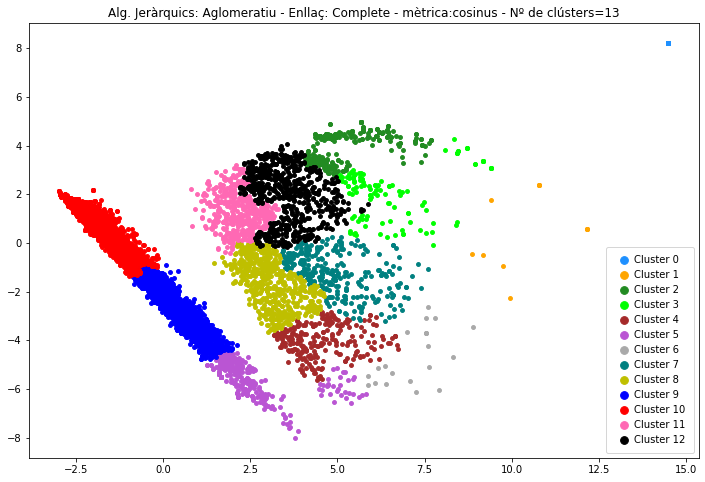

In [123]:
lnk='Complete'
num_clusters=13
tall=hc.fcluster(Z3_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-{}_{}_cosine.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

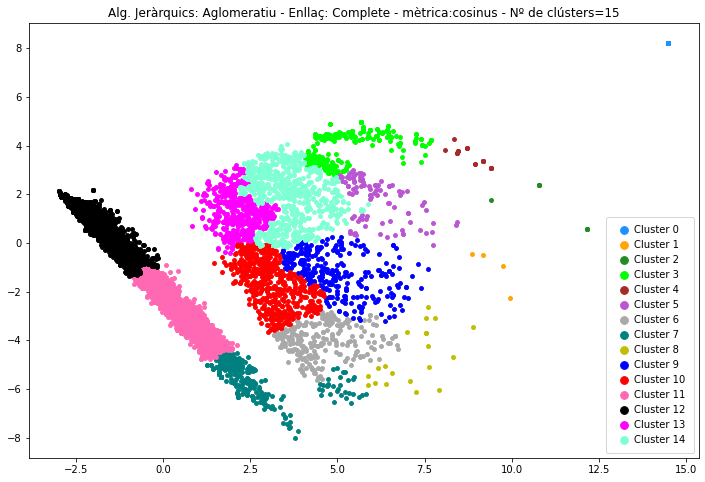

In [124]:
lnk='Complete'
num_clusters=15
tall=hc.fcluster(Z3_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-{}_{}_cosine.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

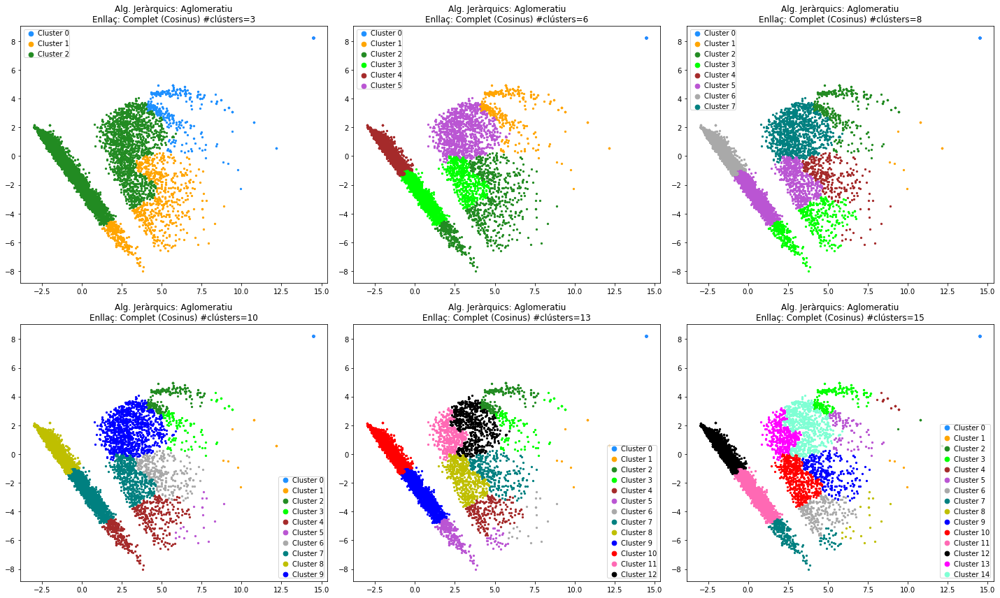

In [125]:
files=2
cols=3
lnk='Complet (Cosinus)'
alt=20
ample=12
m=0
fig, ax = plt.subplots(files,cols,figsize=(alt,ample))

llista_clusters=[3,6,8,10,13,15]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.fcluster(Z3_c, num_clusters, criterion='maxclust')-1
        colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
        # Algorisme jeràrquic bottom-up
        #ahc = AgglomerativeClustering(n_clusters=num_clusters,linkage=lnk).fit(X_PCA)
        cmap = plt.cm.Spectral
        norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
        for idcluster in range(num_clusters):
            ax[i,j].scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
                       np.array(X_PCA_cosine[:,1][tall==idcluster]), s=5, \
                       c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
            ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        ax[i,j].legend(handletextpad=0,borderpad=0,markerscale=3)
        m=m+1
plt.tight_layout()
plt.savefig("last_Complete_cosine.jpg",format='jpg',bbox_inches='tight')

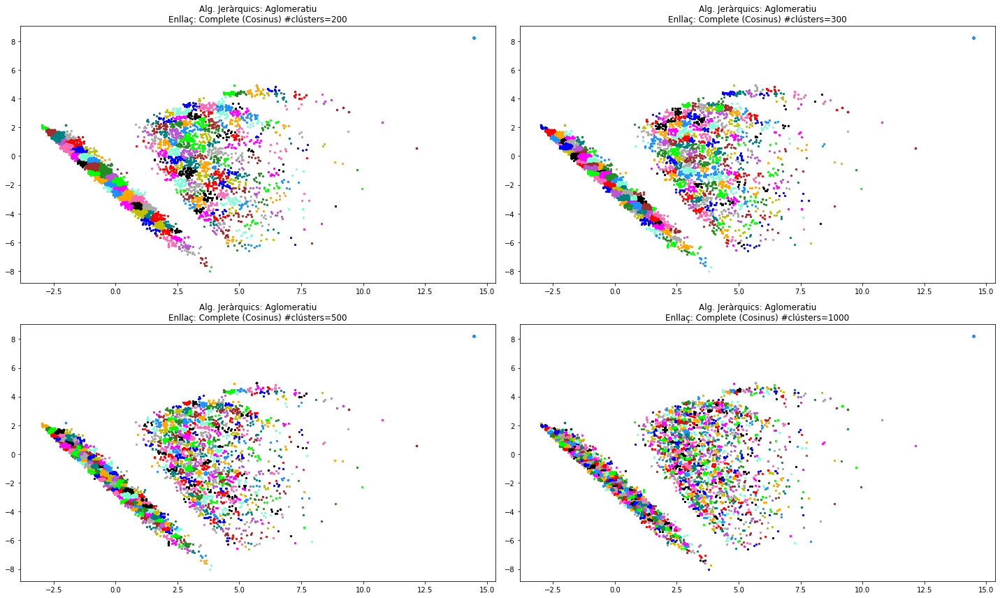

In [126]:
files=2
cols=2
lnk='Complete (Cosinus)'
alt=20
ample=12
m=0
fig, ax = plt.subplots(files,cols,figsize=(alt,ample))

llista_clusters=[200,300,500,1000]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.fcluster(Z3_c, num_clusters, criterion='maxclust')-1
        colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
        cmap = plt.cm.Spectral
        norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
        for idcluster in range(num_clusters):
            ax[i,j].scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
                       np.array(X_PCA_cosine[:,1][tall==idcluster]), s=5, \
                       c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
            ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        #ax[i,j].legend(handletextpad=0,borderpad=0,markerscale=3)
        m=m+1
plt.tight_layout()
plt.savefig("last_Complete_cosine_200_300_500_1000.jpg",format='jpg',bbox_inches='tight')

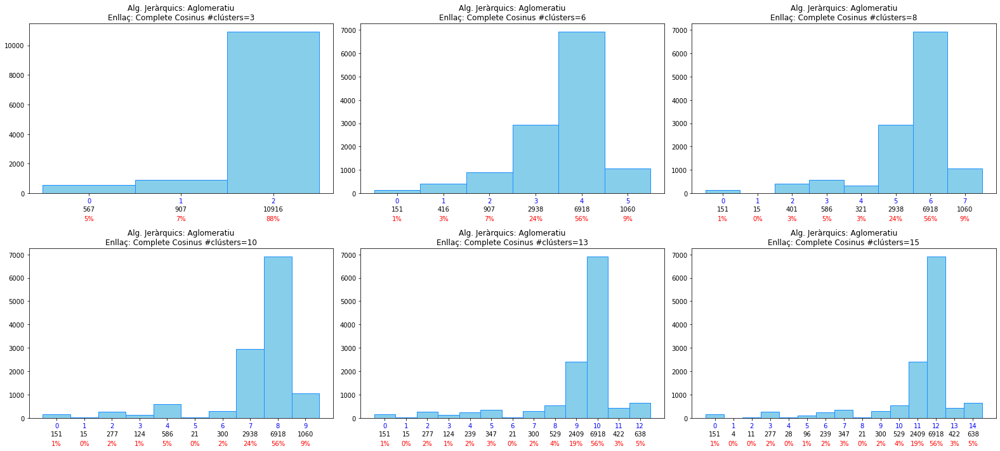

In [119]:
files=2
cols=3
lnk='Complete Cosinus'
alt=10
ample=22
m=0
fig, ax = plt.subplots(files,cols,figsize=(ample, alt))
llista_clusters=[3,6,8,10,13,15]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.fcluster(Z3_c, num_clusters, criterion='maxclust')-1
        counts, bins, patches = ax[i,j].hist(tall, bins=np.array(range(0,num_clusters+1)), facecolor='skyblue', edgecolor='dodgerblue')
        ax[i,j].xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
        bin_centers = 0.5 * np.diff(bins) + bins[:-1]
        ax[i,j].set_xticks(bin_centers)
        ax[i,j].set_xticklabels(bins, rotation=0,color='b')
        ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        for count, x in zip(counts.astype(int), bin_centers):
            # Label the raw counts
            ax[i,j].annotate(str(count), xy=(x, 0), xycoords=('data', 'axes fraction'),
                xytext=(0, -20), textcoords='offset points', va='top', ha='center')
            # Label the percentages
            percent = '%0.0f%%' % (100 * float(count) / counts.sum())
            ax[i,j].annotate(percent, xy=(x, 0), xycoords=('data', 'axes fraction'),
                xytext=(0, -35), textcoords='offset points', va='top', ha='center',c='r')
        m=m+1
        plt.tight_layout()
        
plt.savefig("hist_complete_cosine.jpg",format='jpg',bbox_inches='tight')

## AVERAGE

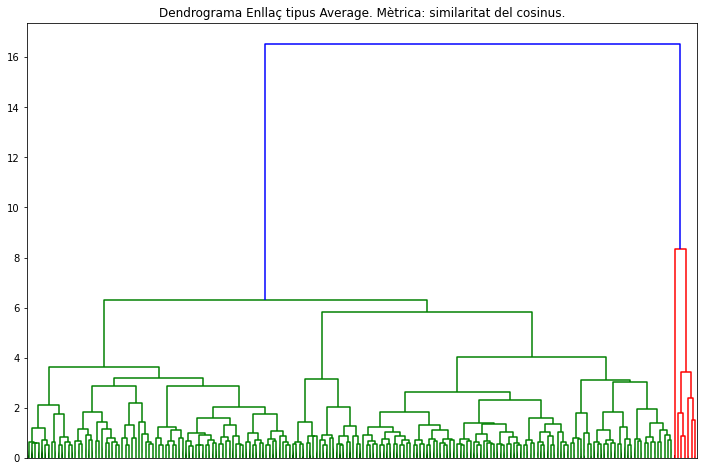

#Visualització dendrograma (PCA): (12390, 2) 
 Durada:  0 minut/s  7 segons.


In [22]:
# Visualització de tota la jerarquía de clústers
# usant un enllaç de tipus ward (Minimització variança):
lnk="Average"
plt.figure(figsize=(12,8))
time_start = time.time()
Z4_c=hc.average(X_PCA_cosine)
dn=dendrogram(Z4_c,
              truncate_mode='lastp', # Mostra només els últims p clústers units.
              p=200, # valor de p
              leaf_rotation=90., # rotació d'etiquetes en l'eix de les abcises.
              leaf_font_size=None, # mida de la font en les etiquetes de l'eix de les abcises.
              no_labels=True,
              show_contracted=True # val True quan s'aplica el 'truncate_mode'.
             )
temps=(time.time()-time_start)/60
plt.title("Dendrograma Enllaç tipus {}. Mètrica: similaritat del cosinus.".format(lnk))
plt.savefig("dn_average_cosine.jpg",format='jpg',bbox_inches='tight')
plt.show()
print("#Visualització dendrograma (PCA):",np.shape(X_PCA_cosine),"\n Durada: ",int(temps) if temps>0 else 0,"minut/s ", \
      int((temps-int(temps))*60),"segons.")


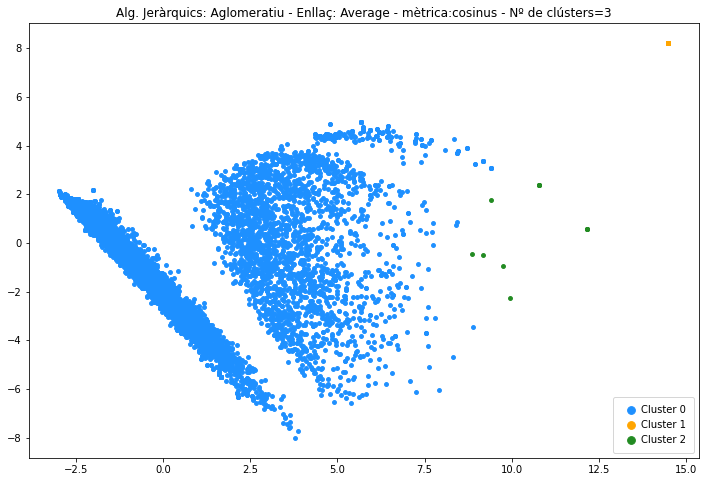

In [128]:
lnk='Average'
num_clusters=3
tall=hc.fcluster(Z4_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-{}_{}_cosine.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

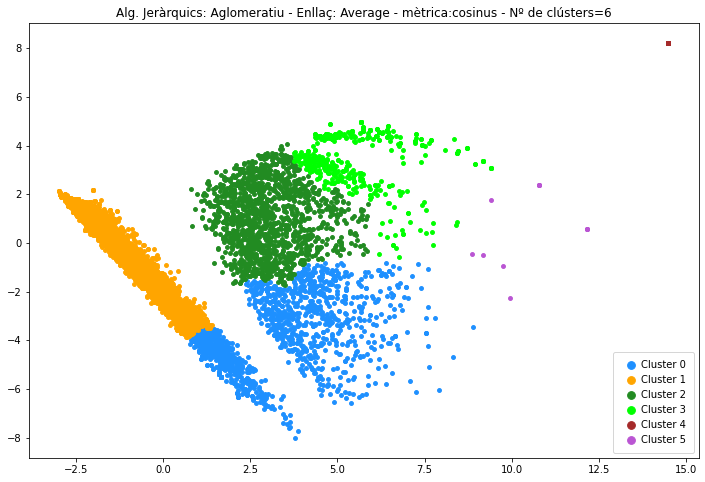

In [129]:
lnk='Average'
num_clusters=6
tall=hc.fcluster(Z4_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-{}_{}_cosine.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

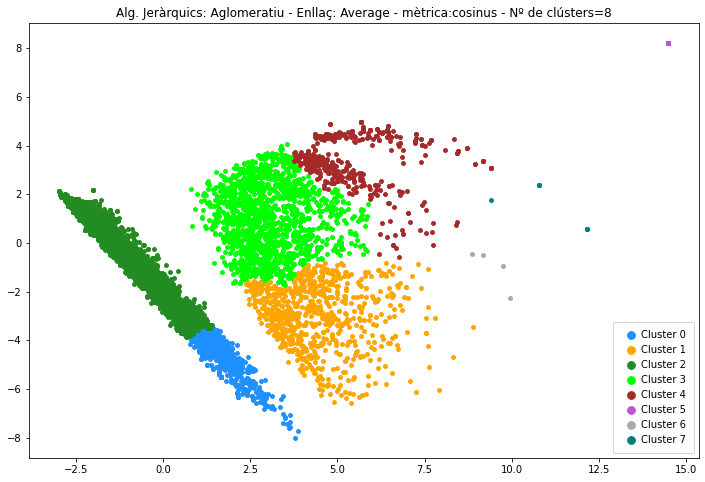

In [130]:
lnk='Average'
num_clusters=8
tall=hc.fcluster(Z4_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-{}_{}_cosine.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

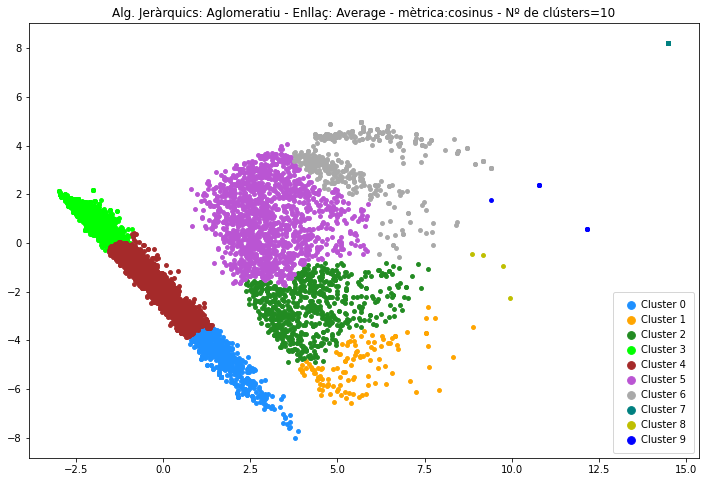

In [131]:
lnk='Average'
num_clusters=10
tall=hc.fcluster(Z4_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-{}_{}_cosine.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

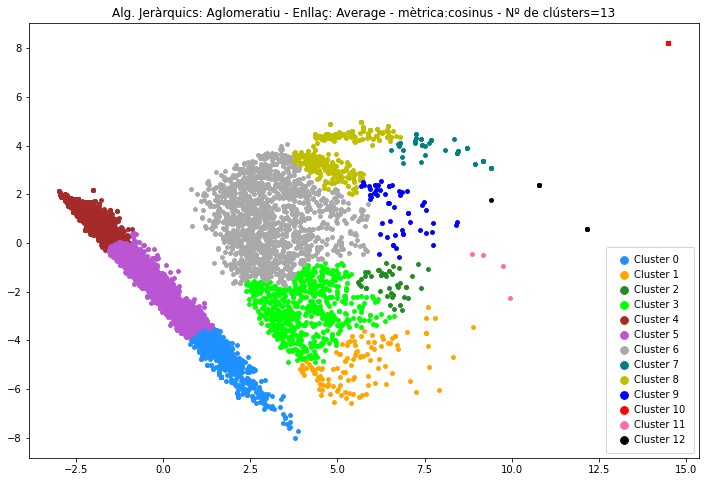

In [132]:
lnk='Average'
num_clusters=13
tall=hc.fcluster(Z4_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-{}_{}_cosine.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

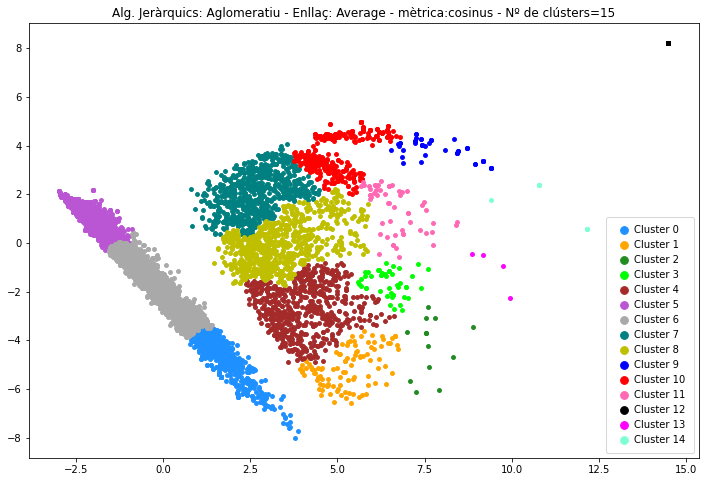

In [133]:
lnk='Average'
num_clusters=15
tall=hc.fcluster(Z4_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-{}_{}_cosine.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

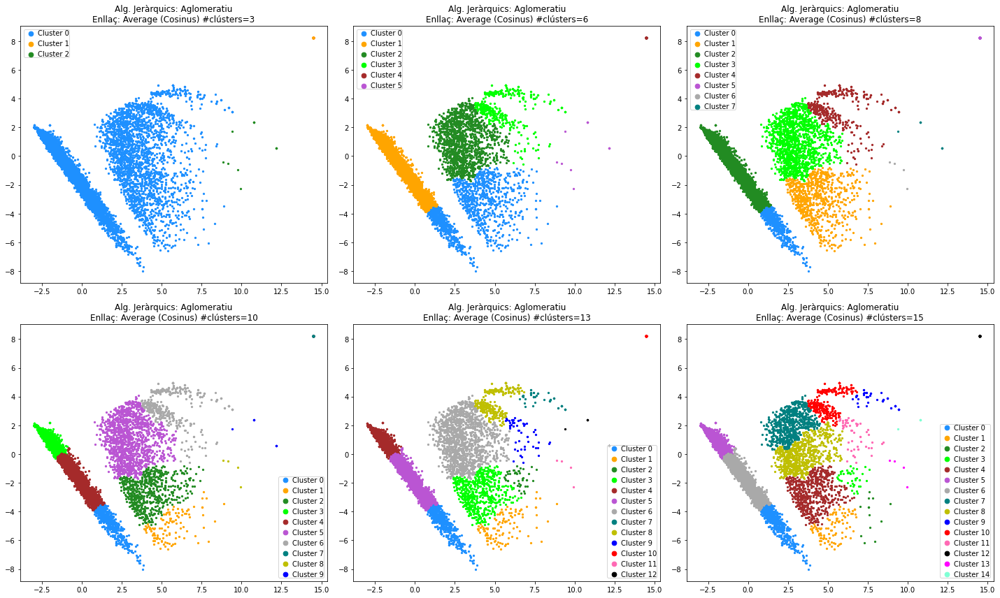

In [134]:
files=2
cols=3
lnk='Average (Cosinus)'
alt=20
ample=12
m=0
fig, ax = plt.subplots(files,cols,figsize=(alt,ample))

llista_clusters=[3,6,8,10,13,15]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.fcluster(Z4_c, num_clusters, criterion='maxclust')-1
        colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
        # Algorisme jeràrquic bottom-up
        #ahc = AgglomerativeClustering(n_clusters=num_clusters,linkage=lnk).fit(X_PCA)
        cmap = plt.cm.Spectral
        norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
        for idcluster in range(num_clusters):
            ax[i,j].scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
                       np.array(X_PCA_cosine[:,1][tall==idcluster]), s=5, \
                       c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
            ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        ax[i,j].legend(handletextpad=0,borderpad=0,markerscale=3)
        m=m+1
plt.tight_layout()
plt.savefig("last_Average_cosine.jpg",format='jpg',bbox_inches='tight')

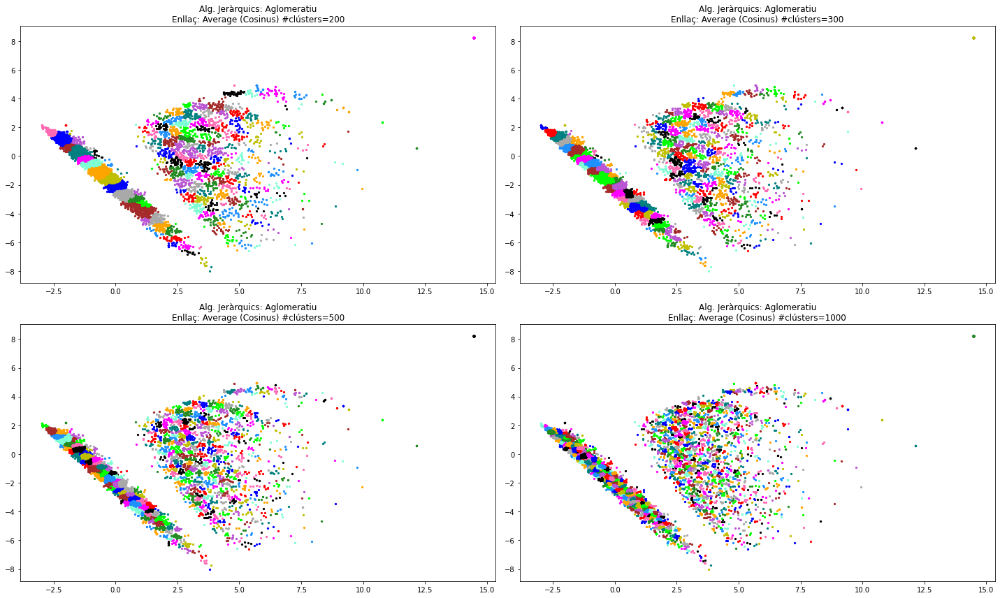

In [135]:
files=2
cols=2
lnk='Average (Cosinus)'
alt=20
ample=12
m=0
fig, ax = plt.subplots(files,cols,figsize=(alt,ample))

llista_clusters=[200,300,500,1000]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.fcluster(Z4_c, num_clusters, criterion='maxclust')-1
        colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
        cmap = plt.cm.Spectral
        norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
        for idcluster in range(num_clusters):
            ax[i,j].scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
                       np.array(X_PCA_cosine[:,1][tall==idcluster]), s=5, \
                       c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
            ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        #ax[i,j].legend(handletextpad=0,borderpad=0,markerscale=3)
        m=m+1
plt.tight_layout()
plt.savefig("last_Average_cosine_200_300_500_1000.jpg",format='jpg',bbox_inches='tight')

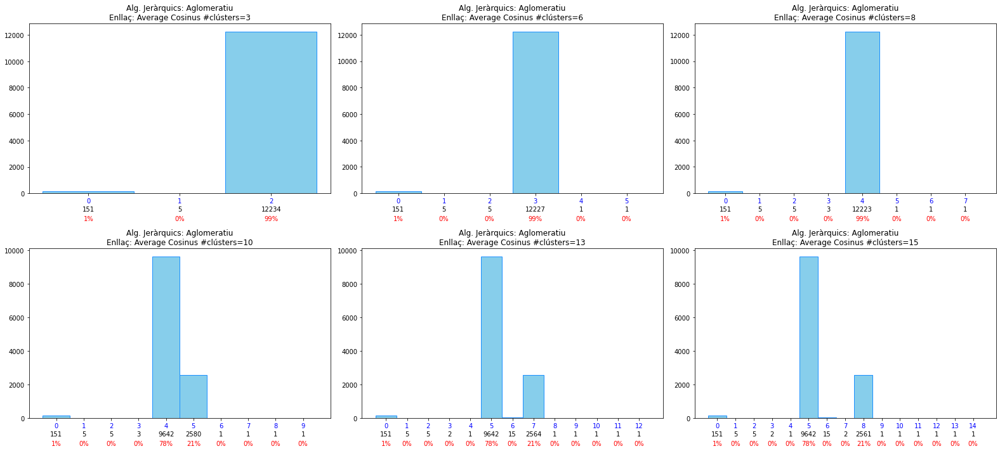

In [123]:
files=2
cols=3
lnk='Average Cosinus'
alt=10
ample=22
m=0
fig, ax = plt.subplots(files,cols,figsize=(ample, alt))
llista_clusters=[3,6,8,10,13,15]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.fcluster(Z4_c, num_clusters, criterion='maxclust')-1
        counts, bins, patches = ax[i,j].hist(tall, bins=np.array(range(0,num_clusters+1)), facecolor='skyblue', edgecolor='dodgerblue')
        ax[i,j].xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
        bin_centers = 0.5 * np.diff(bins) + bins[:-1]
        ax[i,j].set_xticks(bin_centers)
        ax[i,j].set_xticklabels(bins, rotation=0,color='b')
        ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        for count, x in zip(counts.astype(int), bin_centers):
            # Label the raw counts
            ax[i,j].annotate(str(count), xy=(x, 0), xycoords=('data', 'axes fraction'),
                xytext=(0, -20), textcoords='offset points', va='top', ha='center')
            # Label the percentages
            percent = '%0.0f%%' % (100 * float(count) / counts.sum())
            ax[i,j].annotate(percent, xy=(x, 0), xycoords=('data', 'axes fraction'),
                xytext=(0, -35), textcoords='offset points', va='top', ha='center',c='r')
        m=m+1
        plt.tight_layout()
        
plt.savefig("hist_Average_cosine.jpg",format='jpg',bbox_inches='tight')

## CENTROIDE

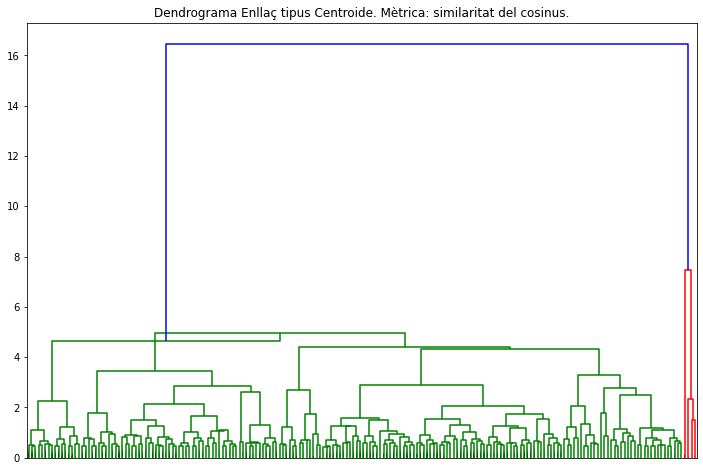

#Visualització dendrograma (PCA): (12390, 2) 
 Durada:  0 minut/s  8 segons.


In [23]:
# Visualització de tota la jerarquía de clústers
# usant un enllaç de tipus ward (Minimització variança):
lnk="Centroide"
plt.figure(figsize=(12,8))
time_start = time.time()
Z6_c=hc.centroid(X_PCA_cosine)
dn=dendrogram(Z6_c,
              truncate_mode='lastp', # Mostra només els últims p clústers units.
              p=200, # valor de p
              leaf_rotation=90., # rotació d'etiquetes en l'eix de les abcises.
              leaf_font_size=None, # mida de la font en les etiquetes de l'eix de les abcises.
              no_labels=True,
              show_contracted=True # val True quan s'aplica el 'truncate_mode'.
             )
temps=(time.time()-time_start)/60
plt.title("Dendrograma Enllaç tipus {}. Mètrica: similaritat del cosinus.".format(lnk))
plt.savefig("dn_average_cosine.jpg",format='jpg',bbox_inches='tight')
plt.show()
print("#Visualització dendrograma (PCA):",np.shape(X_PCA_cosine),"\n Durada: ",int(temps) if temps>0 else 0,"minut/s ", \
      int((temps-int(temps))*60),"segons.")


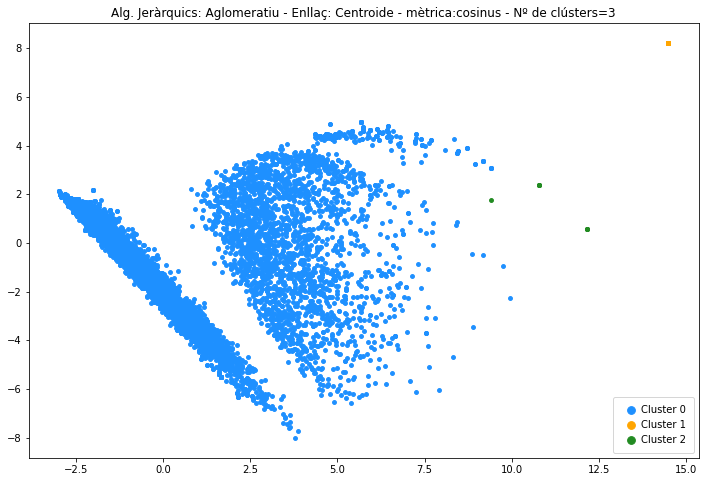

In [24]:
lnk='Centroide'
num_clusters=3
tall=hc.fcluster(Z6_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-{}_{}_cosine.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

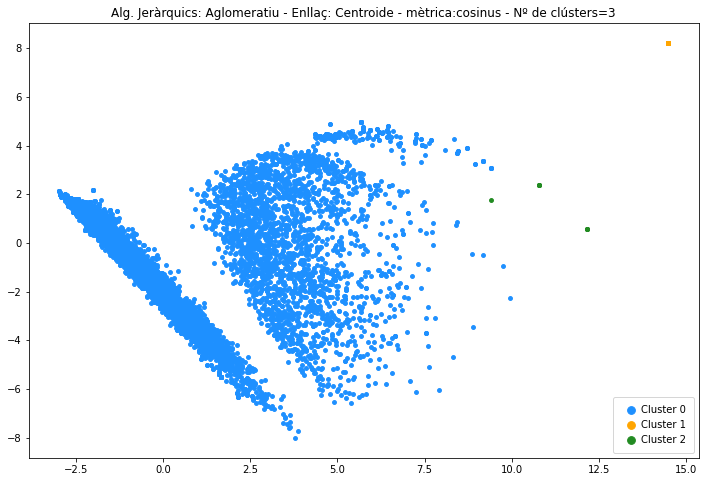

In [25]:
lnk='Centroide'
tall=hc.fcluster(Z6_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-{}_{}_cosine.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

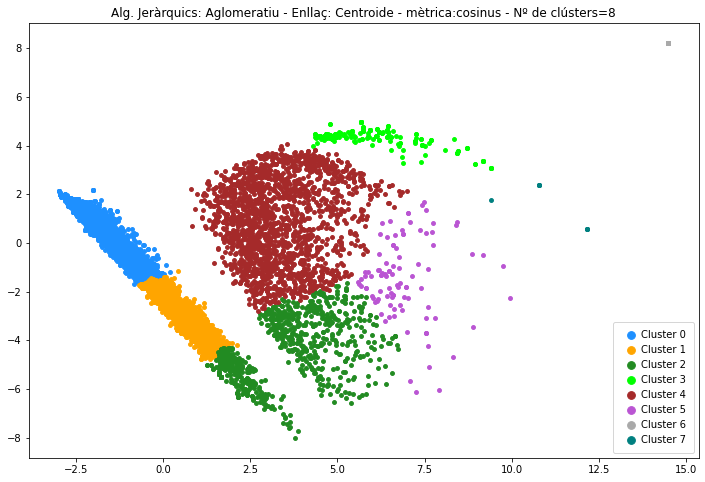

In [26]:
lnk='Centroide'
num_clusters=8
tall=hc.fcluster(Z6_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-{}_{}_cosine.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

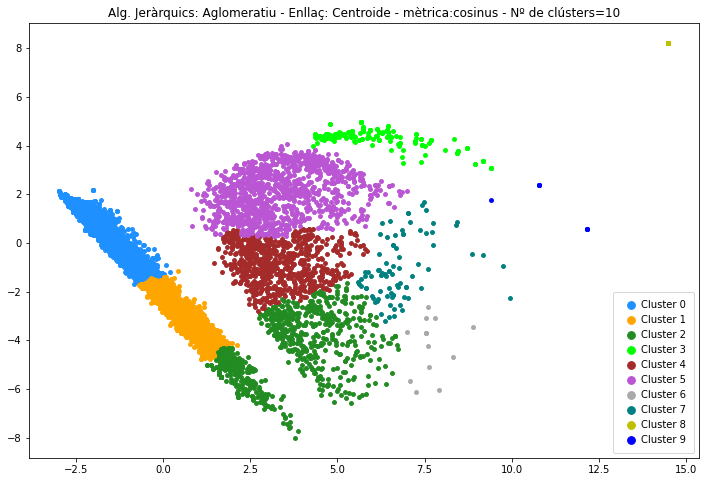

In [27]:
lnk='Centroide'
num_clusters=10
tall=hc.fcluster(Z6_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-{}_{}_cosine.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

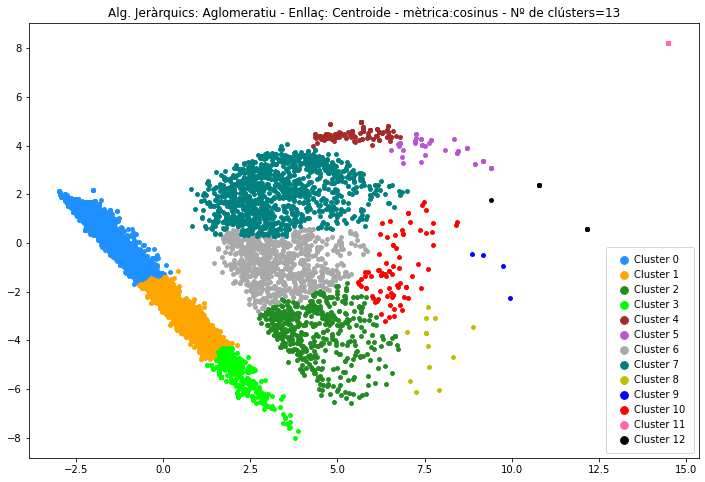

In [28]:
lnk='Centroide'
num_clusters=13
tall=hc.fcluster(Z6_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-{}_{}_cosine.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

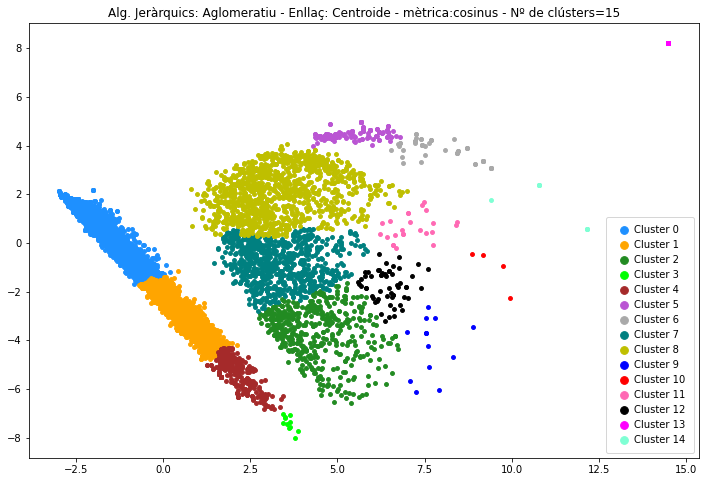

In [29]:
lnk='Centroide'
num_clusters=15
tall=hc.fcluster(Z6_c, num_clusters, criterion='maxclust')-1
colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
fig, ax = plt.subplots(figsize=(12,8))
ax.set_title("Alg. Jeràrquics: {} - Enllaç: {} - mètrica:cosinus - Nº de clústers={}".format("Aglomeratiu",lnk,num_clusters))
cmap = plt.cm.Spectral
norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
for idcluster in range(num_clusters):
    ax.scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
               np.array(X_PCA_cosine[:,1][tall==idcluster]), s=15, \
               c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
ax.legend(loc='lower right', handletextpad=0,borderpad=0.8,markerscale=2)
plt.savefig("je-{}_{}_cosine.jpg".format(lnk,num_clusters),format='jpg',bbox_inches='tight')
plt.show()

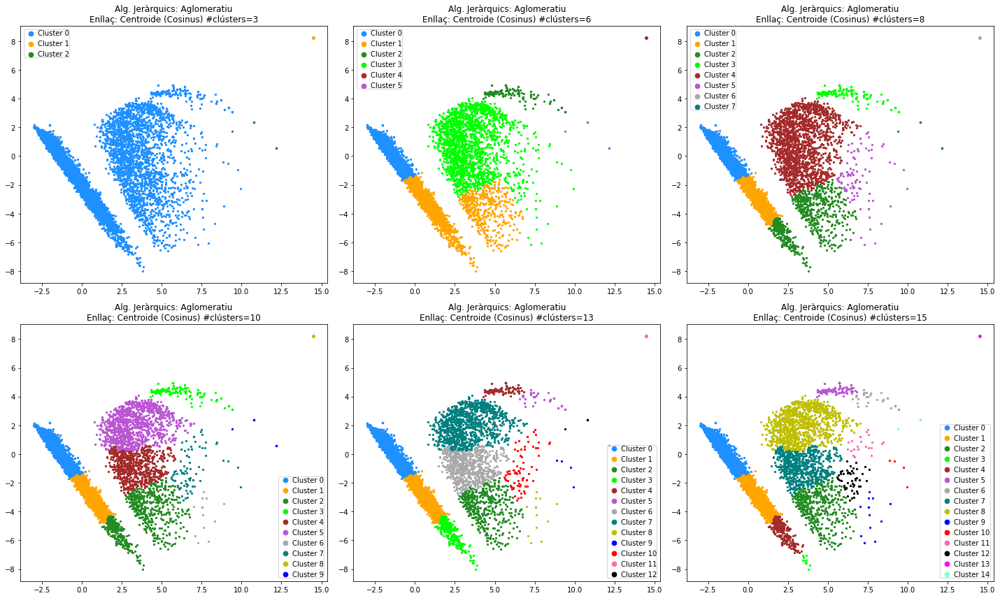

In [30]:
files=2
cols=3
lnk='Centroide (Cosinus)'
alt=20
ample=12
m=0
fig, ax = plt.subplots(files,cols,figsize=(alt,ample))

llista_clusters=[3,6,8,10,13,15]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.fcluster(Z6_c, num_clusters, criterion='maxclust')-1
        colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
        # Algorisme jeràrquic bottom-up
        #ahc = AgglomerativeClustering(n_clusters=num_clusters,linkage=lnk).fit(X_PCA)
        cmap = plt.cm.Spectral
        norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
        for idcluster in range(num_clusters):
            ax[i,j].scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
                       np.array(X_PCA_cosine[:,1][tall==idcluster]), s=5, \
                       c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
            ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        ax[i,j].legend(handletextpad=0,borderpad=0,markerscale=3)
        m=m+1
plt.tight_layout()
plt.savefig("last_Centroide_cosine.jpg",format='jpg',bbox_inches='tight')

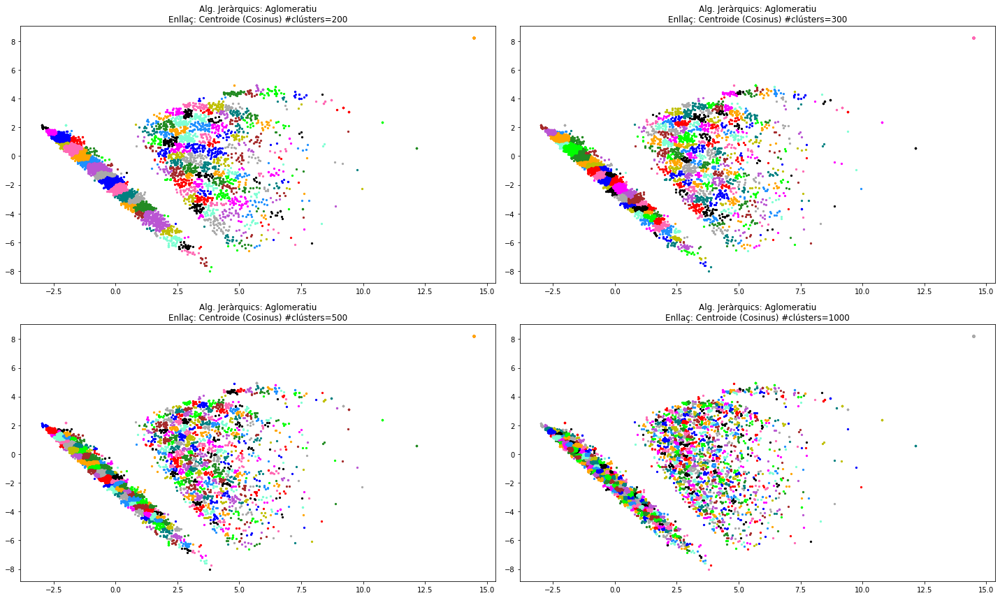

In [31]:
files=2
cols=2
lnk='Centroide (Cosinus)'
alt=20
ample=12
m=0
fig, ax = plt.subplots(files,cols,figsize=(alt,ample))

llista_clusters=[200,300,500,1000]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.fcluster(Z6_c, num_clusters, criterion='maxclust')-1
        colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
        cmap = plt.cm.Spectral
        norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
        for idcluster in range(num_clusters):
            ax[i,j].scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
                       np.array(X_PCA_cosine[:,1][tall==idcluster]), s=5, \
                       c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
            ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        #ax[i,j].legend(handletextpad=0,borderpad=0,markerscale=3)
        m=m+1
plt.tight_layout()
plt.savefig("last_Centroide_cosine_200_300_500_1000.jpg",format='jpg',bbox_inches='tight')

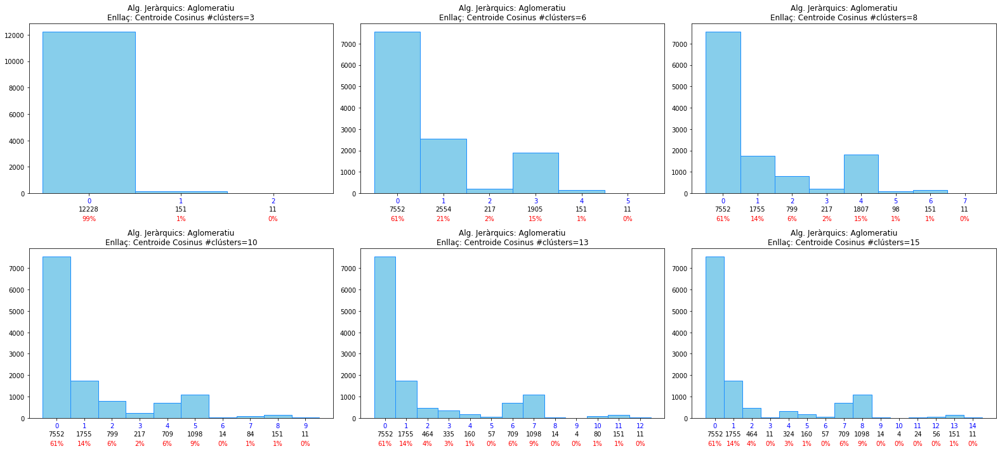

In [32]:
files=2
cols=3
lnk='Centroide Cosinus'
alt=10
ample=22
m=0
fig, ax = plt.subplots(files,cols,figsize=(ample, alt))
llista_clusters=[3,6,8,10,13,15]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.fcluster(Z6_c, num_clusters, criterion='maxclust')-1
        counts, bins, patches = ax[i,j].hist(tall, bins=np.array(range(0,num_clusters+1)), facecolor='skyblue', edgecolor='dodgerblue')
        ax[i,j].xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
        bin_centers = 0.5 * np.diff(bins) + bins[:-1]
        ax[i,j].set_xticks(bin_centers)
        ax[i,j].set_xticklabels(bins, rotation=0,color='b')
        ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        for count, x in zip(counts.astype(int), bin_centers):
            # Label the raw counts
            ax[i,j].annotate(str(count), xy=(x, 0), xycoords=('data', 'axes fraction'),
                xytext=(0, -20), textcoords='offset points', va='top', ha='center')
            # Label the percentages
            percent = '%0.0f%%' % (100 * float(count) / counts.sum())
            ax[i,j].annotate(percent, xy=(x, 0), xycoords=('data', 'axes fraction'),
                xytext=(0, -35), textcoords='offset points', va='top', ha='center',c='r')
        m=m+1
        plt.tight_layout()
        
plt.savefig("hist_Centroide_cosine.jpg",format='jpg',bbox_inches='tight')

# ANALITZANT ELS TUITS DE CADA CLUSTER - SEPARABILITAT

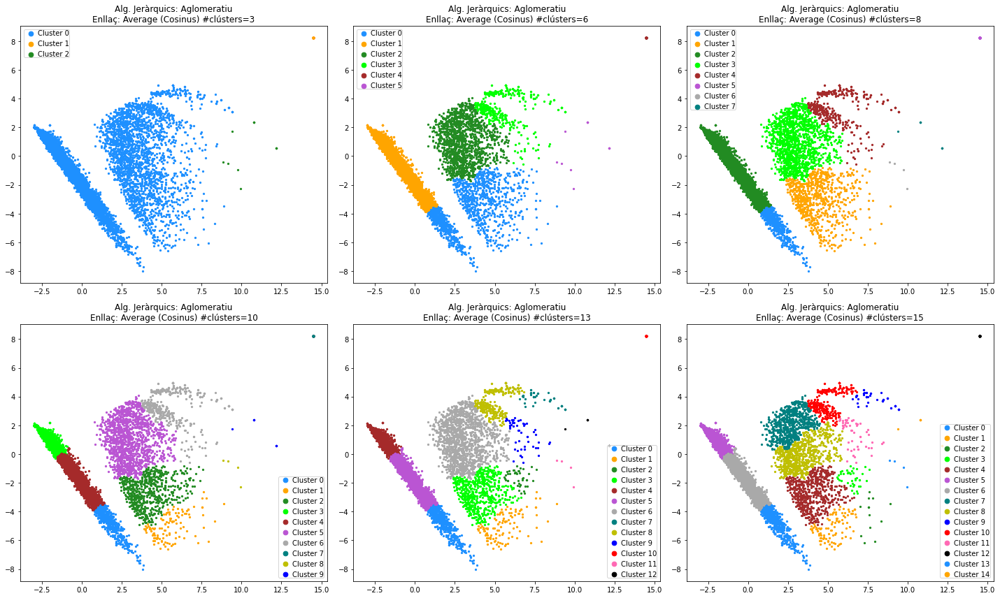

In [130]:
files=2
cols=3
lnk='Average (Cosinus)'
alt=20
ample=12
m=0
fig, ax = plt.subplots(files,cols,figsize=(alt,ample))

llista_clusters=[3,6,8,10,13,15]
for i in range(0,files):
    for j in range(0,cols):
        num_clusters=llista_clusters[m]
        tall=hc.fcluster(Z4_c, num_clusters, criterion='maxclust')-1
        colors = np.array(list(islice(cycle(['dodgerblue', 'orange', 'forestgreen',
                                     'lime', 'brown', 'mediumorchid',
                                     'darkgrey', 'teal', 'y',
                                     'blue','red','hotpink','black',
                                     'magenta','aquamarine']),
                                      int(len(set(tall))))))
        # Algorisme jeràrquic bottom-up
        #ahc = AgglomerativeClustering(n_clusters=num_clusters,linkage=lnk).fit(X_PCA)
        cmap = plt.cm.Spectral
        norm = plt.Normalize(vmin=0, vmax=num_clusters-1)
        for idcluster in range(num_clusters):
            ax[i,j].scatter(np.array(X_PCA_cosine[:,0][tall==idcluster]), \
                       np.array(X_PCA_cosine[:,1][tall==idcluster]), s=5, \
                       c = colors[idcluster], norm=norm, cmap=cmap, label="Cluster "+str(idcluster))
            ax[i,j].set_title("Alg. Jeràrquics: {}\nEnllaç: {} #clústers={}".format("Aglomeratiu",lnk,num_clusters))
        ax[i,j].legend(handletextpad=0,borderpad=0,markerscale=3)
        m=m+1
plt.tight_layout()


#### clusters Average cosinus

In [138]:
tokens_mes_propers(tall, tfidf_vect, matriu_tfidf,15)

Cluster 0: people million living awareness wide raise one support around help patients affected know families research 
Cluster 1: living awareness people million to raise around wide families support help patients learn us raising 
Cluster 2: million living people to awareness around raise wide one learn live families help many raising 
Cluster 3: to people million awareness suffer raise living support research one suffering affects help celebrate every 
Cluster 4: to people awareness million raise living patients support help us wide learn around one families 
Cluster 5: thank happy thanks latest syndrome great good like tomorrow international event years also health love 
Cluster 6: people support awareness patients research one us help know many raise families life every million 
Cluster 7: to celebrated give syndrome also diagnosed good learn like want time years every year work 
Cluster 8: to awareness support people one us many patients know research raise every year share help 